# Proyecto de Aprendizaje Supervisado [Raul Echeverry, Esteban y Fabian Salazar] Versión 2
- Con este proyecto aprenderemos como construir, entrenar y evaluar un modelo que resuelva una tarea de clasificación.
- Utilizaremos diversas librerías para la manipulación, análisis, visualización, modelado y evaluación de los datos.

### 1. Librerías a básicas utilizar

In [1]:
# Importar librerías

# Manejo de analísis de datos a través de dataframes (data tabular)
import pandas as pd
# Manipulación de arreglos y análisis numérico
import numpy as np
# Visualización de datos
import seaborn as sns
# Visualización de datos
import matplotlib.pyplot as plt
%matplotlib inline
#  Evitar mensajes de warning
import warnings
warnings.filterwarnings("ignore")

### 2. Diccionario de datos

1. location: Display de city or country where the data was taken. Cleveland, Hungría, Suiza (Country/city).
2. age: Displays the age of the patien; continuos from 28 to 77.
3. sex: Displays the gender of the patien using the following format : 1 = male 0 = female.
4. chest_pain_type: 1, 2, 3, 4 (1 = typical angina, 2 = atypical angina, 3 = non anginal pain, 4 = asymptotic).
5. resting_blood_pressure: Displays the resting blood pressure value of a patien in mmHg (unit); Continuos from 80 to 227
6. serum_cholestoral: Displays the serum cholestrol in mg/dl (unit); continuos from 0 to 564 in mg/dl 
7. fasting_blood_sugar: compares the fasting blood sugar value of the patien with 120mg/dl. If fasting blood sugar > 120mg/dl then : 1 (true) else : 0 (false)
8. resting_electrocardiographic_results: 0, 1, 2 (values 0,1,2) 0 = normal, 1 = having ST-T wave abnormality, 2 = left ventricular hyperthrophy
9. maximum_heart_rate_achieved: displays the max heart rate achieved by an patien. Continuos from 60 to 202
10. exercise_induced_angina: 0 = no, 1 = yes
11. oldpeak_ST_depression induced by exercise relative to rest: Continuos from -2 to 6.2
12. the_slope_of_the_peak_exercise_ST_segment: 1,2,3 (1 = upsloping 2 = flat 3 = downsloping)
13. number_of_major_vessels_colored_by_flourosopy: Number of major vessels (0,1,2,3) colored by flourosopy : displays the value as integer or float.
14. thal: displays the thalassemia: 3,6,7. (3 = normal 6 = fixed defect 7 = reversable defect)
15. target: Diagnosis of heart disease, displays whether the patien is suffering from heart disease or not : 0 = absence and 1,2,3,4 = present but in diferent state or with significants diferences between 1, 2, 3, and 4.

### 3. Lectura de los datos

Capturamos los datos a partir de un archivo csv. Al no tener los nombres de las columnas pero sí un diccionario de datos, renombramos al momento de obtener el dataframe.

In [2]:
df = pd.read_csv(r'https://raw.githubusercontent.com/alfa7g7/Gestion-estrategica-I/main/2_tareas_clasificacion/DatosCorazon.csv',
                 names=["location","age","sex","chest_pain_type","resting_blood_pressure","serum_cholestoral","fasting_blood_sugar",
                        "resting_electrocardiographic_results","maximum_heart_rate_achieved","exercise_induced_angina",
                        "oldpeak_ST_depression_induced_by_exercise","the_slope_of_the_peak_exercise_ST_segment",
                        "number_of_major_vessels_colored_by_fluorosopy","thal","target"],index_col=False,sep=';')
df

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,2
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,115,0,0,1,92,1,0,2,?,7,1
716,Suiza,70.0,1,4,140,0,1,0,157,1,2,2,?,7,3
717,Suiza,72.0,1,3,160,0,?,2,114,0,1.6,2,2,?,0
718,Suiza,73.0,0,3,160,0,0,1,121,0,0,1,?,3,1


### 4. Análisis Exploratorio de Datos

- Limpieza de datos
- Exploración de datos
- Ingeniería de datos

In [3]:
df.columns

Index(['location', 'age', 'sex', 'chest_pain_type', 'resting_blood_pressure',
       'serum_cholestoral', 'fasting_blood_sugar',
       'resting_electrocardiographic_results', 'maximum_heart_rate_achieved',
       'exercise_induced_angina', 'oldpeak_ST_depression_induced_by_exercise',
       'the_slope_of_the_peak_exercise_ST_segment',
       'number_of_major_vessels_colored_by_fluorosopy', 'thal', 'target'],
      dtype='object')

### 4.1 Limpieza de datos

### Valores faltantes y tipos de datos

Vamos a revisar los datos faltantes (explícitos e implícitos)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    int64  
 3   chest_pain_type                                720 non-null    int64  
 4   resting_blood_pressure                         720 non-null    object 
 5   serum_cholestoral                              720 non-null    object 
 6   fasting_blood_sugar                            720 non-null    object 
 7   resting_electrocardiographic_results           720 non-null    object 
 8   maximum_heart_rate_achieved                    720 non-null    object 
 9   exercise_induced_angina                        720 non

In [5]:
df.isnull().sum()

location                                         0
age                                              0
sex                                              0
chest_pain_type                                  0
resting_blood_pressure                           0
serum_cholestoral                                0
fasting_blood_sugar                              0
resting_electrocardiographic_results             0
maximum_heart_rate_achieved                      0
exercise_induced_angina                          0
oldpeak_ST_depression_induced_by_exercise        0
the_slope_of_the_peak_exercise_ST_segment        0
number_of_major_vessels_colored_by_fluorosopy    0
thal                                             0
target                                           0
dtype: int64

Al revisar los datos básicos observamos que a primera vista no existen datos faltantes. 

In [6]:
df.head()

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,2
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0


In [7]:
df.tail()

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
715,Suiza,70.0,1,4,115,0,0,1,92,1,0,2,?,7,1
716,Suiza,70.0,1,4,140,0,1,0,157,1,2,2,?,7,3
717,Suiza,72.0,1,3,160,0,?,2,114,0,1.6,2,2,?,0
718,Suiza,73.0,0,3,160,0,0,1,121,0,0,1,?,3,1
719,Suiza,74.0,1,2,145,0,?,1,123,0,1.3,1,?,?,1


Pero, tan sólo al analizar los últimos registros del dataset (fasting_blood_sugar), nos damos cuenta de datos con valores = ?. Esto, claramente, puede indicar datos faltantes. Para ratificar esta sospecha, tenemos que mirar en que columnas pueden estar apareciendo estos valores.

In [8]:
for var in df.select_dtypes(include=['object']).columns:
    cantidad = df[df[var] == '?'][var].count()
    print(f"Existen {cantidad} valores en {var} con el valor ?")

Existen 0 valores en location con el valor ?
Existen 3 valores en resting_blood_pressure con el valor ?
Existen 23 valores en serum_cholestoral con el valor ?
Existen 83 valores en fasting_blood_sugar con el valor ?
Existen 2 valores en resting_electrocardiographic_results con el valor ?
Existen 2 valores en maximum_heart_rate_achieved con el valor ?
Existen 2 valores en exercise_induced_angina con el valor ?
Existen 6 valores en oldpeak_ST_depression_induced_by_exercise con el valor ?
Existen 207 valores en the_slope_of_the_peak_exercise_ST_segment con el valor ?
Existen 413 valores en number_of_major_vessels_colored_by_fluorosopy con el valor ?
Existen 320 valores en thal con el valor ?


- Contamos, de todas las variables de tipo objeto (pues son las únicas que pueden contener un valor ?), contamos los valores en los que un valor ? aparece.

- A partir de los resutados podemos observar que existen 10 variables con valores de este tipo.

- Al tener tan pocos registros y tratarse de un estudio médico, no es bueno eliminar, así sean tan pocos, pero si queremos imputarlos debemos cambiarlos a nan

- De igual manera no podemos cambiar el valor de una variable categórica a numérica si existen datos con ?

- Cambiaremos los valores ? por nan, pero primero revisaremos tipos de datos inadecuados para todas las variables del dataset.

- Revisando detalladamente encontramos incongruencias ya que algunas variables tienen datos de distinto tipo al manifestado en el diccionario de datos   
    
    - sex debe ser categórico y no numérico
    - chest_pain_type debe ser categórico y no numérico
    - resting_blood_pressure debe ser numérico
    - serum_cholestoral debe ser numérico y no categórico
    - maximum_heart_rate_achieved debe ser numérico y no categórico
    - oldpeak_ST_depression_induced_by_exercise debe ser numérico y no categórico
    - target debe ser categórico y no numérico

In [9]:
df.dtypes

location                                          object
age                                              float64
sex                                                int64
chest_pain_type                                    int64
resting_blood_pressure                            object
serum_cholestoral                                 object
fasting_blood_sugar                               object
resting_electrocardiographic_results              object
maximum_heart_rate_achieved                       object
exercise_induced_angina                           object
oldpeak_ST_depression_induced_by_exercise         object
the_slope_of_the_peak_exercise_ST_segment         object
number_of_major_vessels_colored_by_fluorosopy     object
thal                                              object
target                                             int64
dtype: object

Antes de meternos la limpieza de datos debemos ver como están distribuidas las categorías de la clase objetivo target. Es importante conocer si nuestro conjunto de datos se encuentra balanceado o no.

<Axes: xlabel='target', ylabel='count'>

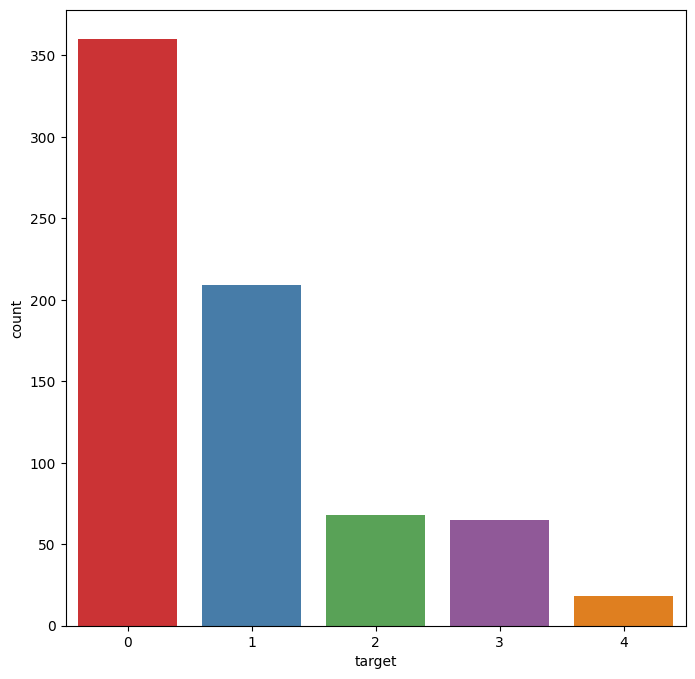

In [10]:
plt.figure(figsize=(8,8))
sns.countplot(x="target", data=df, palette = "Set1")

Construímos una tabla para ver las cantidades para cada categoría

In [11]:
pd.crosstab(index=df["target"], columns="count")

col_0,count
target,
0,360
1,209
2,68
3,65
4,18


Pocos valores para 2, 3 y 4 pero al tratarse del campo médico hay 2 caminos a seguir:
1. Reducimos todo a tiene (1) y no tiene (0).
2. Mantenemos las opciones ta lcual están pues se desconoce que acarréa que tenga afección cardiaca en 4, 3, 2, o 1. 

Teniendo en cuenta lo observado sobre la variable objetivo, creamos un transformer personalizado para realizar los cambios.

Creamos una función para cambiar los tipos de las variables independientes. Igualmente hacemos uso de un diccionario para transformar nuestros valores categóricos ordinales a numéricos.

In [12]:
# Creamos un Transformer personalizado formatea la variable objetivo
# Agrupamos valores con riesgo negativo
# Convertimos el tipo de la variable objetivo a categórica

from sklearn.base import BaseEstimator, TransformerMixin

class Format_target(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result.loc[(result.target > 0), "target"] = 1
        result['target'] = result['target'].astype(int).astype(str) #paso primero a entero para que no me quede decimal cuando lo pase a decimal
        return result

In [13]:
df_modified = Format_target().fit_transform(df)

<Axes: xlabel='target', ylabel='count'>

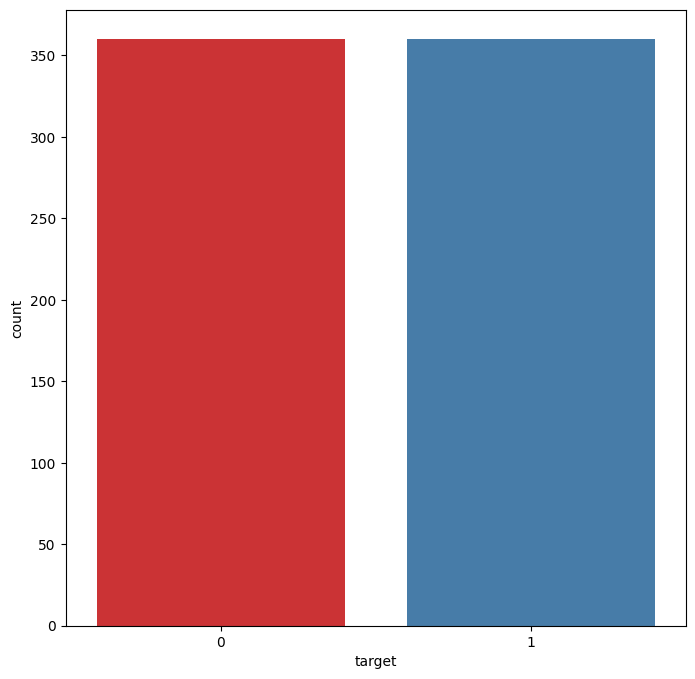

In [14]:
plt.figure(figsize=(8,8))
sns.countplot(x='target',data=df_modified, palette='Set1')

In [15]:
# Vemos la tabla luego del cambio

pd.crosstab(index=df_modified["target"], columns="count")

col_0,count
target,
0,360
1,360


Nuestro conjunto de datos parece más balanceado con respecto a la variable objetivo. Incluso, antes de realizar más cambios podemos observar la línea base que servirá como punto de partida  para los modelos que vamos a implementar. Al estar trabajando con una tarea de clasificación, utilizamos la clase mayoritaria, en este caso es el riesgo neutro.

In [16]:
df_modified['target'][df_modified['target'] == '0'].count()/df.shape[0]*100

50.0

**ACLARACIÓN**

De la forma anterior la variable target sería mucho más simple y fácil de trabajar pero de nuevo al tratarse de un tema de salud, médico y sabiendo que el ejercicio viene del origen de un análisis de ataques o infartos cardiacos en eseta versión lo abordaremos haciendo una fusión para simplmente para tratar de predecir si tiene o no una condición cardiaca enfermiza.

Ahora trabajaremos con los problemas encontrados en las variables independientes con respecto a valores que podrían ser faltantes y tipos de datos distintos a los indicados en el diccionario de datos.

In [17]:
def convert(df,columns,val):
    result = df.copy()
    for col in columns:
        result[col] = result[col].astype(val)
    return result


In [18]:
# Creamos un Transformer personalizado que nos cambia los valores ? por nulos
# Igualmente nos modifica los tipos de variables errados
class Format_variables(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = result.replace('?',np.nan)
        result = convert(result,['resting_blood_pressure','serum_cholestoral','maximum_heart_rate_achieved',
            'oldpeak_ST_depression_induced_by_exercise'],'float64')
        result = convert(result,['sex','chest_pain_type','target'],'object')
        return result 

In [19]:
df_modified = Format_variables().fit_transform(df_modified)

In [20]:
# Verificamos que los tipos de datos son los correctos
# Asimismo nos damos cuenta que ahora sí tenemos datos faltantes
df_modified.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    object 
 3   chest_pain_type                                720 non-null    object 
 4   resting_blood_pressure                         717 non-null    float64
 5   serum_cholestoral                              697 non-null    float64
 6   fasting_blood_sugar                            637 non-null    object 
 7   resting_electrocardiographic_results           718 non-null    object 
 8   maximum_heart_rate_achieved                    718 non-null    float64
 9   exercise_induced_angina                        718 non

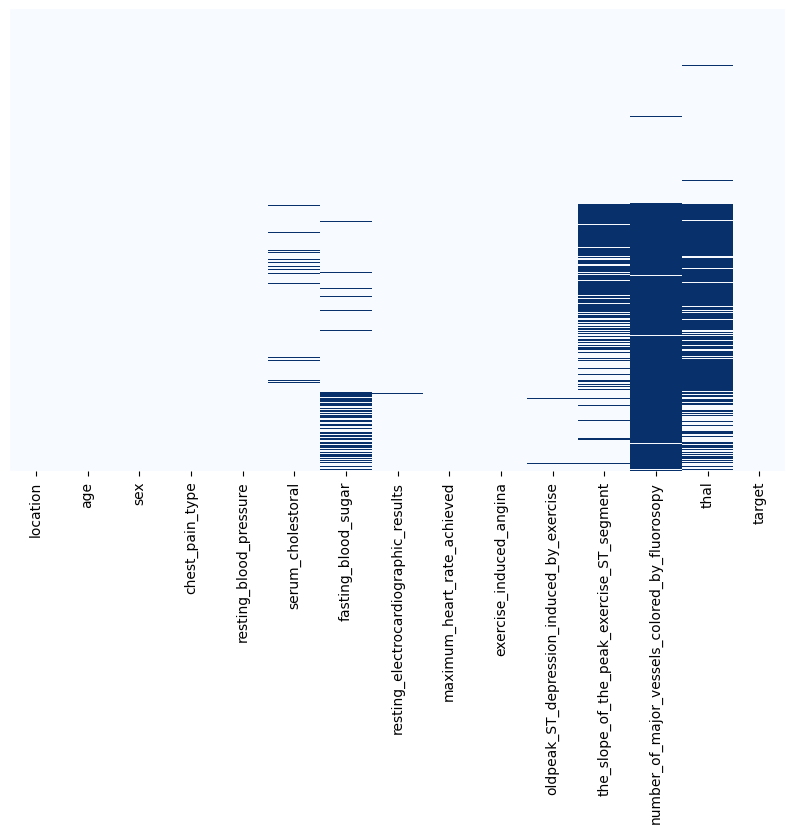

In [21]:
# Dibujamos un mapa de calor para vislumbrar la ubicación de los valores faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_modified.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

In [22]:
df_modified.isnull().sum()

location                                           0
age                                                0
sex                                                0
chest_pain_type                                    0
resting_blood_pressure                             3
serum_cholestoral                                 23
fasting_blood_sugar                               83
resting_electrocardiographic_results               2
maximum_heart_rate_achieved                        2
exercise_induced_angina                            2
oldpeak_ST_depression_induced_by_exercise          6
the_slope_of_the_peak_exercise_ST_segment        207
number_of_major_vessels_colored_by_fluorosopy    413
thal                                             320
target                                             0
dtype: int64

Cada columna tiene 720 registros y de las 15 (14 independientes y 1 dependiente) tenemos 10 con datos faltantes.

- resting_blood_pressure:                       3 faltantes
- serum_cholestoral:                            23 faltantes
- fasting_blood_sugar:                          83 faltantes
- resting_electrocardiographic_results:         2 faltantes
- maximum_heart_rate_achieved:                  2 faltantes
- exercise_induced_angina:                      2 faltantes
- oldpeak_ST_depression_induced_by_exercise:    6 faltantes
- the_slope_of_the_peak_exercise_ST_segment     207 faltantes
- number_of_major_vessels_colored_by_fluorosopy 413 faltantes
- thal                                          320 faltantes

¿Cómo manejar estos valores faltantes?
- Eliminar columnas o registros.
- Imputar con la media, frecuencia o con base en alguna función

En este caso trabajaremos de la siguiente manera:
- Imputación con la media (numéricas):
    - resting_blood_pressure
    - serum_cholestoral
    - maximum_heart_rate_achieved
    - oldpeak_ST_depression_induced_by_exercise
- Imputación con la moda:
    - fasting_blood_sugar
    - resting_electrocardiographic_results
    - exercise_induced_angina
    - the_slope_of_the_peak_exercise_ST_segment
    - thal
    - number_of_major_vessels_colored_by_fluorosopy

In [23]:
df_modified

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,1
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,115.0,0.0,0,1,92.0,1,0.0,2,NaN,7,1
716,Suiza,70.0,1,4,140.0,0.0,1,0,157.0,1,2.0,2,NaN,7,1
717,Suiza,72.0,1,3,160.0,0.0,NaN,2,114.0,0,1.6,2,2,NaN,0
718,Suiza,73.0,0,3,160.0,0.0,0,1,121.0,0,0.0,1,NaN,3,1


**ACLARACIÓN**
Al ser datos de estudios médicos estas imputaciones no deberían hacerse, pero con el fin de seguir el ejercicio académico se procede. Tenemos entendidos que hay métodos para imputación de datos médicos como el MICE y otros. 

De ser posible profe nos podría señalar hacía donde podríamos ver esto. O si por lo contrario estamos siendo demasiado precavidos.

In [24]:
# Creamos un Transformer personalizado que nos imputa los valores faltantes
# Utiliza la media para columnas numéricas y la moda para las categóricas
class Imputer(BaseEstimator, TransformerMixin):
    def __init__(self, cont, cat):
        self.cont = cont
        self.cat = cat

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        for c in self.cont:
            avg = result[c].mean(axis=0)
            result[c].replace(np.nan,avg,inplace=True)
        for c in self.cat:
            mode = result[c].value_counts().idxmax()
            result[c].replace(np.nan,mode,inplace=True)
        return result

In [25]:
cont = ['resting_blood_pressure', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise'
        ]
cat = ['fasting_blood_sugar', 'resting_electrocardiographic_results', 'exercise_induced_angina', 'the_slope_of_the_peak_exercise_ST_segment',
       'thal', 'number_of_major_vessels_colored_by_fluorosopy']

df_modified = Imputer(cont,cat).fit_transform(df_modified)

In [26]:
df_modified.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    object 
 3   chest_pain_type                                720 non-null    object 
 4   resting_blood_pressure                         720 non-null    float64
 5   serum_cholestoral                              720 non-null    float64
 6   fasting_blood_sugar                            720 non-null    object 
 7   resting_electrocardiographic_results           720 non-null    object 
 8   maximum_heart_rate_achieved                    720 non-null    float64
 9   exercise_induced_angina                        720 non

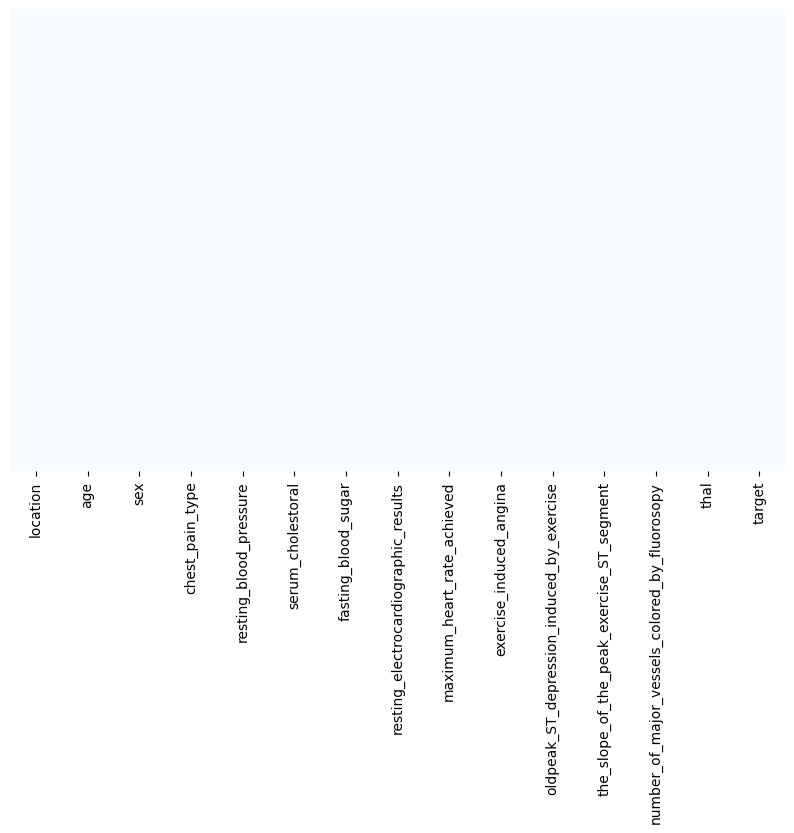

In [27]:
# Dibujamos un mapa de calor para vislumbrar la ubicación de los valores faltantes

plt.figure(figsize=(10,6))
sns.heatmap(df_modified.isnull(), yticklabels = False, cbar = False, cmap="Blues")
plt.show()

Observamos que ya no contamos con valores faltantes.

### Valores atípicos
Visualizamos utilizando
- Diagramas de cajas y bigotes
- Histogramas

In [65]:
# Función para graficar los valores continuos del dataframe
#def outliers_visual(data):
    #cont_vars = list(data.select_dtypes('number').columns)
    #plt.figure(figsize=(15, 60))
    #i = 0
    #val = int(len(cont_vars)/2) + 1
    #for col in cont_vars:
        #i += 1
        #plt.subplot(val, 4, i)
        #plt.boxplot(data[col])
        #plt.title('{} boxplot'.format(col))
        #i += 1
        #plt.subplot(val, 4, i)
        #plt.hist(data[col])
        #plt.title('{} histogram'.format(col))
        
    #plt.show()

In [28]:
# Función para graficar los valores continuos del dataframe
def outliers_visual(data):
    cont_vars = list(data.select_dtypes('number').columns)
    plt.figure(figsize=(15, len(cont_vars)*5))
    for i, col in enumerate(cont_vars):
        plt.subplot(len(cont_vars), 2, 2*i+1)
        plt.boxplot(data[col])
        plt.title('{} boxplot'.format(col))
        plt.subplot(len(cont_vars), 2, 2*i+2)
        plt.hist(data[col])
        plt.title('{} histogram'.format(col))
    plt.tight_layout()
    plt.show()


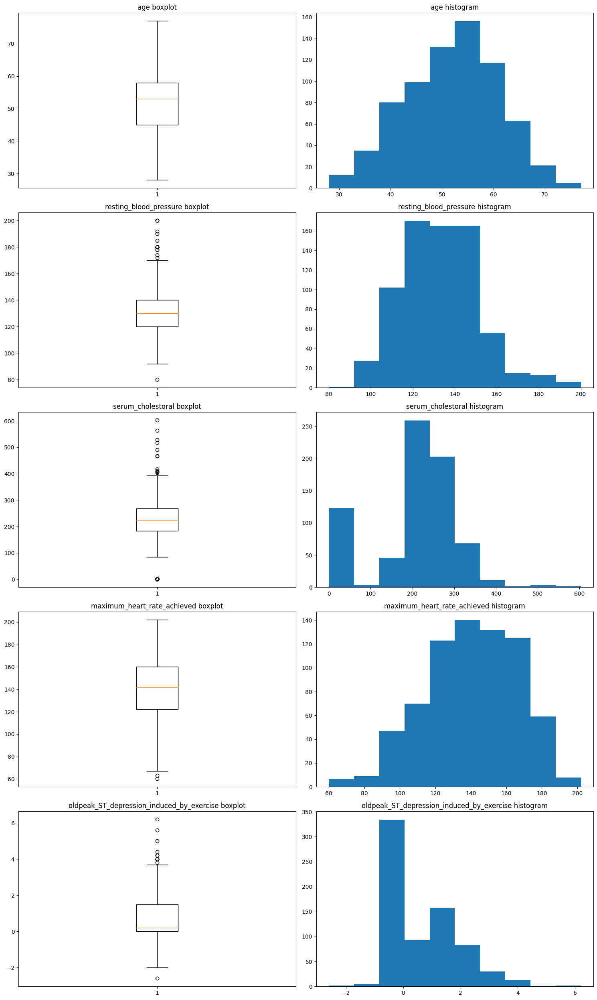

In [29]:
outliers_visual(df_modified)

In [30]:
df_modified

,location,age,sex,chest_pain_type,resting_blood_pressure,serum_cholestoral,fasting_blood_sugar,resting_electrocardiographic_results,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,145.0,233.0,1,2,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,160.0,286.0,0,2,108.0,1,1.5,2,3,3,1
2,Cleveland,67.0,1,4,120.0,229.0,0,2,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,130.0,250.0,0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,130.0,204.0,0,2,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,115.0,0.0,0,1,92.0,1,0.0,2,0,7,1
716,Suiza,70.0,1,4,140.0,0.0,1,0,157.0,1,2.0,2,0,7,1
717,Suiza,72.0,1,3,160.0,0.0,0,2,114.0,0,1.6,2,2,3,0
718,Suiza,73.0,0,3,160.0,0.0,0,1,121.0,0,0.0,1,0,3,1


Utilizando los gráficos anteriores podemos observar las distribuciones para cada variable continua.

Visualmente resulta claro que existen outliers para algunas de las variables dentro del dataset:
- resting_blood_pressure
- serum_cholestoral
- maximum_heart_rate_achieved
- oldpeak_ST_depression_induced_by_exercise
- number_of_major_vessels_colored_by_fluorosopy

Podemos corroborar lo anterior de manera estadística haciendo uso del método de Tukey (se consideran como datos atípicos aquellos que están 1.5 veces por fuera del rango intercuartil)

In [31]:
# Función para calcular los datos atípicos utilizando el método de Tukey
def outlier_count(col, data):
    print(15*'-' + col + 15*'-')
    q75, q25 = np.percentile(data[col], [75, 25])
    iqr = q75 - q25
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    print('Number of outliers: {}'.format(outlier_count))
    print('Percent of data that is outlier: {}%'.format(outlier_percent))
    return outlier_count

In [32]:
# Guardar las columnas de tipo continuas con datos atípicos
cont_vars = []
for col in list(df_modified.select_dtypes('number').columns):
    if outlier_count(col, df_modified) > 0:
        cont_vars.append(col)

---------------age---------------
Number of outliers: 0
Percent of data that is outlier: 0.0%
---------------resting_blood_pressure---------------
Number of outliers: 22
Percent of data that is outlier: 3.06%
---------------serum_cholestoral---------------
Number of outliers: 135
Percent of data that is outlier: 18.75%
---------------maximum_heart_rate_achieved---------------
Number of outliers: 2
Percent of data that is outlier: 0.28%
---------------oldpeak_ST_depression_induced_by_exercise---------------
Number of outliers: 12
Percent of data that is outlier: 1.67%


Teniendo en cuenta los gráficos previos y los estadísticos, se puede ver que existen cantidades diferentes de outliers para cada variable y hacia diferentes direcciones. Limitaremos a través de winsorizing

In [33]:
from scipy.stats.mstats import winsorize

wins_dict = {}

def test_wins(col, df, wins_dict, lower_limit=0, upper_limit=0, show_plot=True):
    wins_data = winsorize(df[col], limits=(lower_limit, upper_limit))
    wins_dict[col] = wins_data
    if show_plot == True:
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        plt.boxplot(df[col])
        plt.title('original {}'.format(col))
        plt.subplot(122)
        plt.boxplot(wins_data)
        plt.title('wins=({},{}) {}'.format(lower_limit, upper_limit, col))
        plt.show()
    return wins_dict

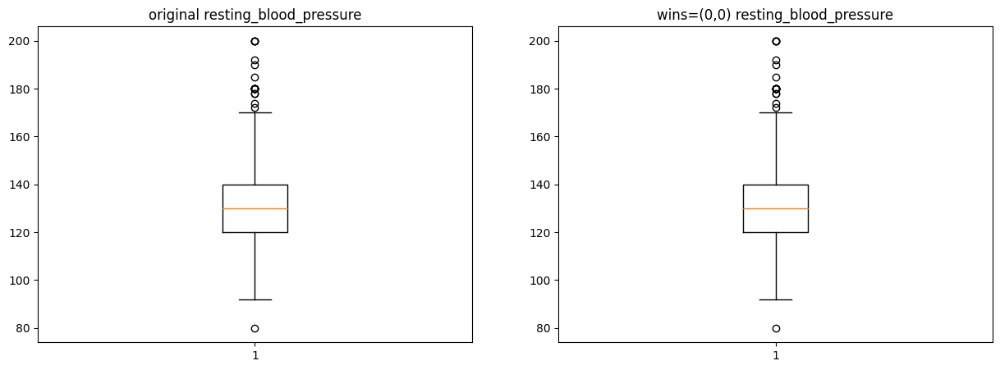

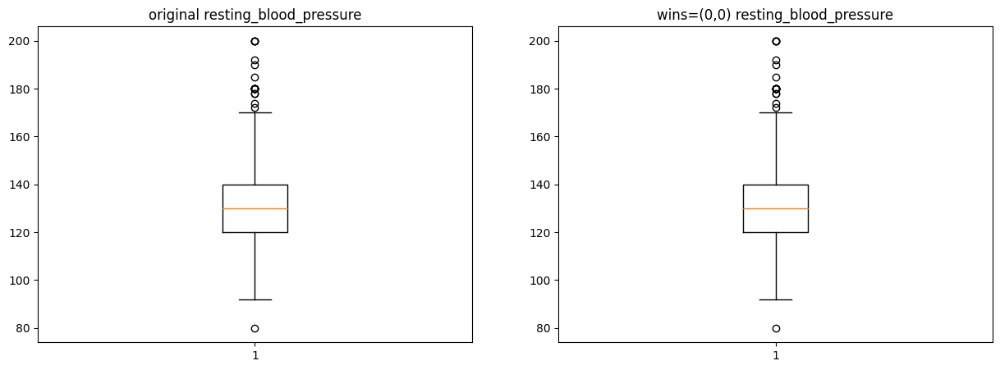

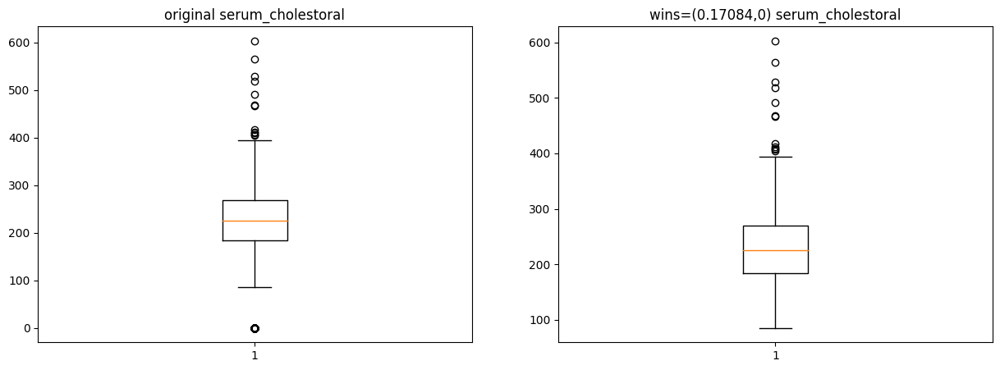

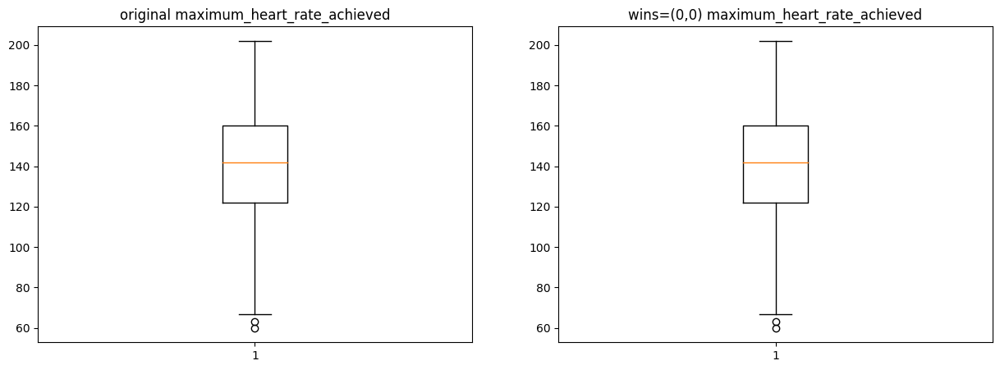

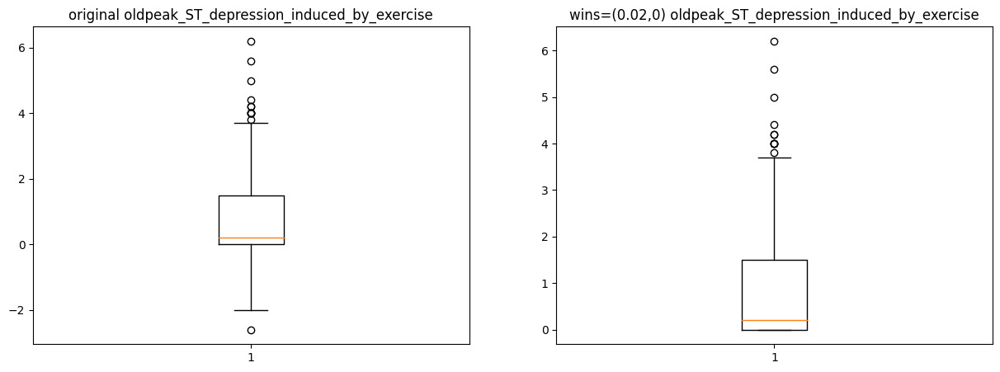

In [34]:
# Verificación de la winsorizing
wins_dict = {}
wins_dict = test_wins(cont_vars[0], df_modified, wins_dict, upper_limit=0, show_plot=True) #NO se ajusta
wins_dict = test_wins(cont_vars[0], df_modified, wins_dict, lower_limit=0, show_plot=True) #NO se ajusta
wins_dict = test_wins(cont_vars[1], df_modified, wins_dict, lower_limit=.17084, show_plot=True) #Se ajusta 
wins_dict = test_wins(cont_vars[2], df_modified, wins_dict, lower_limit=0, show_plot=True) #NO se ajusta
wins_dict = test_wins(cont_vars[3], df_modified, wins_dict, lower_limit=.02, show_plot=True) #Se ajusta


In [35]:
# Creamos un Transformer personalizado para limitar los outliers con el winsorizing
class Winsorizer(BaseEstimator, TransformerMixin):
    def __init__(self, wins, cont_vars):
        self.wins = wins
        self.cont_vars = cont_vars
        
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        for col in cont_vars:
            result[col] = self.wins[col]     
        return result

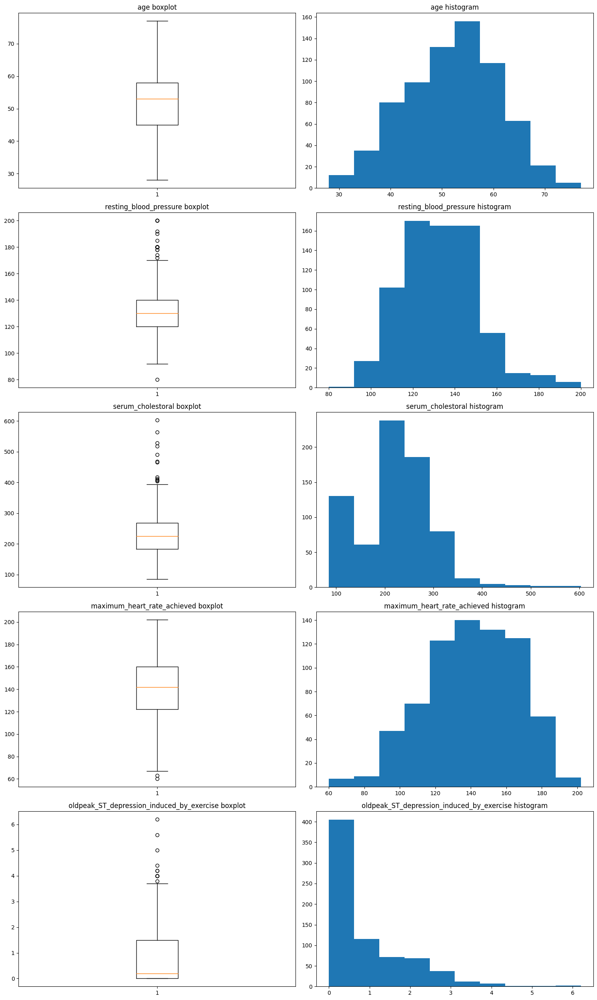

In [36]:
df_wins = Winsorizer(wins_dict,cont_vars).fit_transform(df_modified)
outliers_visual(df_wins)

**Aclaración**

Por motivos académicos decidimos hacer el protocolo para acomodar ciertos datos atípicos tratando de ceñirnos a conceptos de especialistas en el tema.

De acuerdo a eso al final solo se ajustaron 2 variables en sus límites bajos:
- serum_cholestoral (No hay valores de colesterol 0 en pacientes en la vida real)

- oldpeak_ST_depression_induced_by_exercise (No hay medidas o valores negativos en el segmento ST)

Todo esto teniendo en cuenta el dictamen de expertos. Claramente todo esto viene desde la imputación y demás creemos. 

Las demás variables que presentaban atípicos estadísticos no se modificaron o ajustaron debido a que representan valores reales que pueden tomar o tener un paciente.

### 4.2 Exploración de datos

#### Análisis univariado

In [37]:
# Descriptores estadísticos para valores continuos
df_wins.describe()

,age,resting_blood_pressure,serum_cholestoral,maximum_heart_rate_achieved,oldpeak_ST_depression_induced_by_exercise
count,720.000000,720.000000,720.000000,720.000000,720.000000
mean,51.888889,131.804742,219.295582,140.565460,0.806580
std,9.193720,18.490635,81.416504,25.611477,1.037402
min,28.000000,80.000000,85.000000,60.000000,0.000000
25%,45.000000,120.000000,184.000000,122.000000,0.000000
50%,53.000000,130.000000,225.000000,142.000000,0.200000
75%,58.000000,140.000000,269.000000,160.000000,1.500000
max,77.000000,200.000000,603.000000,202.000000,6.200000


In [38]:
# Descriptores estadísticos para valores categóricos
df_wins.describe(include='O')

,location,sex,chest_pain_type,fasting_blood_sugar,resting_electrocardiographic_results,exercise_induced_angina,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
count,720,720,720,720,720,720,720,720,720,720
unique,3,2,4,2,3,2,5,5,5,2
top,Cleveland,1,4,0,0,0,2,0,3,0
freq,303,532,365,650,473,478,497,590,510,360


In [39]:
# Función para visualizar las distribuciones de las variables continuas
def visualize_distributions(df):
    cols = df.select_dtypes('number').columns
    val = int(len(cols)/2)+1
    plt.figure(figsize=(15, 20))
    for i, col in enumerate(cols, 1):
        plt.subplot(val, 3, i)
        plt.hist(df[col])
        plt.title(col)

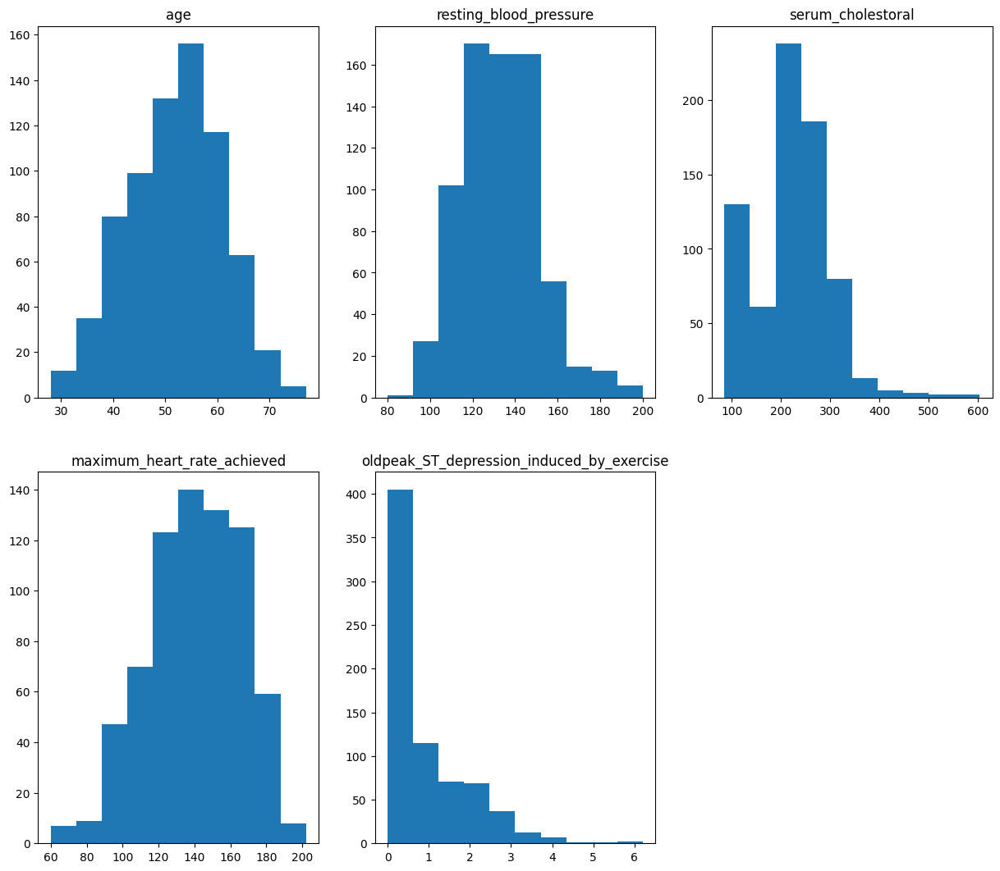

In [40]:
# Visualizamos la distribución de las variables continuas
visualize_distributions(df_wins)

Ahora demos un vistazo a las variables categóricas para ver su distribución y saber si necesitan algún ajuste:

In [41]:
# Función para visualizar las distribuciones de las variables categóricas
def visualize_distributions_cat(df):
    cols = df.select_dtypes('object').columns
    val = int(len(cols)/2)+1
    plt.figure(figsize=(15, 25))
    for i, col in enumerate(cols, 1):
        plt.subplot(val, 3, i)
        plt.hist(df[col])
        plt.title(col)

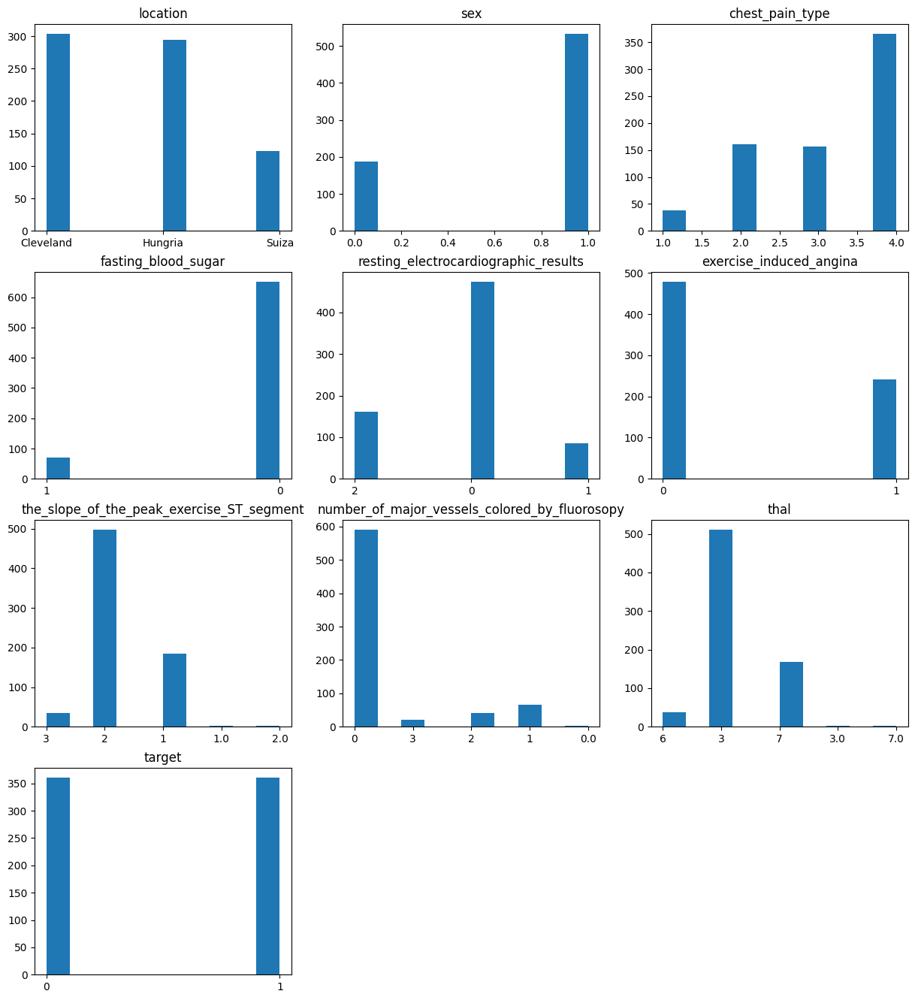

In [42]:
# Visualizamos la distribución de las variables categóricas
visualize_distributions_cat(df_wins)

Observamos que algunas han creados otros valores únicos debido a que tienen datos flotantes cuando deberían ser enteros, procedemos a hacer la transformación.
Como se evidencia en las variables:
- the_slope_of_the_peak_exercise_ST_segment
- number_of_major_vessels_colored_by_fluorosopy
- thal

In [43]:
# transformacion de variables con decimales ya sean flotantes o caracteres con .0 a caracteres
# o string para que no tengamos valores como 1 y 1.0 etc. Según gráficas
def transform_float_int_str(data, columnas):
    for columna in columnas:
        data[columna] = data[columna].astype(float).astype(int).astype(str)
    return data

# Lista de variables categóricas
variables_categoricas = ['the_slope_of_the_peak_exercise_ST_segment', 
                         'number_of_major_vessels_colored_by_fluorosopy', 'thal']

# Aplicar la función al dataframe
df_wins = transform_float_int_str(df_wins, variables_categoricas)

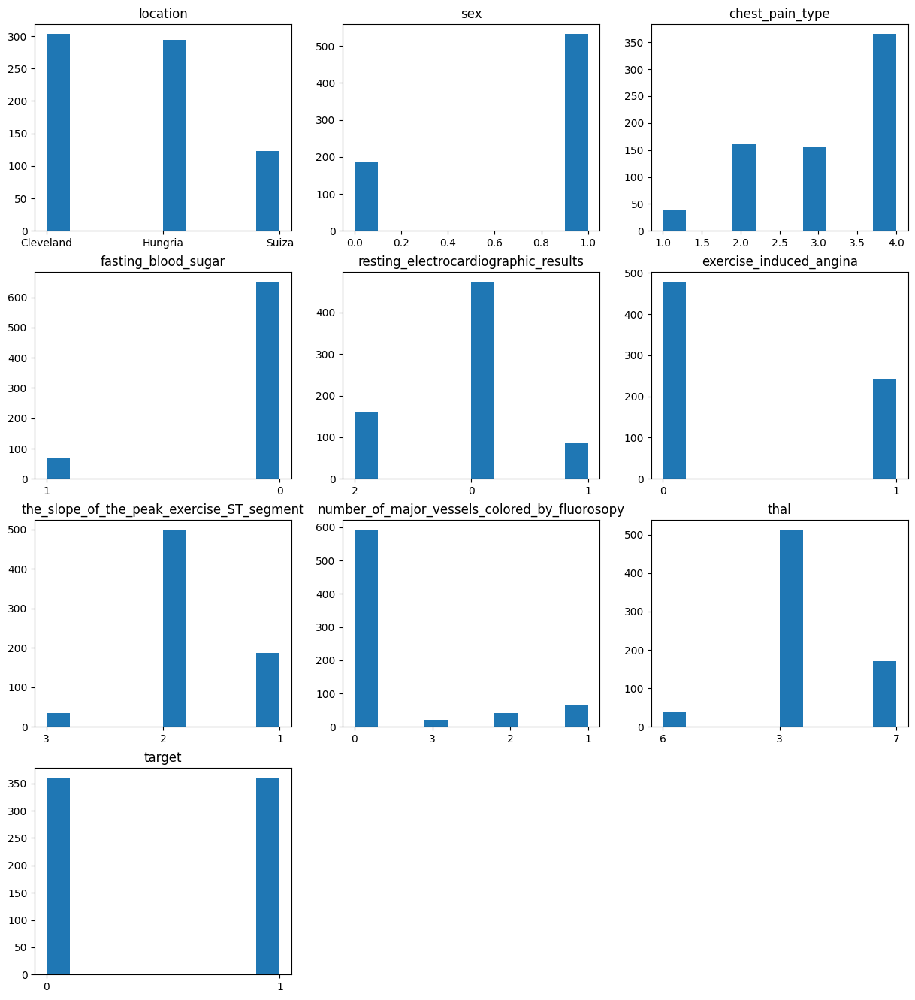

In [44]:
# Visualizamos la distribución de las variables categóricas
visualize_distributions_cat(df_wins)

Luego de realizar la limpieza de datos, imputando datos y winsorizing, logramos percibir distribuciones menos sesgadas.

Text(0.5, 0, 'sex')

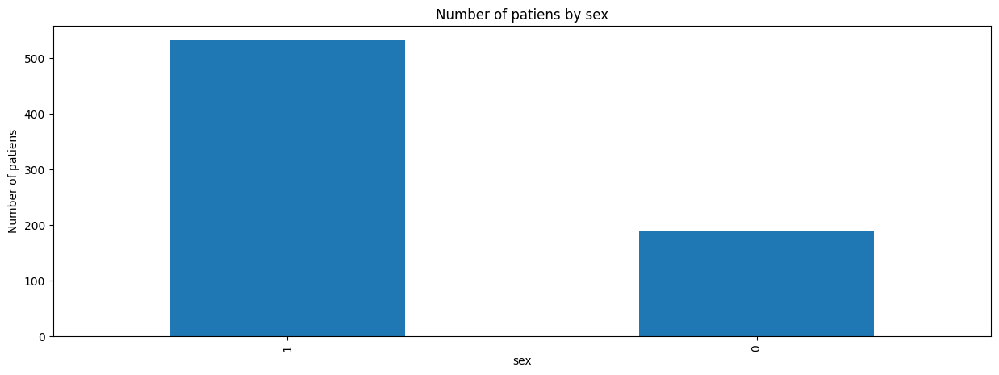

In [45]:
df_wins.sex.value_counts().nlargest(10).plot(kind='bar', figsize=(15,5))
plt.title("Number of patiens by sex")
plt.ylabel('Number of patiens')
plt.xlabel('sex')

Text(0.5, 0, 'chest pain type')

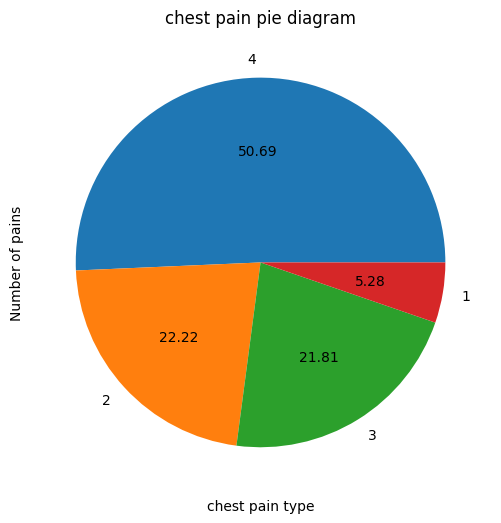

In [46]:
df_wins['chest_pain_type'].value_counts().plot.pie(figsize=(6, 6), autopct='%.2f')
plt.title("chest pain pie diagram")
plt.ylabel('Number of pains')
plt.xlabel('chest pain type')

Text(0.5, 0, 'serum_cholestoral')

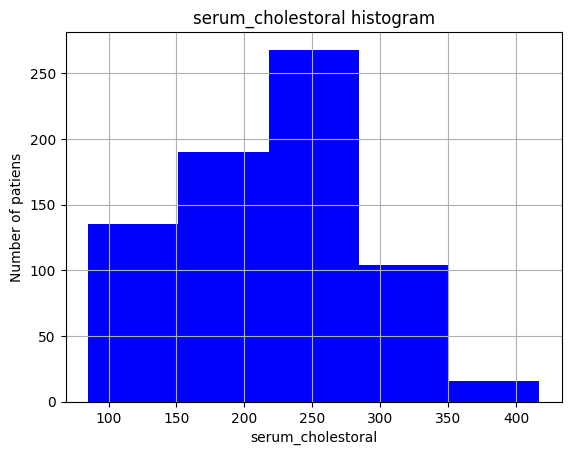

In [47]:
df_wins.serum_cholestoral[np.abs(df_wins.serum_cholestoral-df_wins.serum_cholestoral.mean())<=(3*df_wins.serum_cholestoral.std())].hist(bins=5,color='blue');
plt.title("serum_cholestoral histogram")
plt.ylabel('Number of patiens')
plt.xlabel('serum_cholestoral')

Text(0.5, 0, 'oldpeak_ST_depression_induced_by_exercise')

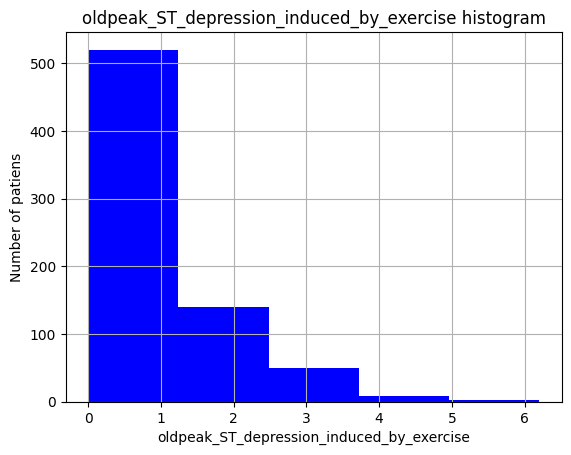

In [48]:
df_wins['oldpeak_ST_depression_induced_by_exercise'].hist(bins=5,color='blue')
plt.title("oldpeak_ST_depression_induced_by_exercise histogram")
plt.ylabel('Number of patiens')
plt.xlabel('oldpeak_ST_depression_induced_by_exercise')

Text(0.5, 0, 'number_of_major_vessels_colored_by_fluorosopy')

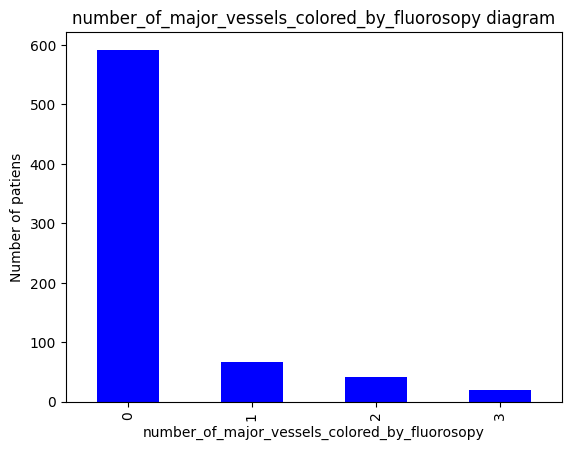

In [49]:
df_wins['number_of_major_vessels_colored_by_fluorosopy'].value_counts().plot(kind='bar',color='blue')
plt.title("number_of_major_vessels_colored_by_fluorosopy diagram")
plt.ylabel('Number of patiens')
plt.xlabel('number_of_major_vessels_colored_by_fluorosopy')

Text(0.5, 0, 'thal')

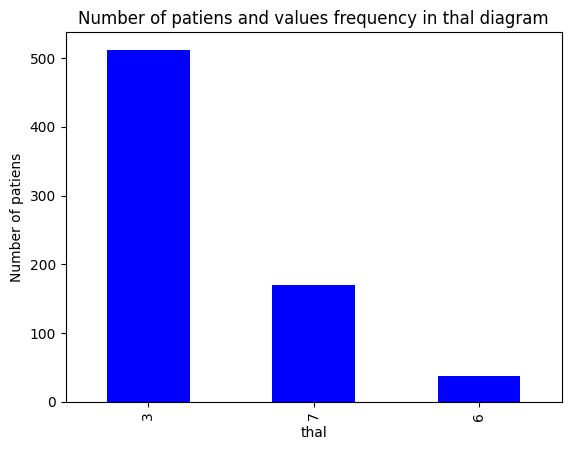

In [50]:
df_wins['thal'].value_counts().plot(kind='bar',color='blue')
plt.title("Number of patiens and values frequency in thal diagram")
plt.ylabel('Number of patiens')
plt.xlabel('thal')

Text(0.5, 0, 'exercise_induced_angina')

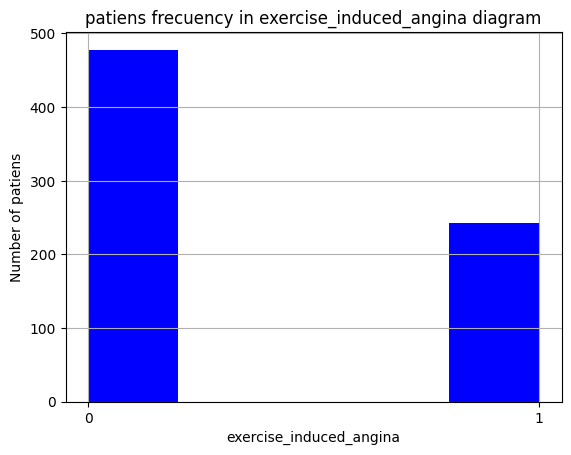

In [51]:
df_wins['exercise_induced_angina'].hist(bins=5,color='blue')
plt.title("patiens frecuency in exercise_induced_angina diagram")
plt.ylabel('Number of patiens')
plt.xlabel('exercise_induced_angina')

A partir del anterior del anterior análisis obtenemos los siguientes hallazgos:

- La población predomina en sexo = 1, se asume es másculino segun investigacíon del origen de la tarea. manejando un poco más del doble de la población con sexo = 0 femenino.
- El dolor de pecho que predomina es el tipo 4 contando con mas del 50% del total.
- Los valores de colesterol en sangre predominan en valores en rango normales 
- El último pico o medida des un ataque de segmento ST muestra gran población sin afección.
- thal, muestra que el tipo que predomina es el 3, el cual indica normalidad segun investigación.

#### Análisis Bivariado

Haciendo uso del diagrama de cajas y bigotes obtendremos un resumen visual de la distribución de cada una de las variables independientes con respecto a la dependiente, observando así la distribución de los distintos grupos.

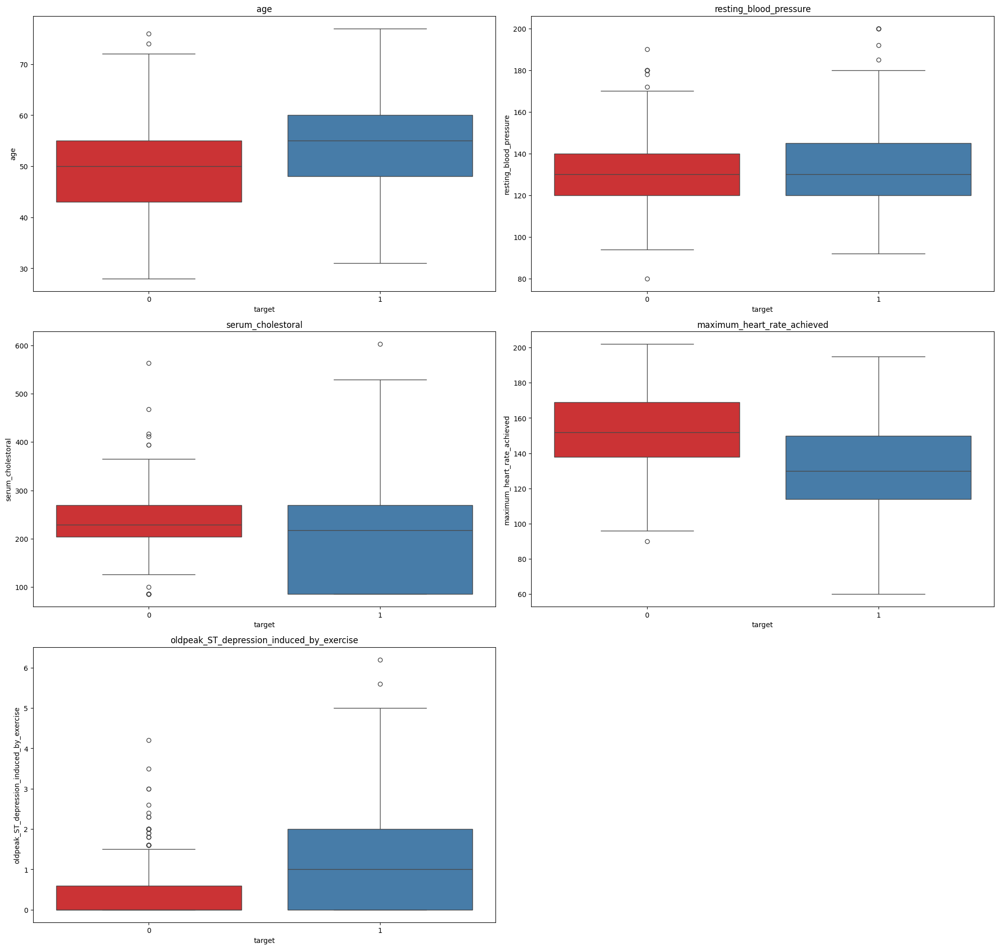

In [52]:
fig = plt.figure(figsize=(20,50))
i=1

for var_num in df_wins.select_dtypes(include=['int64','float64']):
    ax = fig.add_subplot(8, 2, i)
    sns.boxplot(x=df_wins.columns[14], y=var_num, data=df_wins, palette='Set1')
    plt.title(var_num)
    i+=1
fig.tight_layout()

Conociendo un poco acerca de las distribuciones de las variables con respecto a la variable objetivo, nos podemos dar una primera idea sobre cuáles características podrían resultar siendo más importantes al momento de influir en la variable objetivo. Esto resulta útil pues al incluirlas, nuestro modelo puede brindarnos mejores resultados en cuanto a correctitud de la predicción.

Observando las medianas de cada grupo (características) nos puede mostrar si verdaderamente existe una relación entre dicha variable independiente y la objetivo.

El tamaño de la caja nos puede mostrar la variabilidad dentro de esa característica.

Por ejemplo podemos notar que:

- age evidentemente indica una relación directamente proporcional con el target (Diagnostico de enfermedad cardiaca). Es decir, mayores edades claramente indica mayor valor de target, que en otras palabras es una mayor posibilidad de enfermedad cardiaca.
- mayor tamaño del oldpeak asociado a mayor riesgo de enfermedad cardiaca (target más alto)

Para ratificar algunos de estos descubrimientos utilizamos un diagrama de violín. Al ser estos unos diagramas que combinan los boxplots y los diagramas de densidad, nos pueden dar una noción de qué variables independientes pueden sernos de mayor untilidad para distinguir entre las distintas categorías de la variable objetivo.


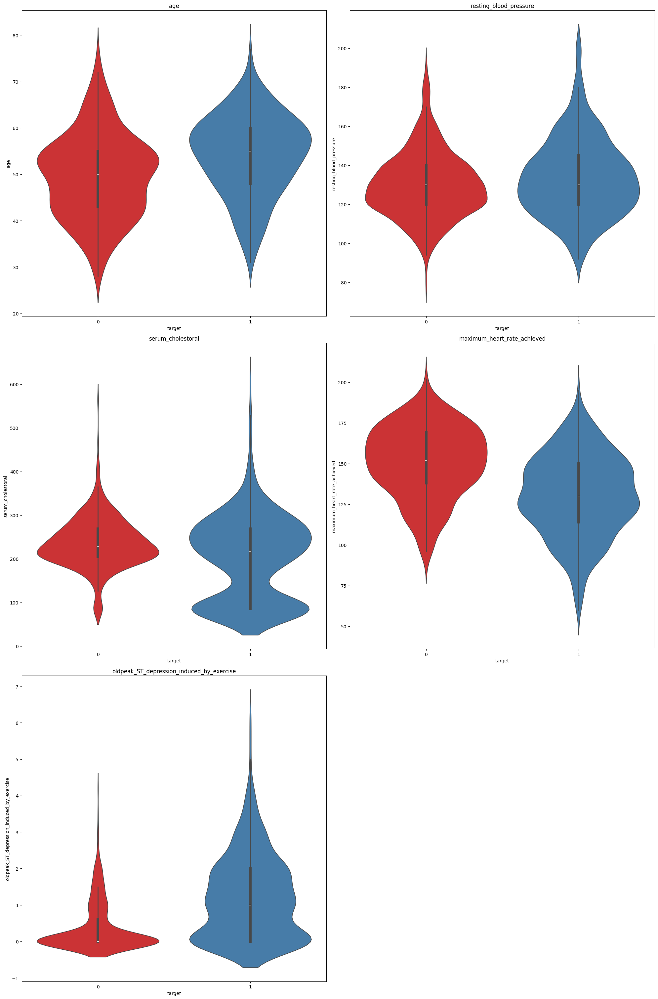

In [53]:
fig = plt.figure(figsize=(20,50))
i=1

for var_num in df_wins.select_dtypes(include=['int64','float64']):
    ax = fig.add_subplot(5, 2, i)
    sns.violinplot(x=df_wins.columns[14], y=var_num, data=df_wins, palette='Set1')
    plt.title(var_num)
    i+=1
fig.tight_layout()

Vamos a ubicar los registros de acuerdo a su categoría, de manera que podamos dibujar nuestro diagrama de densidad.

In [54]:
df_wins.target.describe(include='O')

count     720
unique      2
top         0
freq      360
Name: target, dtype: object

In [55]:
# probar miranddo los valores no como número sino como caracteres es decir entre ''
def categories(df):
    risks = {}
    risks["0"] = df.loc[df.target == "0"] # El cero es num o str... verificar siempre en la var objetivo.
    risks["1"] = df.loc[df.target == "1"]
    return risks 



Con el diagrama de densidad se puede observar aquellas variables independientes que mejor 
discriminan las clases de la variable objetivo.

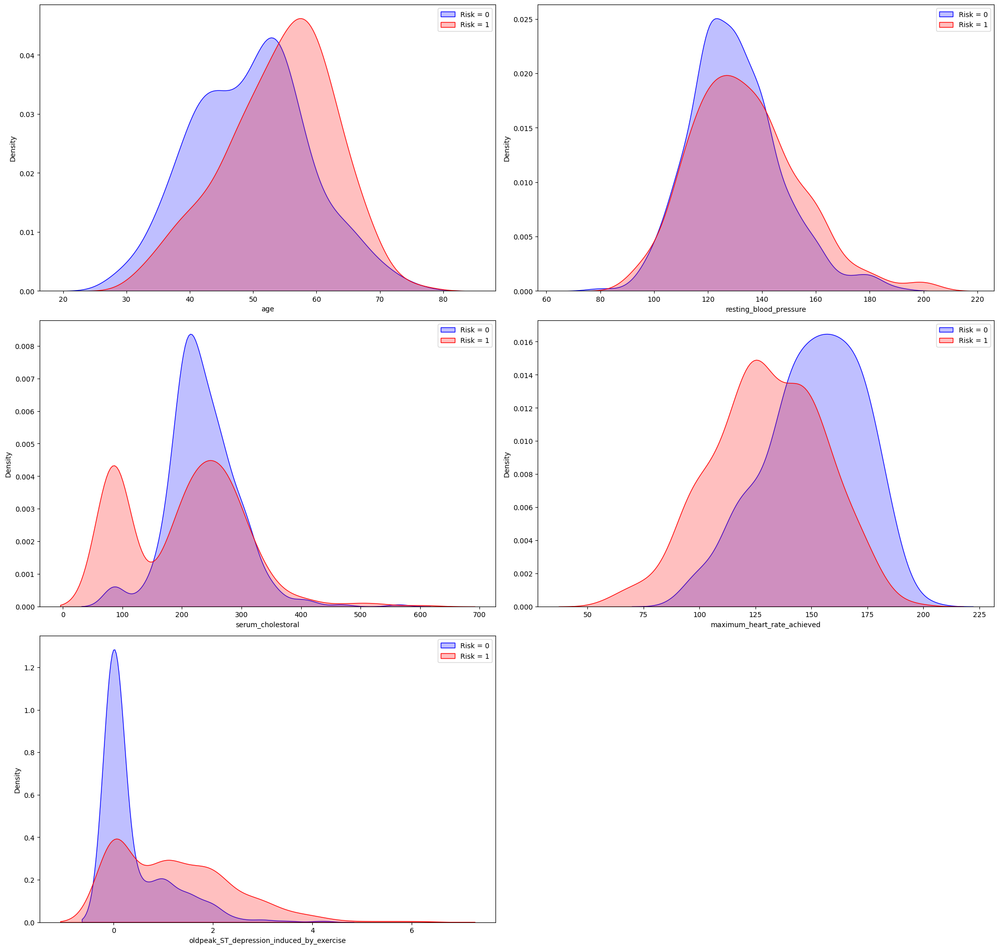

In [56]:
risks = categories(df_wins)

i=1
fig = plt.figure(figsize=[20, 50])
for var_num in df_wins.select_dtypes('number').columns:
    ax = fig.add_subplot(8, 2, i)
    sns.kdeplot(risks['0'][[var_num]].iloc[:,0], shade=True, color="b", label="Risk = 0",palette='Set1')
    sns.kdeplot(risks['1'][[var_num]].iloc[:,0], shade=True, color="r", label="Risk = 1",palette='Set1')
    plt.legend()
    i+=1
fig.tight_layout()

Utilizando los gráficos de densidad logramos percibir que algunas features nos permiten distinguir la variable objetivo, mientras otras no nos brindan mayor información.

Dentro de las candidatas podríamos tener:

- oldpeak_ST_depression_induced_by_exercise

Pero al tratarse de un tema de salud y al ser tan pocas en este casó específico vamos con todas.

In [57]:
df_wins.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720 entries, 0 to 719
Data columns (total 15 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   location                                       720 non-null    object 
 1   age                                            720 non-null    float64
 2   sex                                            720 non-null    object 
 3   chest_pain_type                                720 non-null    object 
 4   resting_blood_pressure                         720 non-null    float64
 5   serum_cholestoral                              720 non-null    float64
 6   fasting_blood_sugar                            720 non-null    object 
 7   resting_electrocardiographic_results           720 non-null    object 
 8   maximum_heart_rate_achieved                    720 non-null    float64
 9   exercise_induced_angina                        720 non

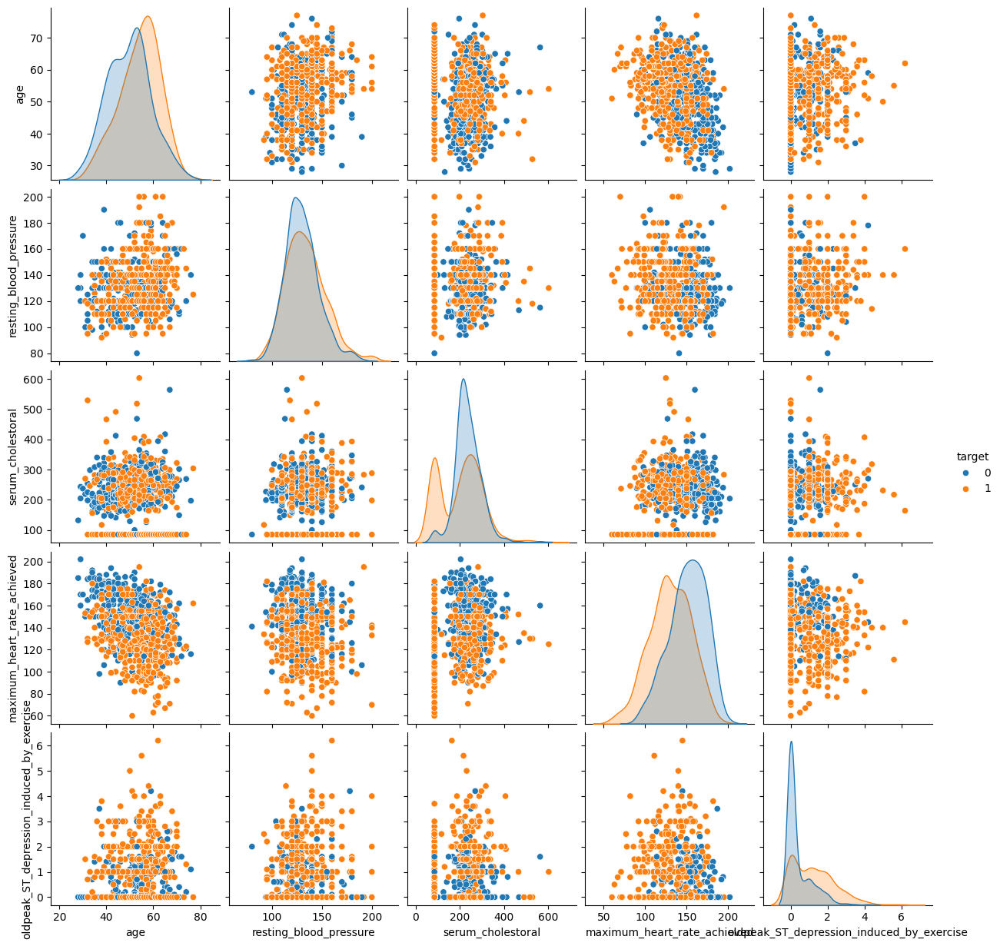

In [58]:

ax = sns.pairplot(df_wins, vars=['age','resting_blood_pressure', 'serum_cholestoral', 
                                 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise'],
                  hue="target")

Haciendo uso de los pairplots de aquellas variables que mejor discriminaban la variable objetivo, intentamos encontrar combinaciones que nos ayuden a distinguir mejor los 5 grupos de riesgo que tenemos en nuestra variable objetivo target.

Definitivamente no resulta claro un par de variables que nos discrimene la variable objetivo

### Matriz de correlación

Vamos a utilizar la matriz de correlación para corroborar los indicios sobre las relaciones presentes entre algunas de las características y la variable objetivo.

El uso de la matriz de correlación es importante para conocer la correlación entre cada par de variables
- Las variables independientes a utilizar deberían estar altamente correlacionadas con la objetivo
- Se deben evitar problemas de multicolinealidad
- Las variables independientes no deben estar correlacionadas entre sí
- Si las variables independientes se encuentran altamente correlacionadas, el modelo puede presentar problemas al momento de entrenarlo e interpretarlo. No se podría aislar la relación entre cada variable independiente y la dependiente. Si no se pueden aislar los efectos, se pueden confundir dichos efectos
- Cuando las variables independientes están muy correlacionadas entre sí los cambios en una variable están asociados con cambios en otra variable y, por tanto, los coeficientes de regresión del modelo ya no van a medir el efecto de una variable independiente sobre la respuesta manteniendo constante, o sin variar, el resto de predictores. 
- Al contar con variables categóricas (la dependiente y varias dependientes) no podemos utilizar la matriz de correlación clásica que utiliza el coeficiente de correlación de Pearson ya que este tan sólo nos sirve para relación entre variables continuas.
- Al haber varias características categóricas utilizamos la función associations de dython que utiliza el coeficiente de Pearson para continuas vs continuas, la razón de correlación para continuas vs categóricas y Cramer's V o Theil's U para categóricas vs categóricas

In [60]:
# Utilizamos la librería dython para identificar las variables categóricas y numéricas

from dython.nominal import identify_nominal_columns, identify_numeric_columns, correlation_ratio
categorical_features=identify_nominal_columns(df_wins)
continuous_features=identify_numeric_columns(df_wins)


In [61]:
categorical_features

['location',
 'sex',
 'chest_pain_type',
 'fasting_blood_sugar',
 'resting_electrocardiographic_results',
 'exercise_induced_angina',
 'the_slope_of_the_peak_exercise_ST_segment',
 'number_of_major_vessels_colored_by_fluorosopy',
 'thal',
 'target']

In [62]:
continuous_features

['age',
 'resting_blood_pressure',
 'serum_cholestoral',
 'maximum_heart_rate_achieved',
 'oldpeak_ST_depression_induced_by_exercise']

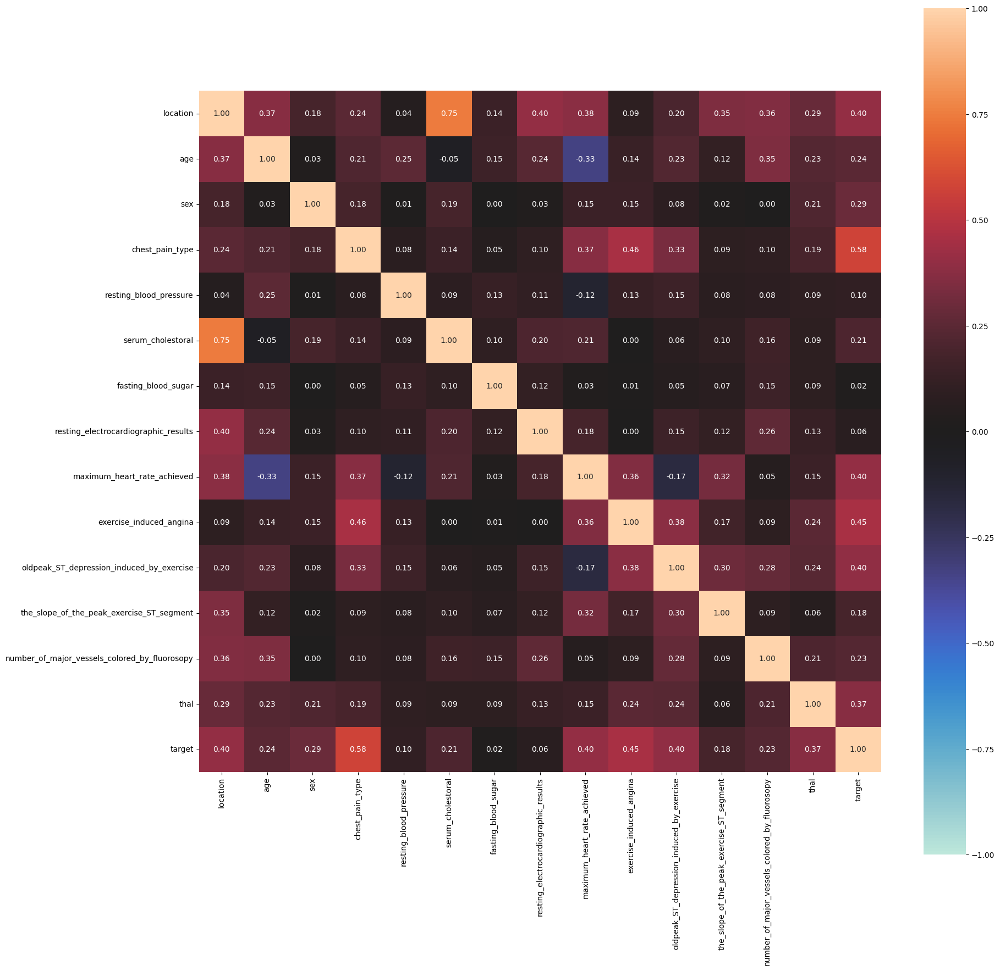

In [63]:

from dython.nominal import associations
complete_correlation= associations(df_wins, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\complete_correlation.png', figsize=(20,20))


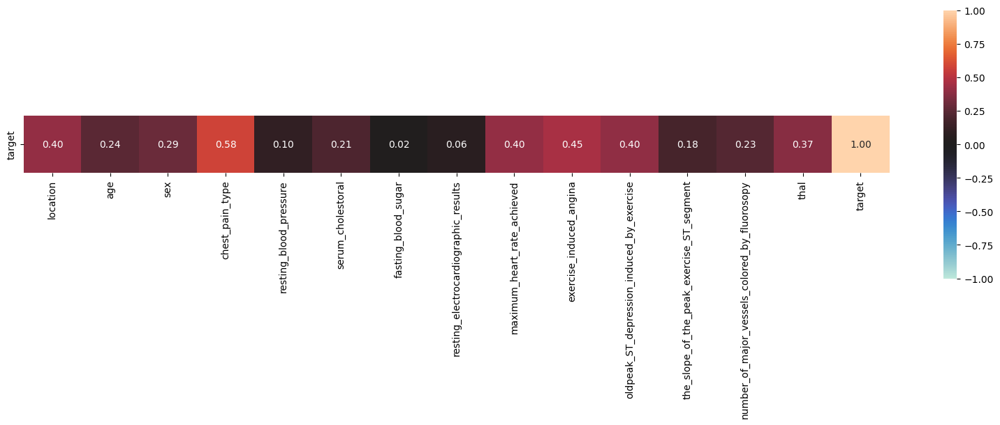

In [64]:
target_correlation= associations(df_wins, display_rows=['target'], filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\target_correlation.png', figsize=(20,5))

Detallamos primero las variables independientes que más influencian a la objetivo (aunque ninguna tiene una alta correlación >= 0.7 o <= -0.7) en orden descendente es decir de mayor a menor importancia:
- chest_pain_type con 0.58
- exercise_induced_angina con 0.45
- oldpeak_ST_depression_induced_by_exercise con 0.40
- maximum_heart_rate_achieved con 0.40 
- location (En realidad sabemos que no pero académicamente es la 4ta. Se intuye que es debido a que la mayoría del conjunto de datos proviene originalmnete de donde se hizo el estudio Cleveland) con 0.40
- thal con 0.37 
- sex (NO olvidemos que la poblacion predominante es masculina) con 0.29
- age con 0.24
- number_of_major_vessels_colored_by_fluorosopy con 0.23
- serum_cholestoral 0.21
- the_slope_of_the_peak_exercise_ST_segment con 0.18

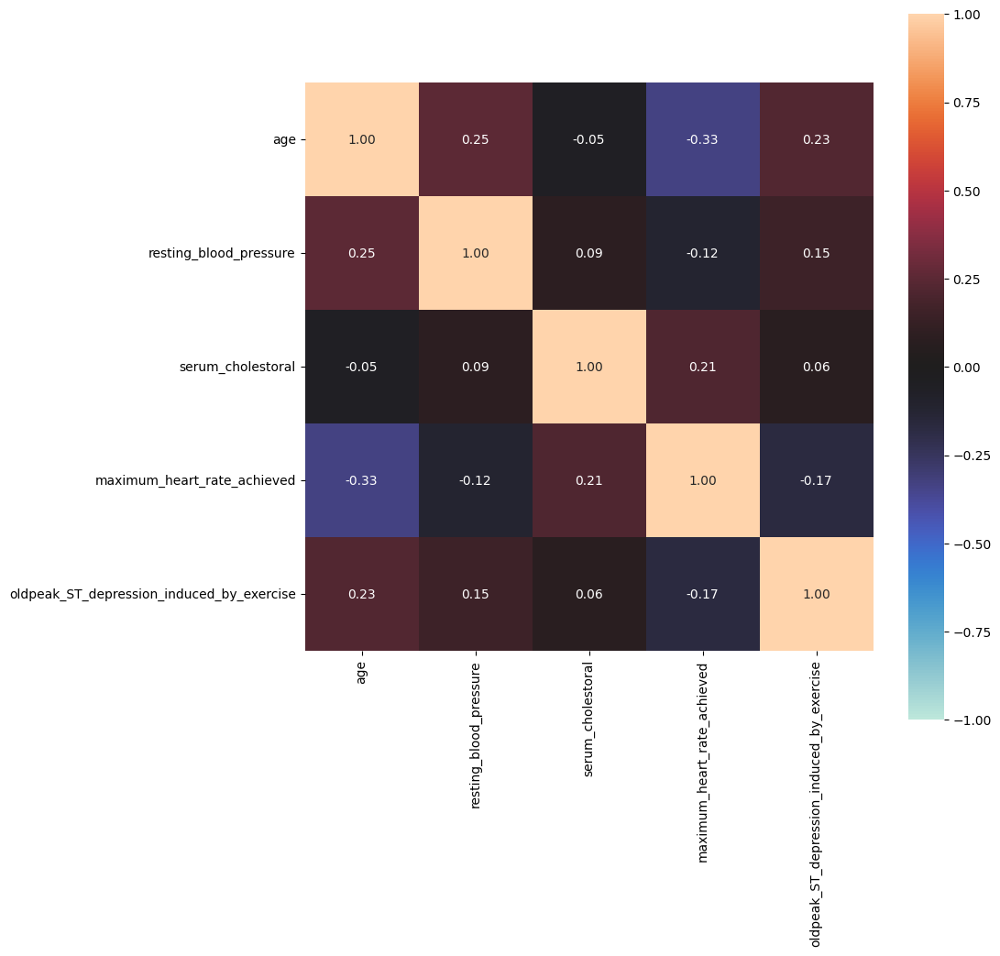

In [65]:
# Obtenemos la matriz de correlación entre las variables continuas

selected_column= df_wins[continuous_features]
continuous_df = selected_column.copy()

continuous_correlation= associations(continuous_df, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\continuous_correlation.png', figsize=(10,10))

Revisamos aquellas variables independientes continuas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (problemas de multicolinealidad, redundancia, complejitud innecesaria del modelo):
- age y resting_blood_pressure 0.25
- age y oldpeak_ST_depression_induced_by_exercise 0.23
- serum_cholestoral y maximum_heart_rate_achieved 0.21
- age y maximum_heart_rate_achieved -0.33

En realidad son valores bajos pero para el ejercicio académico se dejan anotados. Además en el campo de la salud según los expertos no debemos desechar ninguna de estas.

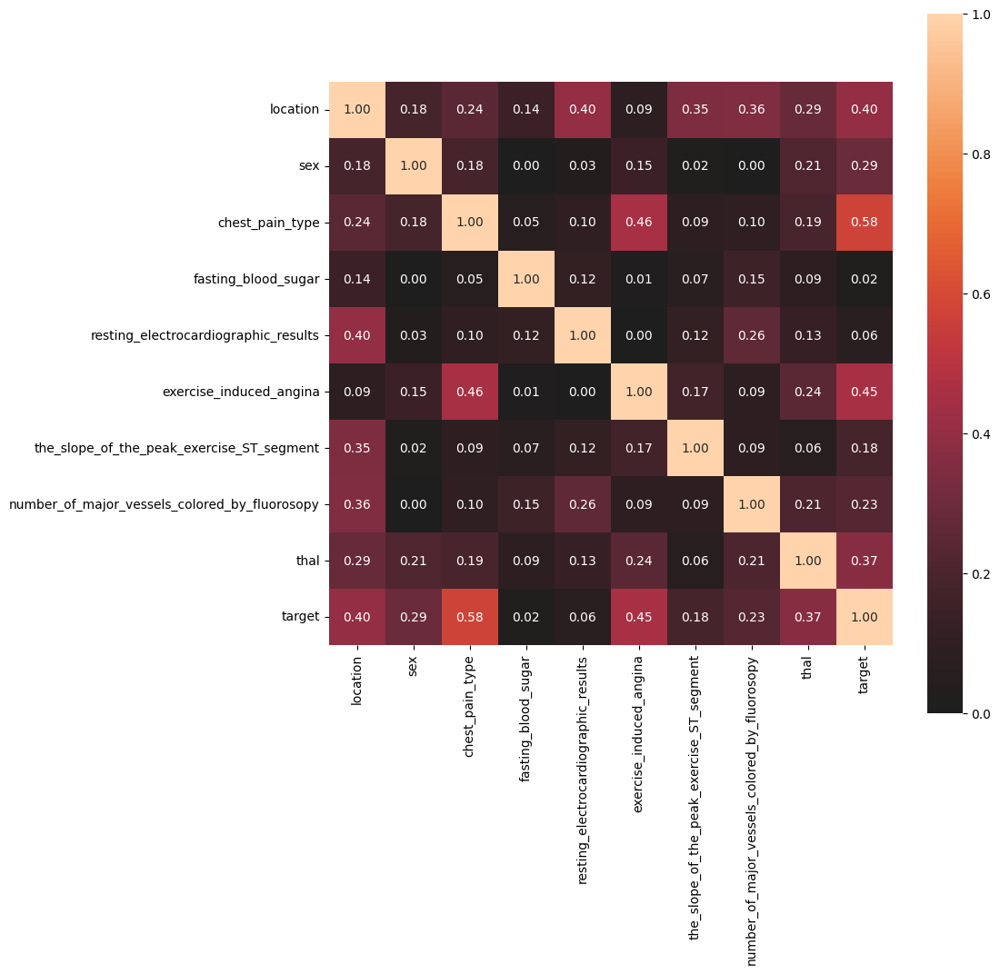

In [66]:
# Obtenemos la matriz de correlación entre las variables categoricas

selected_column= df_wins[categorical_features]
categorical_df = selected_column.copy()

categorical_correlation= associations(categorical_df, filename= r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\correlations_img_corazon_V2\categorical_correlation.png', figsize=(10,10))

Revisamos aquellas variables independientes categóricas que pueden llegar a generar problemas al encontrarse altamente correlacionadas entre sí (redundacia y complejidad innecesaria del modelo) pero no hay ninguna que esté por encima de 0.7 las más altas son las siguientes:
- chest_pain_type y target 0.58
- exercise_induce_angina y chest_pain_type 0.46
- target y exercise_induced_angina 0.45
- target y location 0.40
- resting_electrocardiographic_results y location 0.40

### 4.3. Ingeniería de características

Vamos a eliminar y/o crear nuevas características que nos resulten útiles para la futura implementación de nuestros modelos

Las siguientes variables podemos considerarlas como altamente correlacionadas entre sí (correlación >= .7 o correlación <= -.7):

En este apartado no se encuentra ninguna variable significante. Por este motivo y por concepto de experto se procede a usar todas.

Puede resultar útil eliminar las variables que no se encuentren muy correlacionadas con target.
Por concepto de los expertos no eliminamos ninguna.

In [68]:
print(correlation_ratio(categories=df_wins['target'],measurements=df_wins['age']))
print(correlation_ratio(categories=df_wins['target'],measurements=df_wins['resting_blood_pressure']))

0.24278595417458237
0.1020598233983358


In [69]:
# Creamos un Transformer personalizado para realizar la eliminación de variables
# a partir de sus correlaciones
class Remove_highly_correlated_features(BaseEstimator, TransformerMixin):
    def __init__(self,elims):
        self.elims = elims
        
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = result.drop(columns=self.elims)
        return result

In [70]:
cols = ['resting_blood_pressure','resting_electrocardiographic_results'] # Columna a eliminar en este caso solo 2

df_elims = Remove_highly_correlated_features(cols).fit_transform(df_wins)
df_elims

,location,age,sex,chest_pain_type,serum_cholestoral,fasting_blood_sugar,maximum_heart_rate_achieved,exercise_induced_angina,oldpeak_ST_depression_induced_by_exercise,the_slope_of_the_peak_exercise_ST_segment,number_of_major_vessels_colored_by_fluorosopy,thal,target
0,Cleveland,63.0,1,1,233.0,1,150.0,0,2.3,3,0,6,0
1,Cleveland,67.0,1,4,286.0,0,108.0,1,1.5,2,3,3,1
2,Cleveland,67.0,1,4,229.0,0,129.0,1,2.6,2,2,7,1
3,Cleveland,37.0,1,3,250.0,0,187.0,0,3.5,3,0,3,0
4,Cleveland,41.0,0,2,204.0,0,172.0,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,Suiza,70.0,1,4,85.0,0,92.0,1,0.0,2,0,7,1
716,Suiza,70.0,1,4,85.0,1,157.0,1,2.0,2,0,7,1
717,Suiza,72.0,1,3,85.0,0,114.0,0,1.6,2,2,3,0
718,Suiza,73.0,0,3,85.0,0,121.0,0,0.0,1,0,3,1


In [71]:
# Creamos un Transformer personalizado para dummificar las variables categóricas
class Dummify(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        result = pd.get_dummies(result,columns=result.select_dtypes('object').drop(columns=['target']).columns,dtype=float)
        return result

In [72]:
df_elims_dummified = Dummify().fit_transform(df_elims)
df_elims_dummified

,age,serum_cholestoral,maximum_heart_rate_achieved,oldpeak_ST_depression_induced_by_exercise,target,location_Cleveland,location_Hungria,location_Suiza,sex_0,sex_1,...,the_slope_of_the_peak_exercise_ST_segment_1,the_slope_of_the_peak_exercise_ST_segment_2,the_slope_of_the_peak_exercise_ST_segment_3,number_of_major_vessels_colored_by_fluorosopy_0,number_of_major_vessels_colored_by_fluorosopy_1,number_of_major_vessels_colored_by_fluorosopy_2,number_of_major_vessels_colored_by_fluorosopy_3,thal_3,thal_6,thal_7
0,63.0,233.0,150.0,2.3,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,67.0,286.0,108.0,1.5,1,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,67.0,229.0,129.0,2.6,1,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,37.0,250.0,187.0,3.5,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,41.0,204.0,172.0,1.4,0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,70.0,85.0,92.0,0.0,1,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
716,70.0,85.0,157.0,2.0,1,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
717,72.0,85.0,114.0,1.6,0,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
718,73.0,85.0,121.0,0.0,1,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


Teniendo en cuenta que uno de los hallazgos importantes fue la alta correlación existente entre las variables independientes podemos aplicar PCA para reducir dimensiones y utilizar variables nuevas con mucha mayor información. 

Estandarizamos primero, pues de no hacerlo, al PCA basarse en distancias, se tendrán las variables nuevas fuertemente influenciadas por las variables originales de mayor escala.

In [73]:
# Usamos el estarizador
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_wins.select_dtypes('number'))
df_scaled = pd.DataFrame(df_scaled, columns=df_wins.select_dtypes('number').columns)
df_scaled.head()

,age,resting_blood_pressure,serum_cholestoral,maximum_heart_rate_achieved,oldpeak_ST_depression_induced_by_exercise
0,1.209395,0.714115,0.168442,0.368628,1.440578
1,1.644777,1.525900,0.819868,-1.272402,0.668884
2,1.644777,-0.638861,0.119278,-0.451887,1.729963
3,-1.620589,-0.097671,0.377390,1.814297,2.598118
4,-1.185207,-0.097671,-0.187999,1.228215,0.572423


- Creamos el objeto PCA
- Entrenamos y transformamos los datos originales
- Los guardamos en un nuevo dataframe proyectado

In [74]:
from sklearn.decomposition import PCA

pca = PCA()
df_projected = pca.fit_transform(df_scaled)

Vemos el dataset proyectado en las nuevas dimensiones

In [75]:
df_projected

array([[ 1.40969217,  0.99306506,  0.45801741, -0.43530177, -0.91620977],
       [ 2.45882099,  0.99299041, -0.54781262,  0.61828689,  0.2409352 ],
       [ 1.68149066,  0.18146587,  1.53923651,  0.50166103, -0.91835763],
       ...,
       [ 3.00423532, -0.80807196, -0.78280082, -0.62446677, -0.90922757],
       [ 2.25931063, -1.14795599, -1.95675202, -0.01420711, -1.1275928 ],
       [ 2.48988455, -1.08634335, -0.51460696, -0.15093838, -1.43423908]])

Observamos cada uno de los componentes principales resultantes del proceso

In [76]:
pca.components_

array([[ 0.59147561,  0.40849854, -0.12414944, -0.53185594,  0.43011826],
       [ 0.01304482,  0.40764116,  0.77910833,  0.37887142,  0.2882797 ],
       [-0.11921932, -0.65000895,  0.09285712, -0.05272946,  0.74288106],
       [ 0.44044611, -0.45889379,  0.55183555, -0.333961  , -0.42352248],
       [-0.66466564,  0.18401759,  0.25383502, -0.67769858, -0.02548588]])

Obtenemos la varianza explicada de cada uno de los componentes principales (nos damos cuenta que los primeros componentes tienen mayor varianza explicada)

In [77]:
pca.explained_variance_

array([1.6504293 , 1.17282065, 0.85254471, 0.71189244, 0.61926701])

Miramos ahora el ratio de la varianza explicada

In [78]:
var_exp=pca.explained_variance_ratio_
cum_var_exp = np.cumsum(var_exp) 
var_exp

array([0.32962741, 0.23423835, 0.17027212, 0.14218074, 0.12368138])

Diagramamos con el objetivo de identificar los componentes principales necesarios, aquellos que en conjunto nos expliquen un porcentaje considerable de la varianza (80%-95%)

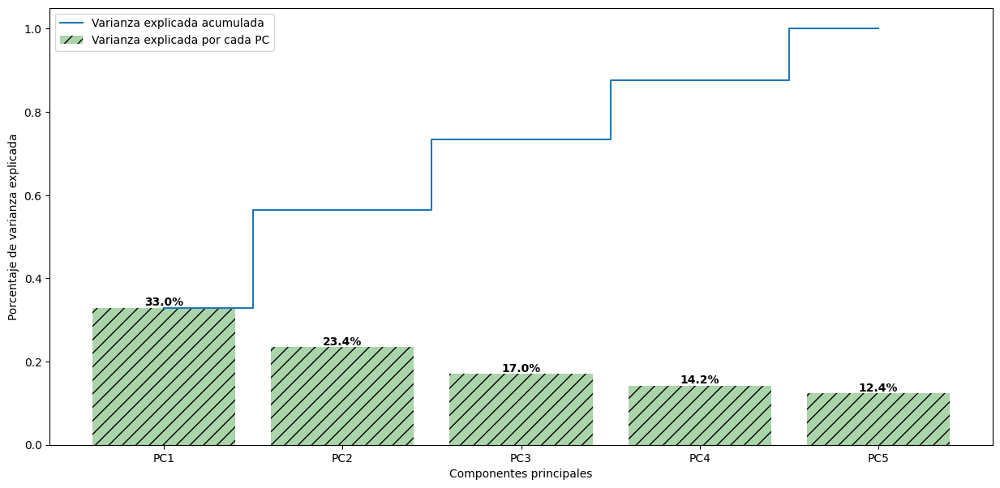

In [79]:
labels = ['PC' + str(x) for x in range(1, len(var_exp)+1)]
plt.figure(figsize=(15, 7))
bars = plt.bar(range(len(var_exp)), var_exp, alpha=0.3333, align='center', label='Varianza explicada por cada PC', 
         tick_label=labels, color = 'g',hatch='//')
plt.step(range(len(cum_var_exp)), cum_var_exp, where='mid',label='Varianza explicada acumulada')
plt.ylabel('Porcentaje de varianza explicada')
plt.xlabel('Componentes principales')
plt.legend(loc='best')
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
            f'{round(var_exp[i]*100,1)}%', ha='center', va='bottom', color='black', fontweight='bold')
plt.show()

Encontramos que entre los primeros 4 componentes principales tenemos el 87.6% de la información


In [82]:
np.sum(pca.explained_variance_ratio_[0:4])

0.8763186159552683

Ahora utilizamos los 4 primeros componentes, obteniendo un dataframe con las nuevas variables. En este caso particular, como nuestro objetivo es la predicción, no vamos a caracterizar las nuevas variables (esto sería útil si quisiésemos interpretar los resultados utilizando las variables generadas por el PCA)



In [83]:
pca = PCA(n_components=4)
pca_ = pca.fit_transform(df_scaled)
pca_df = pd.DataFrame(pca_, columns=['pc1','pc2','pc3','pc4'],index=df.index)
print('\nFinal PCA:')
pca_df


Final PCA:


,pc1,pc2,pc3,pc4
0,1.409692,0.993065,0.458017,-0.435302
1,2.458821,0.992990,-0.547813,0.618287
2,1.681491,0.181466,1.539237,0.501661
3,-0.892736,1.669442,2.126162,-2.166970
4,-1.124603,0.428606,0.547808,-1.233553
...,...,...,...,...
715,1.673974,-2.574263,-0.275072,1.337950
716,1.705713,-0.504360,0.144757,-0.948154
717,3.004235,-0.808072,-0.782801,-0.624467
718,2.259311,-1.147956,-1.956752,-0.014207


In [84]:
# Creamos un Transformer personalizado para realizar PCA sobre las variables numéricas
# Para dummificar las variables categóricas
class PCA_transformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        result = X.copy()
        cols = ['resting_blood_pressure','resting_electrocardiographic_results']
        result = Remove_highly_correlated_features(cols).fit_transform(result)
        df_scaled = scaler.fit_transform(result.select_dtypes('number'))
        df_scaled = pd.DataFrame(df_scaled, columns=result.select_dtypes('number').columns)
        pca = PCA(n_components=4)
        pca_ = pca.fit_transform(df_scaled)
        pca_df = pd.DataFrame(pca_, columns=['pc1','pc2','pc3','pc4'],index=df.index)
        for col in result.select_dtypes('object'):
            pca_df[col] = result[col] 
        pca_df = pd.get_dummies(pca_df,columns=pca_df.select_dtypes('object').drop(columns=['target']).columns,dtype=float)
        return pca_df

In [85]:
df_pca = PCA_transformer().fit_transform(df_wins)
df_pca

,pc1,pc2,pc3,pc4,target,location_Cleveland,location_Hungria,location_Suiza,sex_0,sex_1,...,the_slope_of_the_peak_exercise_ST_segment_1,the_slope_of_the_peak_exercise_ST_segment_2,the_slope_of_the_peak_exercise_ST_segment_3,number_of_major_vessels_colored_by_fluorosopy_0,number_of_major_vessels_colored_by_fluorosopy_1,number_of_major_vessels_colored_by_fluorosopy_2,number_of_major_vessels_colored_by_fluorosopy_3,thal_3,thal_6,thal_7
0,-1.072828,1.203691,0.380673,-0.978476,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,-1.858636,1.013871,-0.951880,0.235271,1,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,-1.982654,1.221509,0.245192,-0.658309,1,1.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,1.087482,1.856338,2.835586,-0.376115,0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.184315,0.236356,1.313291,-0.305021,0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
715,-2.458140,-1.815817,-1.180300,-0.289808,1,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
716,-1.703851,-0.210670,0.613359,-2.241551,1,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
717,-2.715819,-0.744926,-0.052460,-1.116302,0,0.0,0.0,1.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
718,-1.948820,-1.522643,-1.164780,-1.312024,1,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0


Hacemos uso de un pipeline para dejar listos nuestros dataframes que posteriormente utilizaremos para entrenar nuestros modelos

In [86]:
from sklearn.pipeline import Pipeline

elims = ['resting_blood_pressure','resting_electrocardiographic_results']

pipe_rem = Pipeline(steps = [('format target variable',Format_target()),
                   ('format features',Format_variables()),
                   ('impute null values',Imputer(cont,cat)),
                   ('winsorize values',Winsorizer(wins_dict,cont_vars)),
                   ('Remove highly correlated features',Remove_highly_correlated_features(elims)),
                   ('Dummify categorical variables',Dummify())])

pipe_pca_rem = Pipeline(steps = [('format target variable',Format_target()),
                   ('format features',Format_variables()),
                   ('impute null values',Imputer(cont,cat)),
                   ('winsorize values',Winsorizer(wins_dict,cont_vars)),
                   ('PCA',PCA_transformer())])


df_pipeline_rem = pipe_rem.fit_transform(df)
df_pipeline_pca_rem = pipe_pca_rem.fit_transform(df)

In [87]:
# Construimos una función que nos permite obetener el X y el y para el dataframe de corazon

def obtain_X_y(df):
    return df.drop(columns=['target']),df[['target']]

### 5. Protocolos de evaluación

In [88]:
# Utilizamos el holdout con un 30% para la prueba y 70% para el entrenamiento
from sklearn.model_selection import train_test_split

X = dict()
y = dict()
X_train = dict()
y_train = dict()
X_test = dict()
y_test = dict()

# Particionamos los datos para nuestra primer versión
X['rem'], y['rem'] = obtain_X_y(df_pipeline_rem)

X_train['rem'], X_test['rem'], y_train['rem'], y_test['rem'] = train_test_split(X['rem'],y['rem'],random_state=1234,test_size=0.3)
print(X_train['rem'].shape)
print(X_test['rem'].shape)
print(y_train['rem'].shape)
print(y_test['rem'].shape)

(504, 32)
(216, 32)
(504, 1)
(216, 1)


In [89]:
# Particionamos los datos para nuestra segunda versión
X['pca_rem'], y['pca_rem'] = obtain_X_y(df_pipeline_pca_rem)

X_train['pca_rem'], X_test['pca_rem'], y_train['pca_rem'], y_test['pca_rem'] = train_test_split(X['pca_rem'],y['pca_rem'],random_state=1234,test_size=0.3)
print(X_train['pca_rem'].shape)
print(X_test['pca_rem'].shape)
print(y_train['pca_rem'].shape)
print(y_test['pca_rem'].shape)

(504, 32)
(216, 32)
(504, 1)
(216, 1)


### 6. Métricas de evaluación

Implementamos una función que nos permita calcular las métricas de regresión para el conjunto de entrenamiento y de prueba (Accuracy, Kappa, Precision, Recall)

Nos retornará el modelo entrenado y un diccionario con las principales métricas sobre el conjunto de entrenamiento y el de prueba
- Accuracy = (TP + TN) / (TP + FP + FN + TN)
- Kappa = (OA - AC) / (1 - AC)
- Precision = TP / (TP + FP) (valor positivo predicho, la proporción correcta de identificaciones positivas)
- Recall = TP / (TP + FN) (la proporción de positivos que fueron identificados correctamente)

In [110]:
from sklearn.metrics import accuracy_score, cohen_kappa_score, precision_score, recall_score

def classification_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    acc_train = accuracy_score(y_train, y_pred_train)
    acc_test = accuracy_score(y_test, y_pred_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    prec_train = precision_score(y_train, y_pred_train,average=None,labels=['0','1'])
    prec_test = precision_score(y_test, y_pred_test,average=None,labels=['0','1'])
    recall_train = recall_score(y_train, y_pred_train,average=None,labels=['0','1'])
    recall_test = recall_score(y_test, y_pred_test,average=None,labels=['0','1'])   
    metrics = {"Training Accuracy": acc_train,
               "Test Accuracy": acc_test,
               "Training Kappa": kappa_train,
               "Test Kappa": kappa_test,
               "Training Precision": prec_train,
               "Test Precision": prec_test,
               "Training recall": recall_train,
               "Test recall": recall_test    
               }
    for item in metrics.items():
        print(item[0],"=",item[1])
    return model,metrics
    
def kappa_metrics(model,X_train,X_test,y_train,y_test):
    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    kappa_train = cohen_kappa_score(y_train, y_pred_train)
    kappa_test = cohen_kappa_score(y_test, y_pred_test)
    return kappa_train, kappa_test

### Baseline a partir del dummy classifier

Establecemos la línea base a partir de un dummy classifier que utiliza como estrategia la moda (ya que estamos trabajando con una tarea de clasificación)

In [111]:
from sklearn.dummy import DummyClassifier

classification_metrics(DummyClassifier(strategy='most_frequent'),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.5
Test Accuracy = 0.5
Training Kappa = 0.0
Test Kappa = 0.0
Training Precision = [0.5 0. ]
Test Precision = [0.5 0. ]
Training recall = [1. 0.]
Test recall = [1. 0.]


(DummyClassifier(strategy='most_frequent'),
 {'Training Accuracy': 0.5,
  'Test Accuracy': 0.5,
  'Training Kappa': 0.0,
  'Test Kappa': 0.0,
  'Training Precision': array([0.5, 0. ]),
  'Test Precision': array([0.5, 0. ]),
  'Training recall': array([1., 0.]),
  'Test recall': array([1., 0.])})

Training Accuracy = 50%, Test Accuracy = 50%

### Reporte de métricas y matriz de confusión

Vamos a definir una función para dibujar la matriz de confusión y el reporte de clasificación en donde podemos obtener las métricas de entrenamiento y prueba

In [112]:
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.linear_model import LogisticRegression

import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Matriz de confusión',
                          cmap=plt.cm.Blues):

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Real')
    plt.xlabel('Predicción')

def report_and_conf_matrix(model,X_train,X_test,y_train,y_test):
    md = model.fit(X_train,y_train)
    y_pred_train = md.predict(X_train)
    y_pred_test = md.predict(X_test)
    cnf_matrix1 = confusion_matrix(y_train, y_pred_train)
    cnf_matrix2 = confusion_matrix(y_test, y_pred_test)
    np.set_printoptions(precision=2)
    plt.figure()
    plot_confusion_matrix(cnf_matrix1, classes=['0','1'],
                      title='Matriz de confusión Entrenamiento')
    print("Reporte Entrenamiento")  
    print(classification_report(y_train, y_pred_train, target_names=['0','1']))
    plt.show()
    plt.figure()
    plot_confusion_matrix(cnf_matrix2, classes=['0','1'],
                      title='Matriz de confusión Prueba')
    print("Reporte Prueba")  
    print(classification_report(y_test, y_pred_test, target_names=['0','1']))
    plt.show()


### Área bajo la curva ROC

Vamos a utilizar el área bajo la curva ROC para evaluar nuestro modelo también. Con esta gráfica vamos a poder visualizar el desempeño del modelo entre la sensibilidad (recall - true positive rate) y la especificidad (true negative rate 1 - FPR), de manera que podamos establecer un balance entre ambos.
- La curva ROC hace un plot entre el TPR y el FPR
- Recall es la habilidad para identificar correctamente las observaciones que son positivas
- Especificidad es la habilidad para indentificar correctamente las observaciones que son negativas
- AUC ROC nos permite identificar que tan bien nuestro modelo puede distinguir entre las clases. 

Al tener nosotros un problema multi - clase utilizaremos una metodología uno vs el resto. Se tendrán tantas curvas como clases. Yellowbrick es muy útil y simple para esto

- Utilizando las curvas individuales podemos ver que tan bien nuestro modelo trabaja para cada una de las categorías 

- La curva micro-average ROC agrega todas las instancias sobre todas las clases y nos brinda una sola curva para todas las predicciones (afectada por la moda).

- La curva macro-average ROC trata clase de manera independiente y nos presenta una curva ROC que es el promedio de los valores para cada clase (cada clase tiene la misma importancia).

In [158]:
#Profe cuando revise si es posible nos podría decir porque no funcionó esta función 

#from yellowbrick.classifier import ROCAUC

#def plot_ROC_curve(model, X_train, y_train, X_test, y_test):
    #visualizer = ROCAUC(model, encoder={'0': 'neutral riesgo 0', '1': 'riesgo 1'})                                    
    #visualizer.fit(X_train, y_train)
    #visualizer.score(X_test, y_test)
    #visualizer.show()
    
    #return visualizer

In [160]:
from sklearn.metrics import roc_curve
from yellowbrick.classifier import ROCAUC


def plot_ROC_curve(model, X_train, y_train, X_test, y_test):
    # Convertir las etiquetas de cadena '0' y '1' a enteros 0 y 1
    y_train_int = y_train.astype(int)
    y_test_int = y_test.astype(int)
    
    # Asegúrate de inicializar el modelo con la capacidad de devolver probabilidades
    visualizer = ROCAUC(model, classes=[0, 1], pos_label=1)
    visualizer.fit(X_train, y_train_int)  # Entrena el modelo con etiquetas enteras
    visualizer.score(X_test, y_test_int)  # Pasa las etiquetas verdaderas enteras al visualizador
    visualizer.show()
    
    return visualizer

Podemos observar el funcionamiento de la curva ROC y el área bajo ella utilizando uno de los modelos más sencillos para abordar tareas de clasificación, la regresión logística.

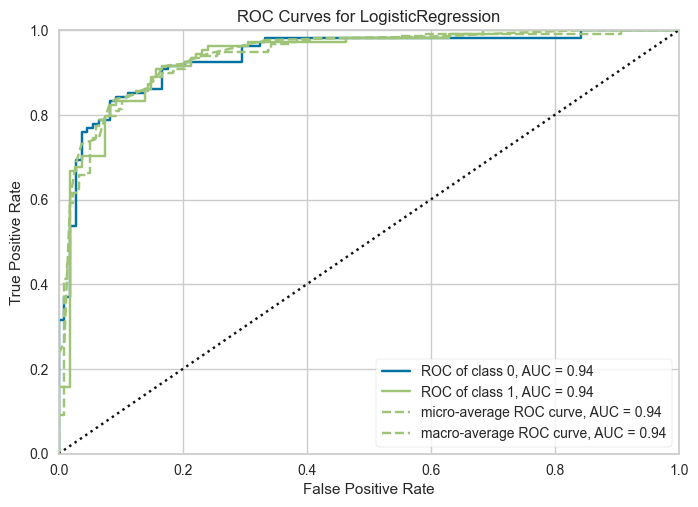

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1], estimator=LogisticRegression(random_state=1234))

In [161]:
plot_ROC_curve(LogisticRegression(random_state=1234), X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

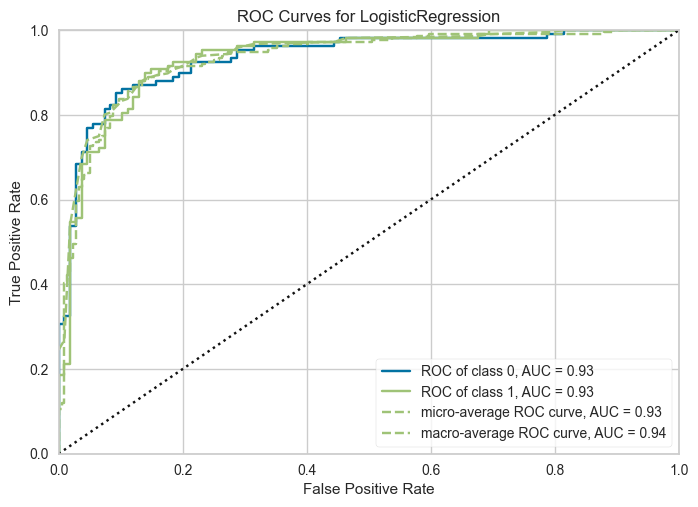

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegression'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1], estimator=LogisticRegression(random_state=1234))

In [162]:
plot_ROC_curve(LogisticRegression(random_state=1234), X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Se puede observar que el conjunto de datos al que se le ha realizado el PCA presenta un poco peor desempeño. Más adelante ahondaremos más en esto.

### 7. Implementación de modelos

#### 7.1. Modelo de Regresión Logística

Trabajamos sobre el conjunto de datos con eliminación de variables altamente correlacionadas entre sí.

In [163]:
from sklearn.linear_model import LogisticRegression

classification_metrics(LogisticRegression(random_state=1234),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.871031746031746
Test Accuracy = 0.8564814814814815
Training Kappa = 0.7420634920634921
Test Kappa = 0.712962962962963
Training Precision = [0.85551331 0.8879668 ]
Test Precision = [0.90526316 0.81818182]
Training recall = [0.89285714 0.84920635]
Test recall = [0.7962963  0.91666667]


(LogisticRegression(random_state=1234),
 {'Training Accuracy': 0.871031746031746,
  'Test Accuracy': 0.8564814814814815,
  'Training Kappa': 0.7420634920634921,
  'Test Kappa': 0.712962962962963,
  'Training Precision': array([0.85551331, 0.8879668 ]),
  'Test Precision': array([0.90526316, 0.81818182]),
  'Training recall': array([0.89285714, 0.84920635]),
  'Test recall': array([0.7962963 , 0.91666667])})

In [164]:
# Guardamos el mejor modelo con regresión logística

import pickle
from sklearn.linear_model import LogisticRegressionCV

model,metrics = classification_metrics(LogisticRegressionCV(cv=5,random_state=1234),
                                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionRem.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemMetrics.pkl', 'wb'))

Training Accuracy = 0.871031746031746
Test Accuracy = 0.8657407407407407
Training Kappa = 0.7420634920634921
Test Kappa = 0.7314814814814814
Training Precision = [0.84758364 0.89787234]
Test Precision = [0.8989899  0.83760684]
Training recall = [0.9047619  0.83730159]
Test recall = [0.82407407 0.90740741]


Dentro del contexto en el que nos encontramos trabajando, sería bueno entender que tipo de errores desearíamos que nuestro modelo evitara.

Teniendo en cuenta que actuamos como una compañía aseguradora y queremos predecir el riesgo, quizás sería más importante al tomar como positiva la categoría más riesgosa, predecir que no es riesgosa y que sí lo sea (FN), es decir un recall más alto. Por otro lado al tomar como positiva la categoría menos riesgosa y predecir que no es riesgosa y que sí lo sea es un problema (FP), es decir una precision más alta.

In [165]:
# Los hiperparámetros del mejor modelo de regresión logística

model.get_params()

{'Cs': 10,
 'class_weight': None,
 'cv': 5,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1.0,
 'l1_ratios': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 1234,
 'refit': True,
 'scoring': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0}

Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.85      0.90      0.88       252
           1       0.90      0.84      0.87       252

    accuracy                           0.87       504
   macro avg       0.87      0.87      0.87       504
weighted avg       0.87      0.87      0.87       504



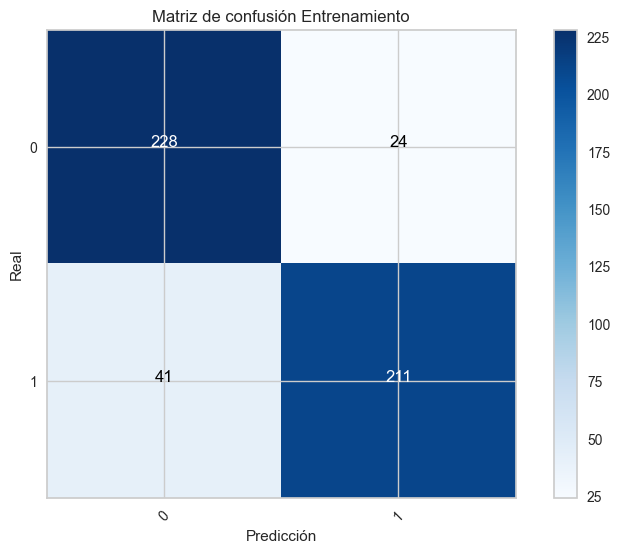

Reporte Prueba
              precision    recall  f1-score   support

           0       0.90      0.82      0.86       108
           1       0.84      0.91      0.87       108

    accuracy                           0.87       216
   macro avg       0.87      0.87      0.87       216
weighted avg       0.87      0.87      0.87       216



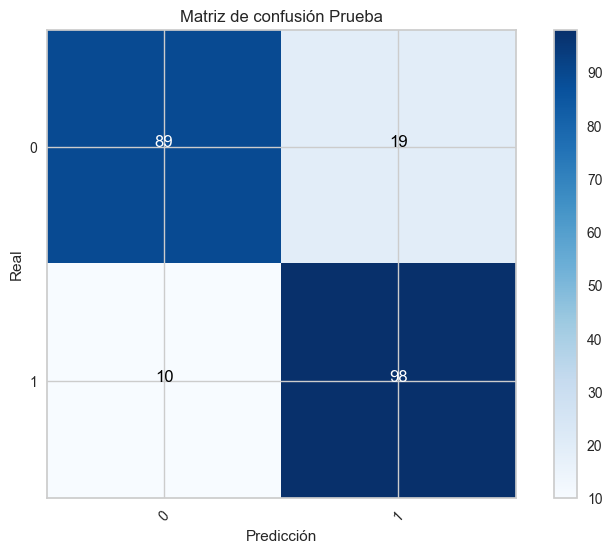

In [166]:
report_and_conf_matrix(LogisticRegressionCV(cv=5,random_state=1234),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Obtenemos el reporte y la matriz de confusión para nuestro mejor modelo de regresión logística con todas las variables.

Con base en el reporte de entrenamiento podemos observar dos métricas importantes
- Precision (para ver si tenemos un nivel alto de correctitud para la clase positiva). Una mayor precision disminuye los falsos positivos (en este caso desearíamos mayor precisión sobre las categorías de menos riesgo)
- Recall (para ver qué porcentaje de las muestras puede el modelo identificar que pertenecen a la clase positiva). Un mayor recall indica que los falsos negativos disminuyen (en este caso desearíamos mayor sensibilidad sobre las categorías de mayor riesgo)

La exactitud para la prueba de nuestro modelo es del 87%, mucho mejor que el presentado en el baseline que era del 50%

La precisión para la clase menos riesgosa es de 90% 

La sensibilidad para la clase más riesgosa de 91% 

Ambas parecen adecuadas teniendo en cuenta el contexto del problema.

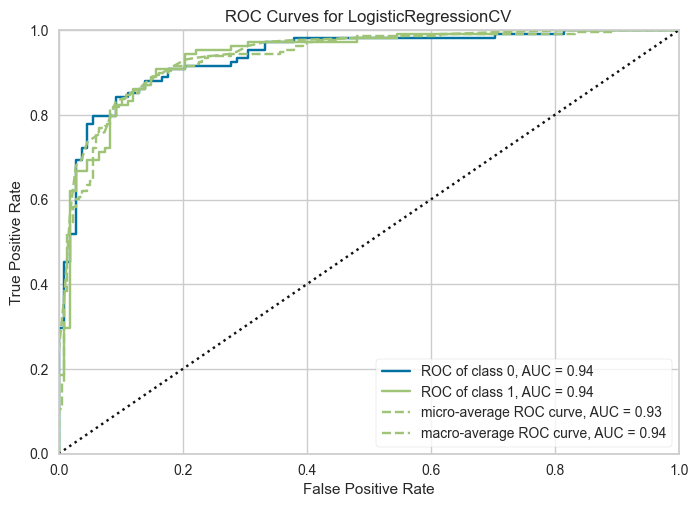

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1], estimator=LogisticRegressionCV(cv=5, random_state=1234))

In [167]:
plot_ROC_curve(LogisticRegressionCV(cv=5,random_state=1234), 
               X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

- La curva micro-average arroja un valor adecuado de 0.93
- La curva macro-average arroja un valor adecuado de 0.94
- Aunque el modelo parece funcionar bien para las clases riesgo 0 y 1, nuestro objetivo es que describa perfectamente la clase 1

Aunque previamente, en la etapa de ingeniería de características habíamos creado nuevas variables y eliminado otras, en esta etapa verificaremos la importancia de las variables independientes con respecto a la objetivo utilizando distintos métodos. 

Esto con el fin de hallar el mejor grupo de variables que sirvan como insumo para nuestros modelos.

### Selección de características

En este caso hacemos uso de SelectKBest que nos permite seleccionar las k mejores variables independientes teniendo en cuenta el f_classif. Construimos una función que a partir del conjunto de entrenamiento y el de prueba nos retorna los conjuntos ya transformados

In [176]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
 
def select_features(X_train, y_train, X_test,n):
  fs = SelectKBest(score_func=f_classif, k=n)
  fs.fit(X_train, y_train)
  X_train_fs = fs.transform(X_train)
  X_test_fs = fs.transform(X_test)
  return X_train_fs, X_test_fs, fs

Revizamos la importancia de las variables en el conjunto de datos sin PCA

Feature 0: 27.018316
Feature 1: 22.559955
Feature 2: 98.861632
Feature 3: 79.885335
Feature 4: 2.634573
Feature 5: 32.666608
Feature 6: 102.071480
Feature 7: 47.514450
Feature 8: 47.514450
Feature 9: 2.269568
Feature 10: 100.759427
Feature 11: 28.185203
Feature 12: 238.563746
Feature 13: 0.367228
Feature 14: 0.367228
Feature 15: 146.713364
Feature 16: 146.713364
Feature 17: 15.209568
Feature 18: 1.000000
Feature 19: 6.761224
Feature 20: 1.000000
Feature 21: 7.186007
Feature 22: 29.119164
Feature 23: 1.000000
Feature 24: 11.351523
Feature 25: 9.203094
Feature 26: 6.589007
Feature 27: 73.436777
Feature 28: 1.000000
Feature 29: 5.124177
Feature 30: 65.225484
Feature 31: 1.000000


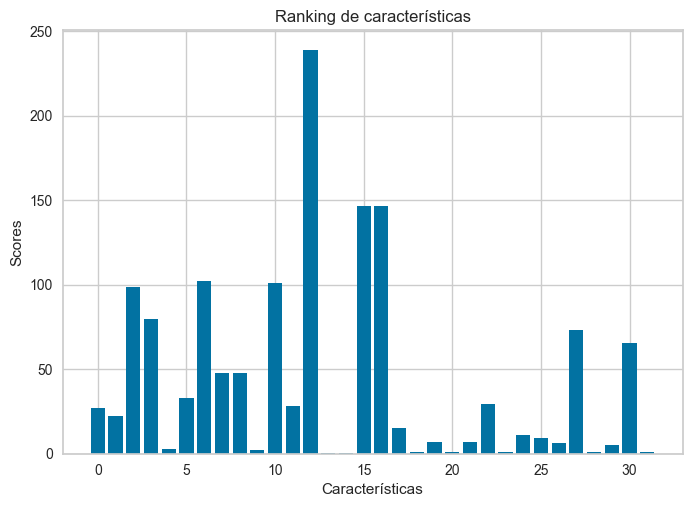

In [177]:
# Haciendo uso de los conjuntos ya transformados podemos ver el score de cada variable
# En este caso utilizamos todas las variables

n = X_train['rem'].shape[1]

X_train['rem_fs'], X_test['rem_fs'], fs = select_features(X_train['rem'], y_train['rem'], X_test['rem'],n)

for i in range(len(fs.scores_)):
    print('Feature %d: %f' % (i, fs.scores_[i]))

fig, ax = plt.subplots()
ax.bar([i for i in range(len(fs.scores_))], fs.scores_)
ax.set(title='Ranking de características',xlabel='Características',ylabel='Scores')
plt.show()

Index(['serum_cholestoral', 'target',
       'oldpeak_ST_depression_induced_by_exercise',
       'maximum_heart_rate_achieved', 'chest_pain_type_4'],
      dtype='object')


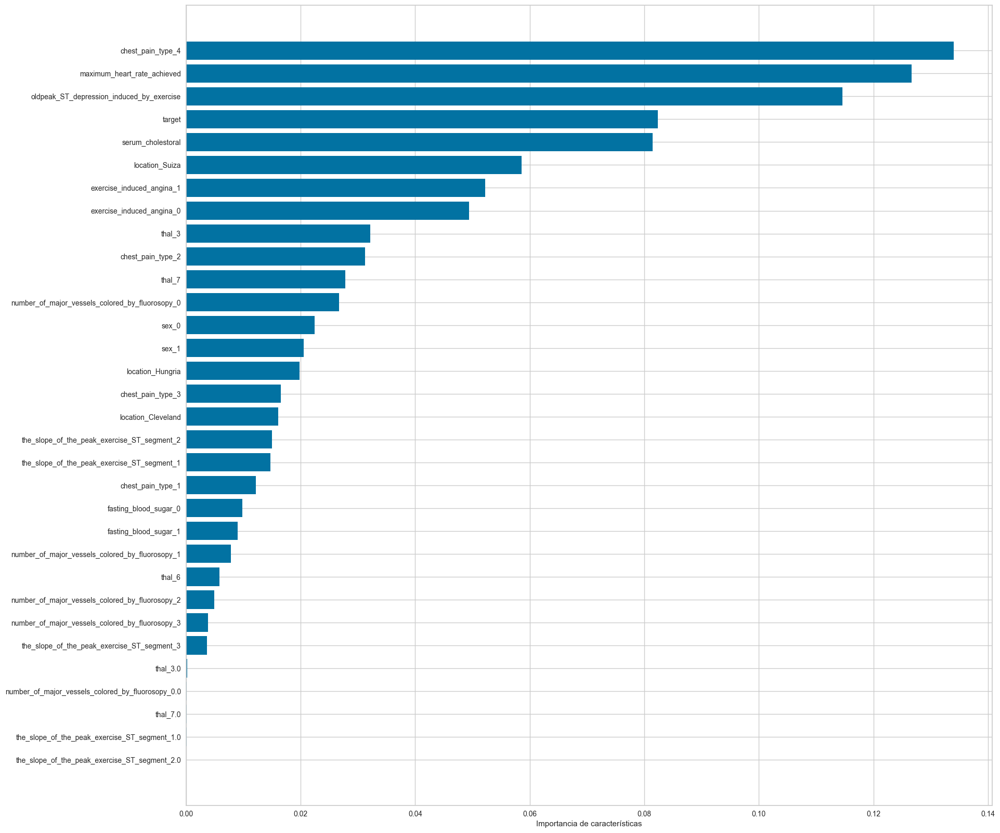

In [178]:
# Haciendo uso de un modelo de Random Forest Classifier hacemos un ranking de características
# Ordenamos y graficamos

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance

rf = RandomForestClassifier(n_estimators=150,random_state=1234)
rf.fit(X_train['rem'], y_train['rem'])
sort = rf.feature_importances_.argsort()
plt.figure(figsize=(20,20))
plt.barh(df_pipeline_rem.columns[1:][sort], rf.feature_importances_[sort])
plt.xlabel("Importancia de características")
l = len(df_pipeline_rem.columns[1:])
importants = df_pipeline_rem.columns[1:][sort][-5:]
print(importants)


Revisamos el ranking de variables para el conjunto de datos con PCA

Index(['target', 'pc4', 'pc3', 'pc2', 'chest_pain_type_4'], dtype='object')


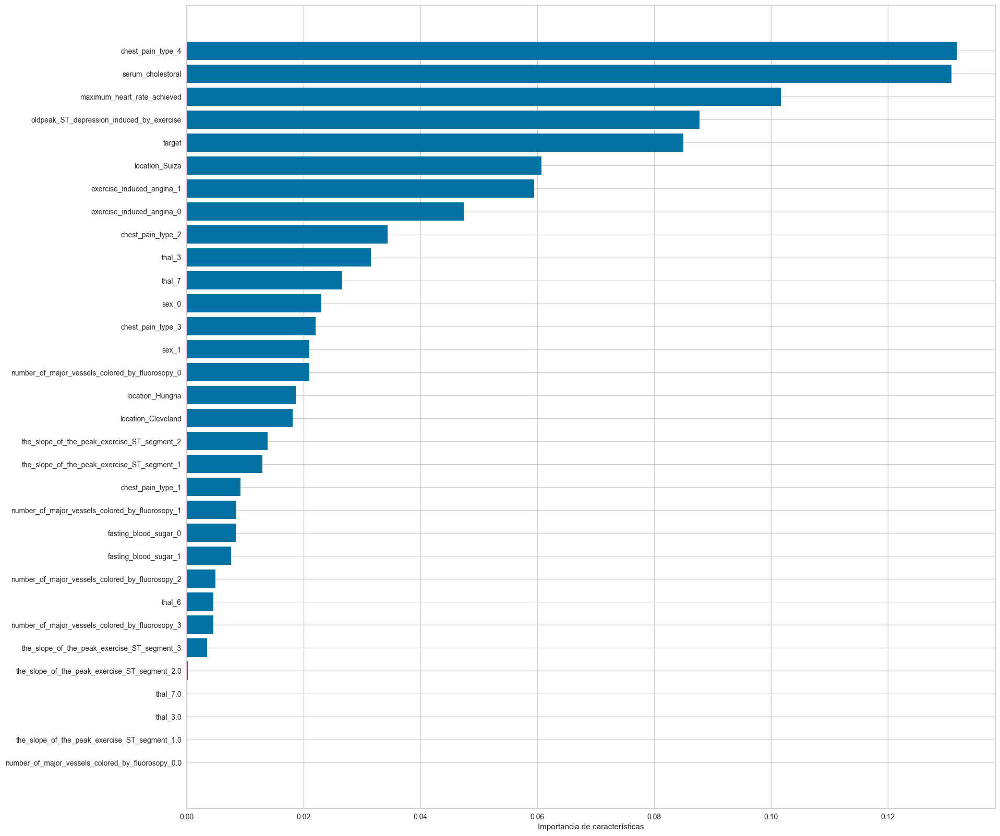

In [179]:
rf = RandomForestClassifier(n_estimators=150,random_state=1234)
rf.fit(X_train['pca_rem'], y_train['pca_rem'])
sort = rf.feature_importances_.argsort()
plt.figure(figsize=(20,20))
plt.barh(df_pipeline_rem.columns[1:][sort], rf.feature_importances_[sort])
plt.xlabel("Importancia de características")
l = len(df_pipeline_pca_rem.columns[1:])
importants = df_pipeline_pca_rem.columns[1:][sort][-5:]
print(importants)

Revisamos la cantidad de variables a seleccionar para el conjunto de datos sin PCA

(0.7037037037037037, 22)


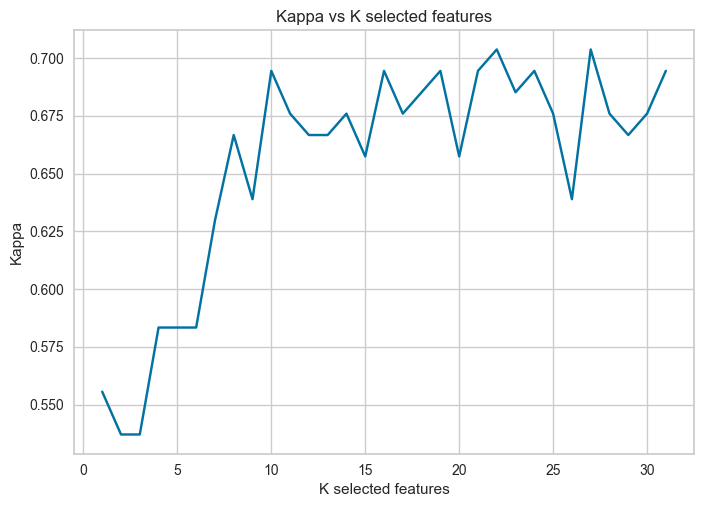

In [180]:
from sklearn.pipeline import make_pipeline

n = X_train['rem'].shape[1]
results = [kappa_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=i),
                                                 StandardScaler(),
                                                 RandomForestClassifier(n_estimators=150,random_state=1234)),
            X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])[1] for i in range(1,n)]
ax = sns.lineplot(x=range(1,n),
             y=results)
ax.set(title="Kappa vs K selected features",ylabel='Kappa',xlabel='K selected features')
kvals = [(col,i) for col,i in zip(results,range(1,n))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

Cantidad de variables a seleccionar para conjunto de datos sin PCA k = 22

Revisamos la cantidad de variables a seleccionar del conjunto de datos con PCA

(0.7407407407407407, 31)


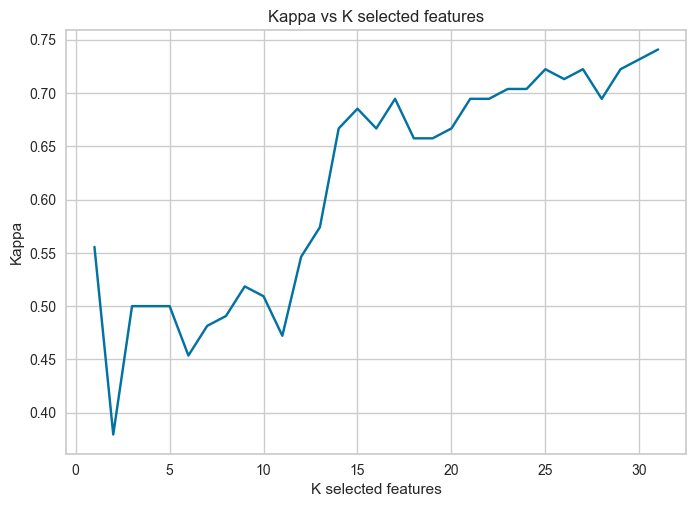

In [181]:
n = X_train['pca_rem'].shape[1]
results = [kappa_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=i),
                                                 StandardScaler(),
                                                 RandomForestClassifier(n_estimators=150,random_state=1234)),
            X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])[1] for i in range(1,n)]
ax = sns.lineplot(x=range(1,n),
             y=results)
ax.set(title="Kappa vs K selected features",ylabel='Kappa',xlabel='K selected features')
kvals = [(col,i) for col,i in zip(results,range(1,n))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

Cantidad de variables a seleccionar para conjunto de datos con PCA k = 31

In [182]:
# Modelo de regresión logística utilizando datos sin PCA y feature selection de 22 variables

model,metrics = classification_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=22),
                                                 LogisticRegressionCV(cv=5,random_state=1234)),
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionRemFS.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemFSMetrics.pkl', 'wb'))

Training Accuracy = 0.871031746031746
Test Accuracy = 0.8796296296296297
Training Kappa = 0.7420634920634921
Test Kappa = 0.7592592592592593
Training Precision = [0.85 0.89]
Test Precision = [0.91 0.85]
Training recall = [0.9  0.84]
Test recall = [0.84 0.92]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.85      0.90      0.87       252
           1       0.89      0.84      0.87       252

    accuracy                           0.87       504
   macro avg       0.87      0.87      0.87       504
weighted avg       0.87      0.87      0.87       504



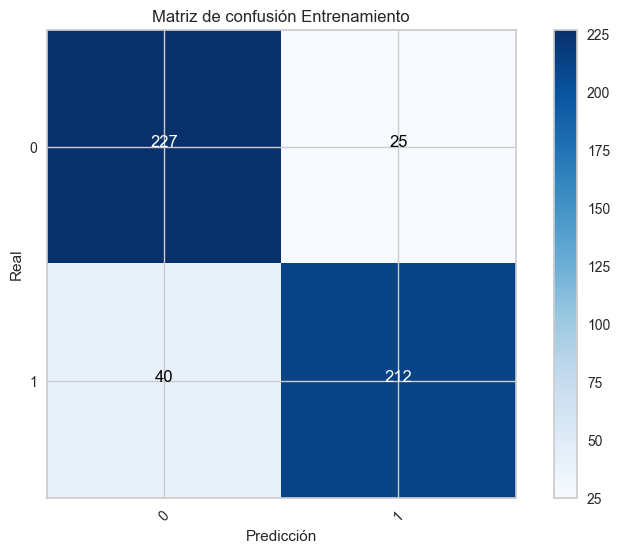

Reporte Prueba
              precision    recall  f1-score   support

           0       0.91      0.84      0.88       108
           1       0.85      0.92      0.88       108

    accuracy                           0.88       216
   macro avg       0.88      0.88      0.88       216
weighted avg       0.88      0.88      0.88       216



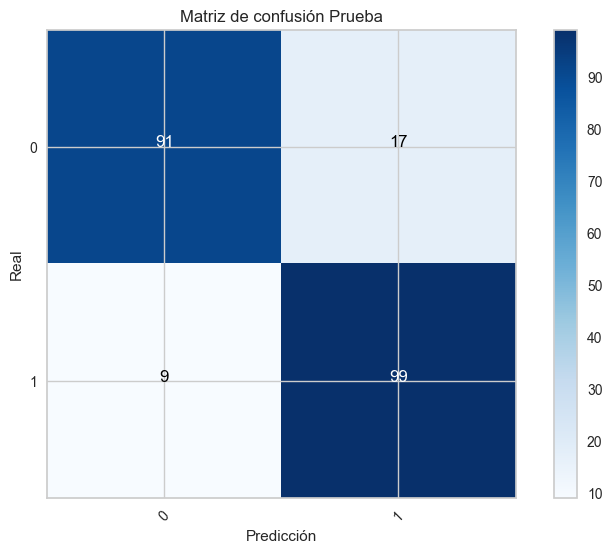

In [183]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif, k=22),
                                                 LogisticRegressionCV(cv=5,random_state=1234))
report_and_conf_matrix(pipeline_lr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

La exactitud para la prueba de nuestro modelo es del 88%

La precisión para la clase menos riesgosa es de 91% 

La sensibilidad para la clase más riesgosa de 92% 

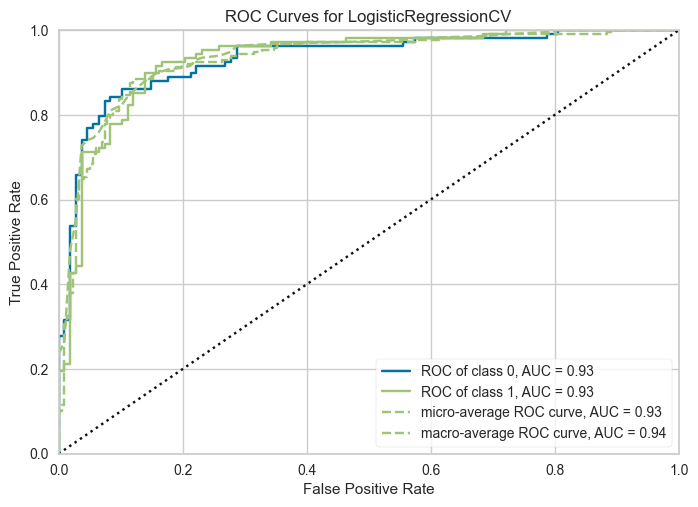

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=22)),
                                 ('logisticregressioncv',
                                  LogisticRegressionCV(cv=5,
                                                       random_state=1234))]))

In [184]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif, k=22),
                                                 LogisticRegressionCV(cv=5,random_state=1234))
plot_ROC_curve(pipeline_lr, X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

- La curva micro-average arroja un valor adecuado de 0.93
- La curva macro-average arroja un valor adecuado de 0.94
- Aunque el modelo parece funcionar bien para las clases riesgo 0, 1. Nuestro objetivo es que describa perfectamente la clase 1

Modelo de regresión logistica sobre conjunto de datos con PCA

In [185]:
model,metrics = classification_metrics(LogisticRegressionCV(cv=5,random_state=1234),
                                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionPCARem.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemMetrics.pkl', 'wb'))

Training Accuracy = 0.8571428571428571
Test Accuracy = 0.875
Training Kappa = 0.7142857142857143
Test Kappa = 0.75
Training Precision = [0.84 0.87]
Test Precision = [0.91 0.85]
Training recall = [0.88 0.84]
Test recall = [0.83 0.92]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.84      0.88      0.86       252
           1       0.87      0.84      0.85       252

    accuracy                           0.86       504
   macro avg       0.86      0.86      0.86       504
weighted avg       0.86      0.86      0.86       504



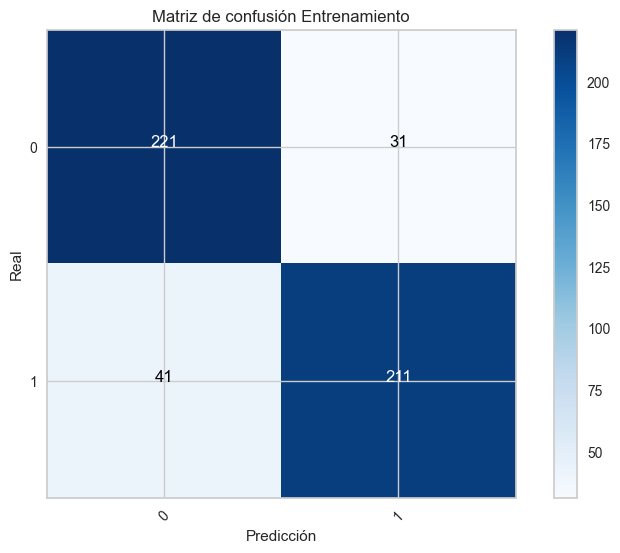

Reporte Prueba
              precision    recall  f1-score   support

           0       0.91      0.83      0.87       108
           1       0.85      0.92      0.88       108

    accuracy                           0.88       216
   macro avg       0.88      0.88      0.87       216
weighted avg       0.88      0.88      0.87       216



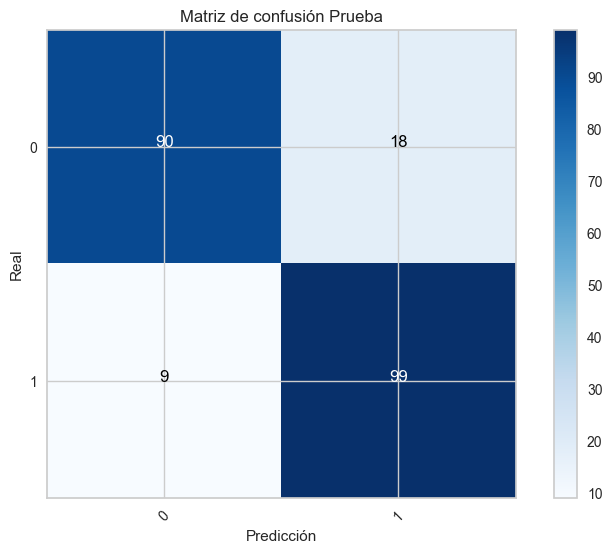

In [186]:
report_and_conf_matrix(LogisticRegressionCV(cv=5,random_state=1234),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

La exactitud para la prueba de nuestro modelo es del 88%

La precisión para la clase menos riesgosa es de 91% 

La sensibilidad para la clase más riesgosa de 92% 

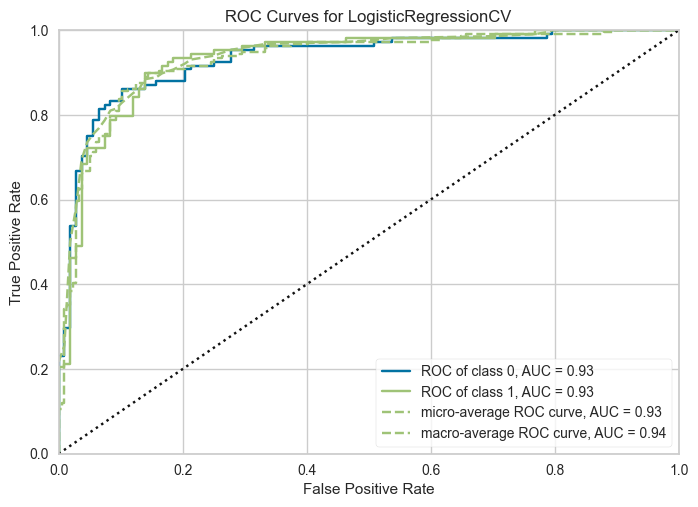

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1], estimator=LogisticRegressionCV(cv=5, random_state=1234))

In [187]:
plot_ROC_curve(LogisticRegressionCV(cv=5,random_state=1234), 
               X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

- La curva micro-average arroja un valor muy bueno de 0.93
- La curva macro-average arroja un valor muy bueno de 0.94

Modelo de Regresión logística sobre conjunto de datos con PCA y feature selection

In [188]:
# Modelo de regresión logística utilizando datos con PCA y feature selection de 31 variables

model,metrics = classification_metrics(make_pipeline(SelectKBest(score_func=f_classif, k=31),
                                                 LogisticRegressionCV(cv=5,random_state=1234)),
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/logisticRegressionPCARemFS.pkl', 'wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemFSMetrics.pkl', 'wb'))

Training Accuracy = 0.8630952380952381
Test Accuracy = 0.8796296296296297
Training Kappa = 0.7261904761904762
Test Kappa = 0.7592592592592593
Training Precision = [0.85 0.88]
Test Precision = [0.92 0.85]
Training recall = [0.88 0.85]
Test recall = [0.83 0.93]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.85      0.88      0.87       252
           1       0.88      0.85      0.86       252

    accuracy                           0.86       504
   macro avg       0.86      0.86      0.86       504
weighted avg       0.86      0.86      0.86       504



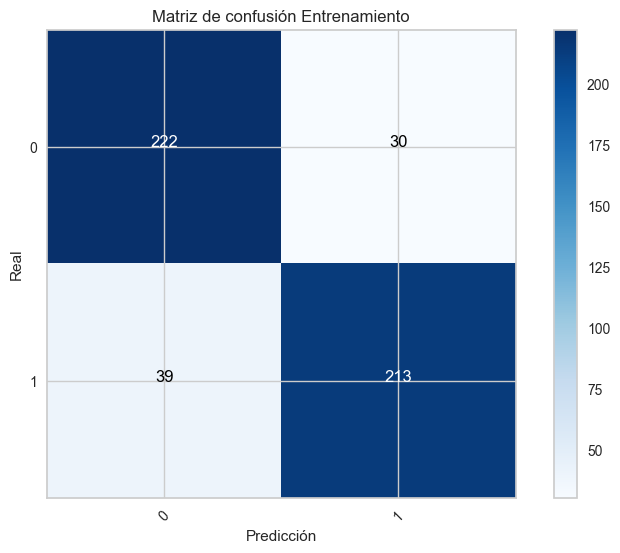

Reporte Prueba
              precision    recall  f1-score   support

           0       0.92      0.83      0.87       108
           1       0.85      0.93      0.88       108

    accuracy                           0.88       216
   macro avg       0.88      0.88      0.88       216
weighted avg       0.88      0.88      0.88       216



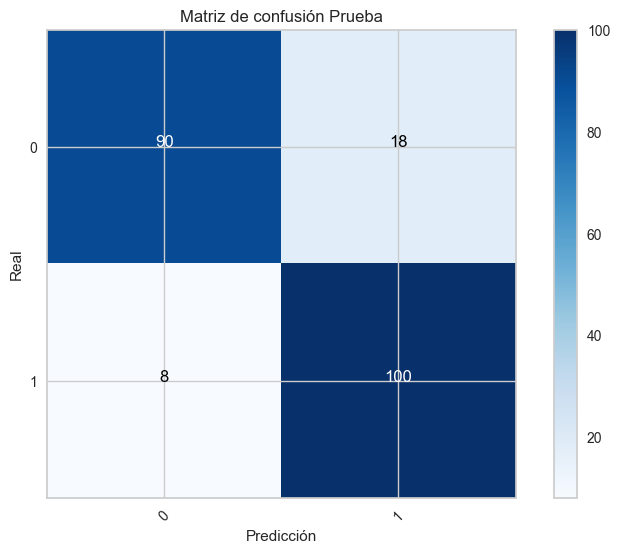

In [189]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            LogisticRegressionCV(cv=5,random_state=1234))
report_and_conf_matrix(pipeline_lr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

La exactitud para la prueba de nuestro modelo es del 88%

La precisión para la clase menos riesgosa es de 92% 

La sensibilidad para la clase más riesgosa de 93%

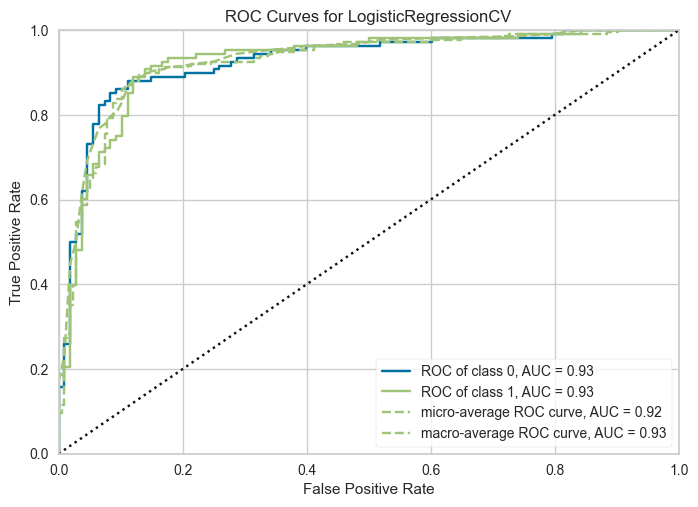

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for LogisticRegressionCV'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('logisticregressioncv',
                                  LogisticRegressionCV(cv=5,
                                                       random_state=1234))]))

In [190]:
pipeline_lr = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            LogisticRegressionCV(cv=5,random_state=1234))
plot_ROC_curve(pipeline_lr,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

- La curva micro-average arroja un valor muy bueno de 0.92
- La curva macro-average arroja un valor muy bueno de 0.93

### 7.3. Modelo de K vecinos más cercanos

Para este modelo tan solamente incluimos las variables continuas, pues es un método basado en distancias. No tienen sentido utilizar las variables categóricas dummificadas

In [191]:
# Escalamos y estandarizamos para ver los resultados del modelo

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier

print('Stadardization')
knnReg_st = make_pipeline(StandardScaler(),KNeighborsClassifier())
cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
classification_metrics(knnReg_st,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
print()
print('Normalization')
knnReg_norm = make_pipeline(MinMaxScaler(),KNeighborsClassifier())
classification_metrics(knnReg_norm,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])

Stadardization
Training Accuracy = 0.8313492063492064
Test Accuracy = 0.7962962962962963
Training Kappa = 0.6626984126984127
Test Kappa = 0.5925925925925926
Training Precision = [0.81 0.86]
Test Precision = [0.77 0.83]
Training recall = [0.87 0.79]
Test recall = [0.84 0.75]

Normalization
Training Accuracy = 0.8412698412698413
Test Accuracy = 0.7731481481481481
Training Kappa = 0.6825396825396826
Test Kappa = 0.5462962962962963
Training Precision = [0.82 0.87]
Test Precision = [0.75 0.8 ]
Training recall = [0.88 0.8 ]
Test recall = [0.82 0.72]


(Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                 ('kneighborsclassifier', KNeighborsClassifier())]),
 {'Training Accuracy': 0.8412698412698413,
  'Test Accuracy': 0.7731481481481481,
  'Training Kappa': 0.6825396825396826,
  'Test Kappa': 0.5462962962962963,
  'Training Precision': array([0.82, 0.87]),
  'Test Precision': array([0.75, 0.8 ]),
  'Training recall': array([0.88, 0.8 ]),
  'Test recall': array([0.82, 0.72])})

In [192]:
# Podemos encontrar el mejor k para nuestro modelo
# Utilizamos un pipeline para incluir la normalización y el clasificador knn 

cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
for k in range(1,21,2):
    print('Results for k =',k)
    knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
    classification_metrics(knnReg_st,X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
    print()

Results for k = 1
Training Accuracy = 1.0
Test Accuracy = 0.6620370370370371
Training Kappa = 1.0
Test Kappa = 0.32407407407407407
Training Precision = [1. 1.]
Test Precision = [0.66 0.67]
Training recall = [1. 1.]
Test recall = [0.68 0.65]

Results for k = 3
Training Accuracy = 0.8432539682539683
Test Accuracy = 0.7731481481481481
Training Kappa = 0.6865079365079365
Test Kappa = 0.5462962962962963
Training Precision = [0.83 0.86]
Test Precision = [0.76 0.79]
Training recall = [0.87 0.82]
Test recall = [0.81 0.74]

Results for k = 5
Training Accuracy = 0.8412698412698413
Test Accuracy = 0.7731481481481481
Training Kappa = 0.6825396825396826
Test Kappa = 0.5462962962962963
Training Precision = [0.82 0.87]
Test Precision = [0.75 0.8 ]
Training recall = [0.88 0.8 ]
Test recall = [0.82 0.72]

Results for k = 7
Training Accuracy = 0.8134920634920635
Test Accuracy = 0.7870370370370371
Training Kappa = 0.626984126984127
Test Kappa = 0.5740740740740741
Training Precision = [0.79 0.84]
Test Pre

(0.5925925925925926, 11)


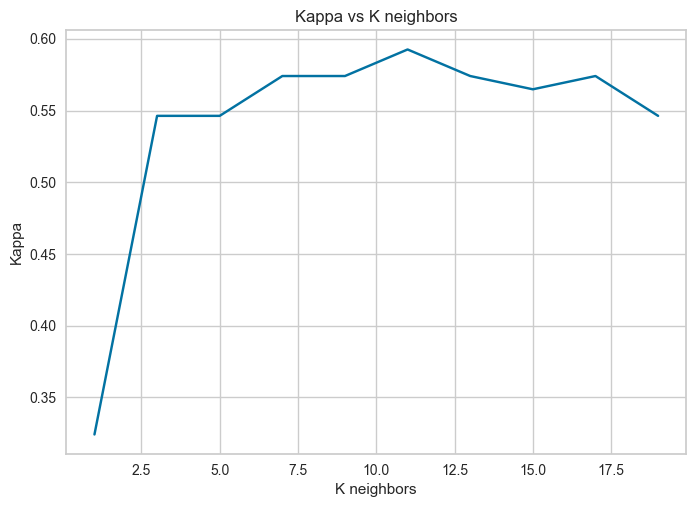

In [193]:
# Visualizamos el kappa
# Observamos la mejor respuesta con k=11

cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
results = [kappa_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=i)),
            X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])[1] for i in range(1,21,2)]
ax = sns.lineplot(x=range(1,21,2),
             y=results)
ax.set(title="Kappa vs K neighbors",ylabel='Kappa',xlabel='K neighbors')
kvals = [(col,i) for col,i in zip(results,range(1,21,2))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

In [200]:
# Guardamos el mejor modelo utilizando k=11 sin PCA

cols = ['age', 'serum_cholestoral', 'maximum_heart_rate_achieved', 'oldpeak_ST_depression_induced_by_exercise']
model,metrics = classification_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=11)),
                                   X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/KnnClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.7996031746031746
Test Accuracy = 0.7962962962962963
Training Kappa = 0.5992063492063492
Test Kappa = 0.5925925925925926
Training Precision = [0.77 0.84]
Test Precision = [0.77 0.83]
Training recall = [0.86 0.74]
Test recall = [0.84 0.75]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.75      0.88      0.81       252
           1       0.86      0.70      0.77       252

    accuracy                           0.79       504
   macro avg       0.80      0.79      0.79       504
weighted avg       0.80      0.79      0.79       504



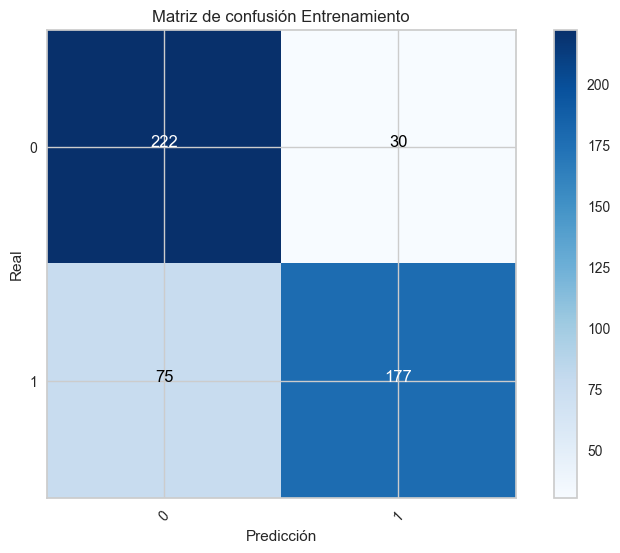

Reporte Prueba
              precision    recall  f1-score   support

           0       0.76      0.83      0.79       108
           1       0.81      0.73      0.77       108

    accuracy                           0.78       216
   macro avg       0.79      0.78      0.78       216
weighted avg       0.79      0.78      0.78       216



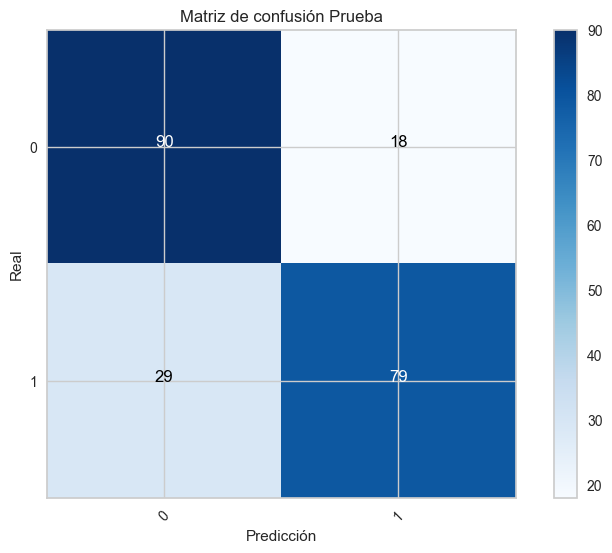

In [201]:
report_and_conf_matrix(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                       X_train['rem'][cols],X_test['rem'][cols],y_train['rem'],y_test['rem'])

La exactitud para la prueba de nuestro modelo es del 78%

La precisión para la clase menos riesgosa es de 76% 

La sensibilidad para la clase más riesgosa de 73%

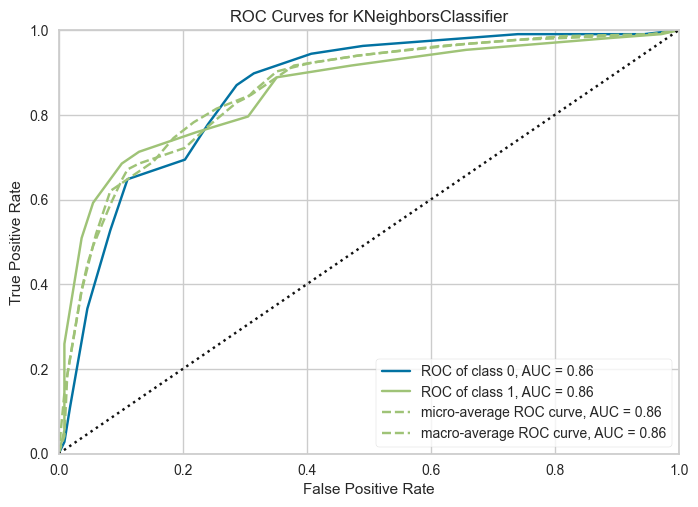

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('kneighborsclassifier',
                                  KNeighborsClassifier(n_neighbors=15))]))

In [202]:
plot_ROC_curve(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                X_train=X_train['rem'][cols], y_train=y_train['rem'],X_test=X_test['rem'][cols], y_test=y_test['rem'])

Obtenemos peores resultados que con la regresión logística, las AUC micro y macro son de 0.86 y 0.86 respectivamente. Aunque aceptables, peores que los obtenidos previamente

Ahora trabajamos con el dataset con PCA

In [197]:
# Podemos encontrar el mejor k para nuestro modelo
# Utilizamos un pipeline para incluir la normalización y el clasificador knn 

cols = ['pc1','pc2','pc3','pc4']
for k in range(1,21,2):
    print('Results for k =',k)
    knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
    classification_metrics(knnReg_st,X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])
    print()

Results for k = 1
Training Accuracy = 1.0
Test Accuracy = 0.6527777777777778
Training Kappa = 1.0
Test Kappa = 0.3055555555555556
Training Precision = [1. 1.]
Test Precision = [0.65 0.65]
Training recall = [1. 1.]
Test recall = [0.66 0.65]

Results for k = 3
Training Accuracy = 0.8531746031746031
Test Accuracy = 0.7777777777777778
Training Kappa = 0.7063492063492063
Test Kappa = 0.5555555555555556
Training Precision = [0.84 0.87]
Test Precision = [0.76 0.79]
Training recall = [0.87 0.83]
Test recall = [0.81 0.75]

Results for k = 5
Training Accuracy = 0.8313492063492064
Test Accuracy = 0.7824074074074074
Training Kappa = 0.6626984126984127
Test Kappa = 0.5648148148148149
Training Precision = [0.81 0.86]
Test Precision = [0.76 0.81]
Training recall = [0.87 0.79]
Test recall = [0.83 0.73]

Results for k = 7
Training Accuracy = 0.8075396825396826
Test Accuracy = 0.7870370370370371
Training Kappa = 0.6150793650793651
Test Kappa = 0.5740740740740741
Training Precision = [0.78 0.84]
Test Pre

(0.6111111111111112, 9)


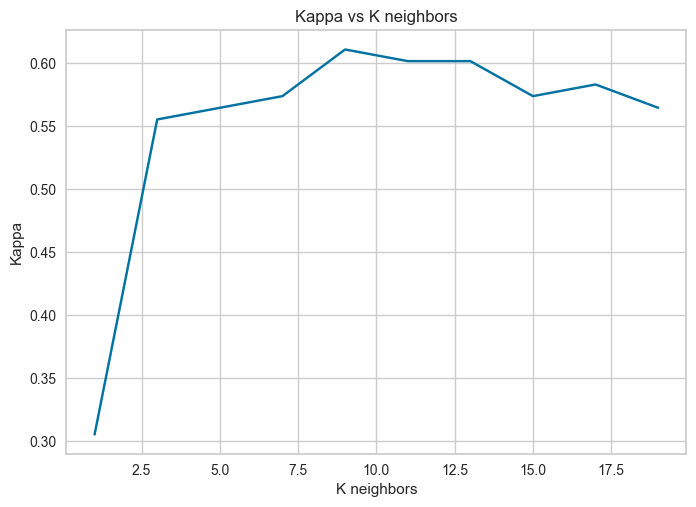

In [198]:
# Visualizamos el kappa
# Observamos la mejor respuesta con k=9

cols = ['pc1','pc2','pc3','pc4']
knnReg_st = make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=k))
results = [kappa_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=i)),
            X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])[1] for i in range(1,21,2)]
ax = sns.lineplot(x=range(1,21,2),
             y=results)
ax.set(title="Kappa vs K neighbors",ylabel='Kappa',xlabel='K neighbors')
kvals = [(col,i) for col,i in zip(results,range(1,21,2))]

print(sorted(kvals, key=lambda x: x[0],reverse=True)[0])

In [204]:
# Guardamos el mejor modelo utilizando k=9 con PCA

cols = ['pc1','pc2','pc3','pc4']
model,metrics = classification_metrics(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=9)),
                                   X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/KnnClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.7996031746031746
Test Accuracy = 0.8055555555555556
Training Kappa = 0.5992063492063492
Test Kappa = 0.6111111111111112
Training Precision = [0.77 0.84]
Test Precision = [0.78 0.83]
Training recall = [0.86 0.74]
Test recall = [0.84 0.77]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.77      0.89      0.82       252
           1       0.87      0.73      0.79       252

    accuracy                           0.81       504
   macro avg       0.82      0.81      0.81       504
weighted avg       0.82      0.81      0.81       504



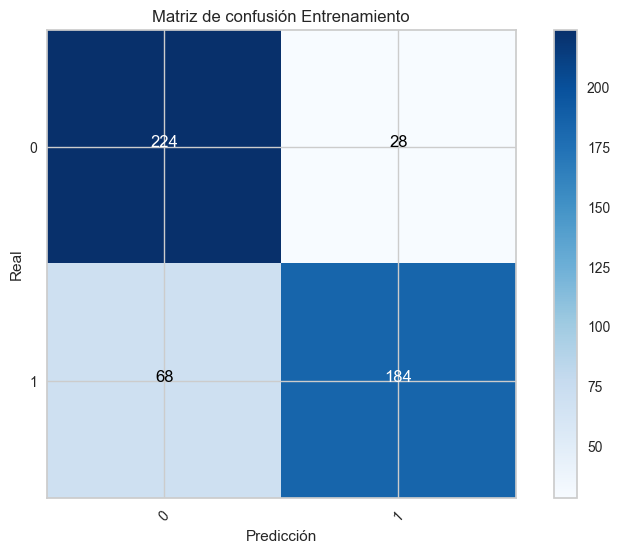

Reporte Prueba
              precision    recall  f1-score   support

           0       0.77      0.82      0.79       108
           1       0.81      0.75      0.78       108

    accuracy                           0.79       216
   macro avg       0.79      0.79      0.79       216
weighted avg       0.79      0.79      0.79       216



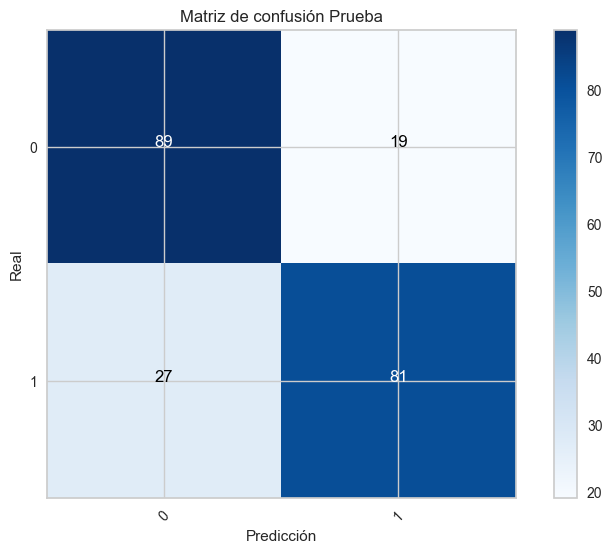

In [205]:
report_and_conf_matrix(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                       X_train['pca_rem'][cols],X_test['pca_rem'][cols],y_train['pca_rem'],y_test['pca_rem'])

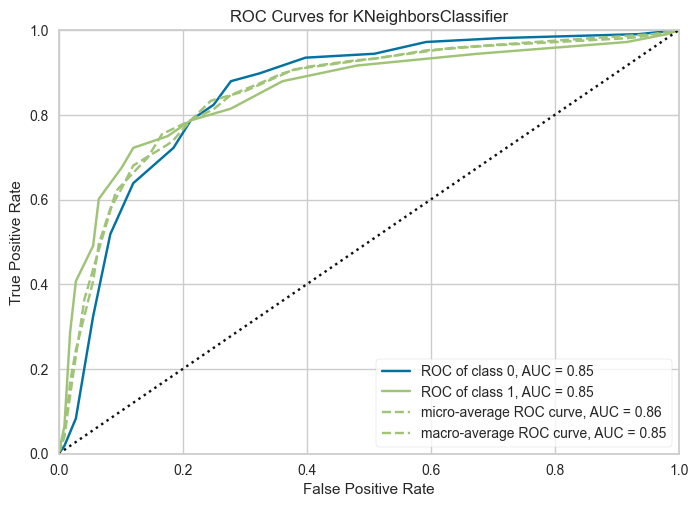

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for KNeighborsClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                                 ('kneighborsclassifier',
                                  KNeighborsClassifier(n_neighbors=15))]))

In [206]:
plot_ROC_curve(make_pipeline(MinMaxScaler(),KNeighborsClassifier(n_neighbors=15)),
                X_train=X_train['pca_rem'][cols], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'][cols], y_test=y_test['pca_rem'])

### 7.4. Modelo Naïve Bayes

Utilizamos primero el conjunto de datos sin PCA

In [207]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV

classification_metrics(GaussianNB(),X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

Training Accuracy = 0.7003968253968254
Test Accuracy = 0.6712962962962963
Training Kappa = 0.4007936507936508
Test Kappa = 0.34259259259259256
Training Precision = [0.96 0.63]
Test Precision = [0.95 0.61]
Training recall = [0.42 0.98]
Test recall = [0.36 0.98]


(GaussianNB(),
 {'Training Accuracy': 0.7003968253968254,
  'Test Accuracy': 0.6712962962962963,
  'Training Kappa': 0.4007936507936508,
  'Test Kappa': 0.34259259259259256,
  'Training Precision': array([0.96, 0.63]),
  'Test Precision': array([0.95, 0.61]),
  'Training recall': array([0.42, 0.98]),
  'Test recall': array([0.36, 0.98])})

In [208]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_train['rem'], y_train['rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [209]:
# Mejores hiperparámetros

gs_NB.best_params_

{'var_smoothing': 2.848035868435799e-06}

In [210]:
gs_NB.best_score_

0.8512673267326732

In [211]:
# Guardamos el mejor modelo utilizando el dataset sin PCA

model,metrics = classification_metrics(GaussianNB(var_smoothing=2.848035868435799e-06),
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.8492063492063492
Test Accuracy = 0.8425925925925926
Training Kappa = 0.6984126984126984
Test Kappa = 0.6851851851851851
Training Precision = [0.84 0.86]
Test Precision = [0.86 0.82]
Training recall = [0.86 0.84]
Test recall = [0.81 0.87]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.84      0.86      0.85       252
           1       0.86      0.84      0.85       252

    accuracy                           0.85       504
   macro avg       0.85      0.85      0.85       504
weighted avg       0.85      0.85      0.85       504



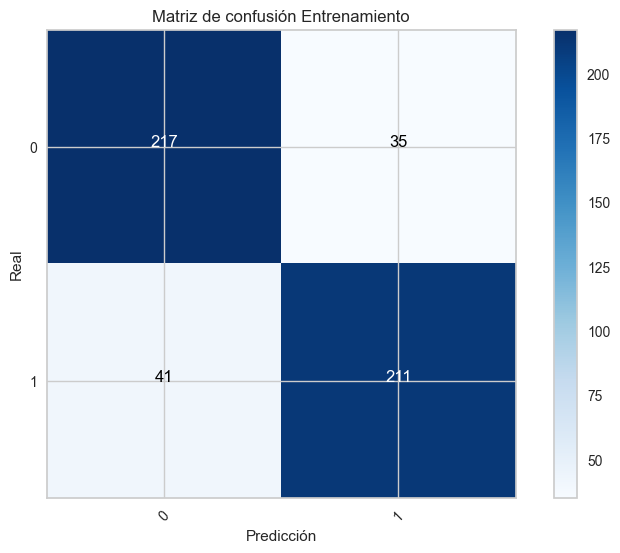

Reporte Prueba
              precision    recall  f1-score   support

           0       0.86      0.81      0.84       108
           1       0.82      0.87      0.85       108

    accuracy                           0.84       216
   macro avg       0.84      0.84      0.84       216
weighted avg       0.84      0.84      0.84       216



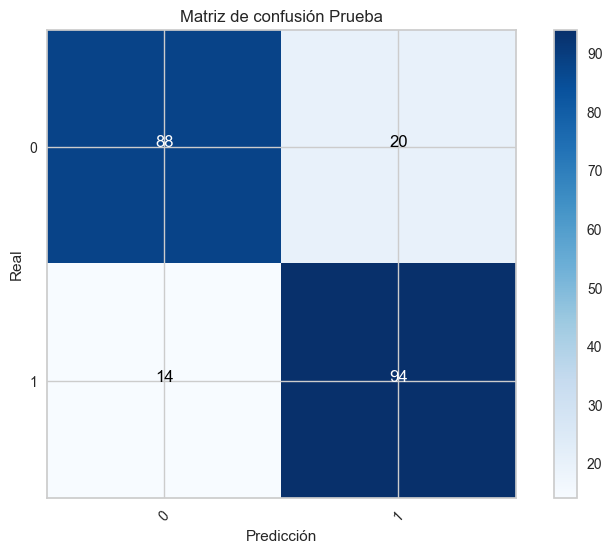

In [212]:
report_and_conf_matrix(GaussianNB(var_smoothing=2.848035868435799e-06),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

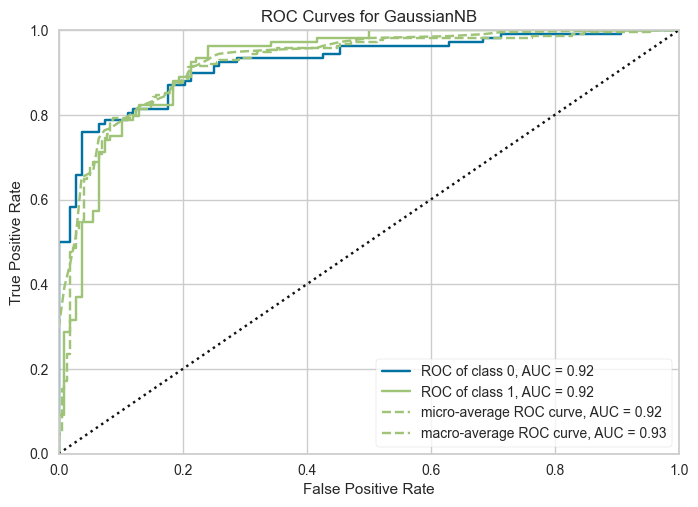

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=GaussianNB(var_smoothing=2.848035868435799e-06))

In [213]:
plot_ROC_curve(GaussianNB(var_smoothing=2.848035868435799e-06),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Trabajamos con el conjunto de datos sin PCA pero con feature selection

In [215]:
nb_classifier = GaussianNB()

X_t = SelectKBest(score_func=f_classif,k=22).fit_transform(X_train['rem'], y_train['rem'])

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_t, y_train['rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [216]:
gs_NB.best_params_

{'var_smoothing': 8.111308307896873e-06}

In [217]:
gs_NB.best_score_

0.8473267326732674

In [218]:
# Guardamos el mejor modelo sin PCA utilizando feature selection

pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                            GaussianNB(var_smoothing=8.111308307896873e-06))

model,metrics = classification_metrics(pipeline_nb,
                                   X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.8531746031746031
Test Accuracy = 0.8472222222222222
Training Kappa = 0.7063492063492063
Test Kappa = 0.6944444444444444
Training Precision = [0.83 0.87]
Test Precision = [0.86 0.84]
Training recall = [0.88 0.83]
Test recall = [0.83 0.86]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.83      0.88      0.86       252
           1       0.87      0.83      0.85       252

    accuracy                           0.85       504
   macro avg       0.85      0.85      0.85       504
weighted avg       0.85      0.85      0.85       504



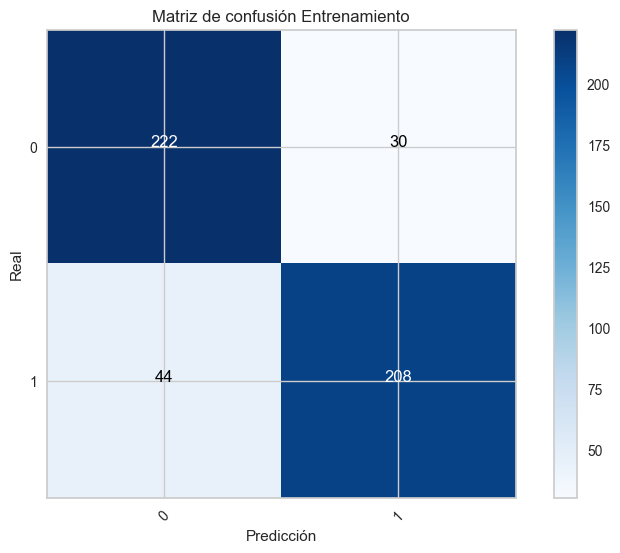

Reporte Prueba
              precision    recall  f1-score   support

           0       0.86      0.83      0.85       108
           1       0.84      0.86      0.85       108

    accuracy                           0.85       216
   macro avg       0.85      0.85      0.85       216
weighted avg       0.85      0.85      0.85       216



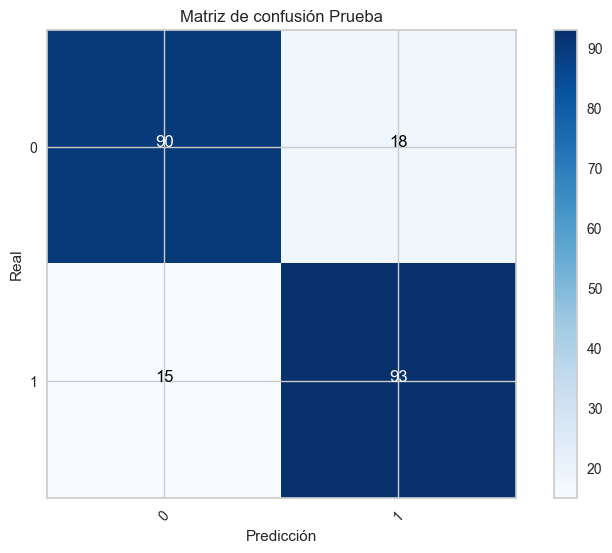

In [219]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                            GaussianNB(var_smoothing=8.111308307896873e-06))
report_and_conf_matrix(pipeline_nb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

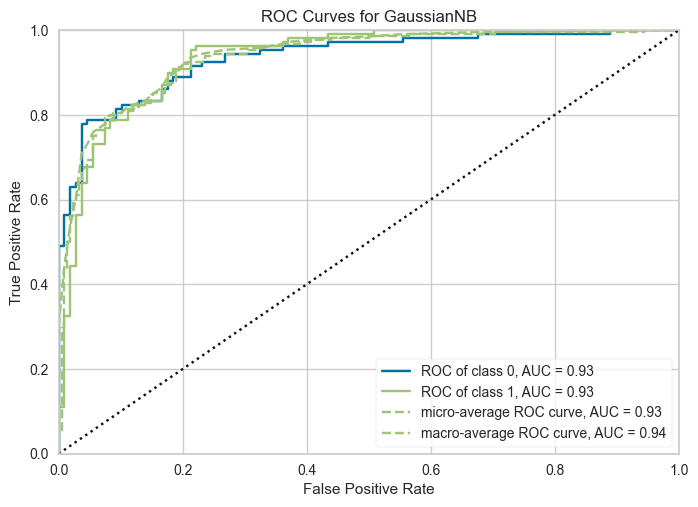

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=22)),
                                 ('gaussiannb',
                                  GaussianNB(var_smoothing=8.111308307896873e-06))]))

In [220]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                            GaussianNB(var_smoothing=8.111308307896873e-06))
plot_ROC_curve(pipeline_nb,X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Utilizamos el conjunto de datos con PCA

In [221]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_train['pca_rem'], y_train['pca_rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [222]:
gs_NB.best_params_

{'var_smoothing': 0.12328467394420659}

In [223]:
gs_NB.best_score_

0.8473465346534652

In [224]:
# Guardamos el mejor modelo utilizando el dataset con PCA

model,metrics = classification_metrics(GaussianNB(var_smoothing=0.12328467394420659),
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.8492063492063492
Test Accuracy = 0.8425925925925926
Training Kappa = 0.6984126984126984
Test Kappa = 0.6851851851851851
Training Precision = [0.81 0.9 ]
Test Precision = [0.84 0.85]
Training recall = [0.91 0.79]
Test recall = [0.85 0.83]


Utilizamos el conjunto de datos con PCA y con feature selection

In [225]:
nb_classifier = GaussianNB()

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'], y_train['pca_rem'])

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5, 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(X_t, y_train['pca_rem'])

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00e+00, 8.11e-01, 6.58e-01, 5.34e-01, 4.33e-01, 3.51e-01,
       2.85e-01, 2.31e-01, 1.87e-01, 1.52e-01, 1.23e-01, 1.00e-01,
       8.11e-02, 6.58e-02, 5.34e-02, 4.33e-02, 3.51e-02, 2.85e-02,
       2.31e-02, 1.87e-02, 1.52e-02, 1.23e-02, 1.00e-02, 8.11e-03,
       6.58e-03, 5.34e-03, 4.33e-03, 3.51e-03, 2.85e-03, 2.31e-03,
       1.87...
       3.51e-06, 2.85e-06, 2.31e-06, 1.87e-06, 1.52e-06, 1.23e-06,
       1.00e-06, 8.11e-07, 6.58e-07, 5.34e-07, 4.33e-07, 3.51e-07,
       2.85e-07, 2.31e-07, 1.87e-07, 1.52e-07, 1.23e-07, 1.00e-07,
       8.11e-08, 6.58e-08, 5.34e-08, 4.33e-08, 3.51e-08, 2.85e-08,
       2.31e-08, 1.87e-08, 1.52e-08, 1.23e-08, 1.00e-08, 8.11e-09,
       6.58e-09, 5.34e-09, 4.33e-09, 3.51e-09, 2.85e-09, 2.31e-09,
       1.87e-09, 1.52e-09, 1.23e-09, 1.00e-09])},
             scoring='accuracy', verbose=1)

In [226]:
gs_NB.best_params_

{'var_smoothing': 0.03511191734215131}

In [227]:
gs_NB.best_score_

0.8433069306930694

In [228]:
# Guardamos el mejor modelo con PCA utilizando feature selection

pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            GaussianNB(var_smoothing=0.03511191734215131))

model,metrics = classification_metrics(pipeline_nb,
                                   X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/NBClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.8452380952380952
Test Accuracy = 0.8518518518518519
Training Kappa = 0.6904761904761905
Test Kappa = 0.7037037037037037
Training Precision = [0.82 0.87]
Test Precision = [0.87 0.83]
Training recall = [0.88 0.81]
Test recall = [0.82 0.88]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       252
           1       0.87      0.81      0.84       252

    accuracy                           0.85       504
   macro avg       0.85      0.85      0.85       504
weighted avg       0.85      0.85      0.85       504



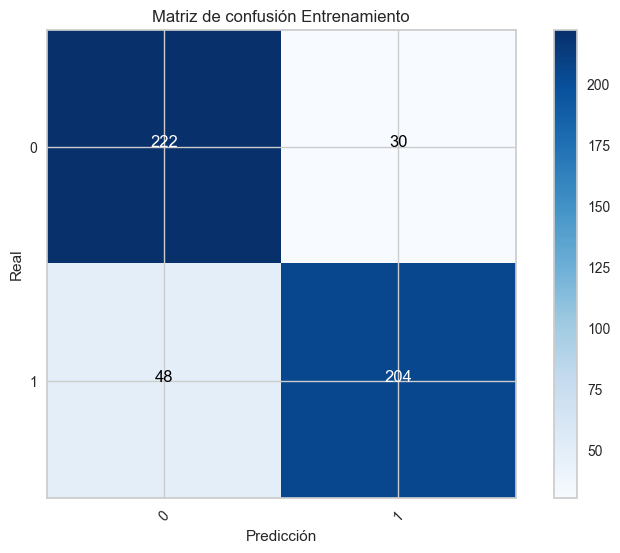

Reporte Prueba
              precision    recall  f1-score   support

           0       0.87      0.82      0.85       108
           1       0.83      0.88      0.86       108

    accuracy                           0.85       216
   macro avg       0.85      0.85      0.85       216
weighted avg       0.85      0.85      0.85       216



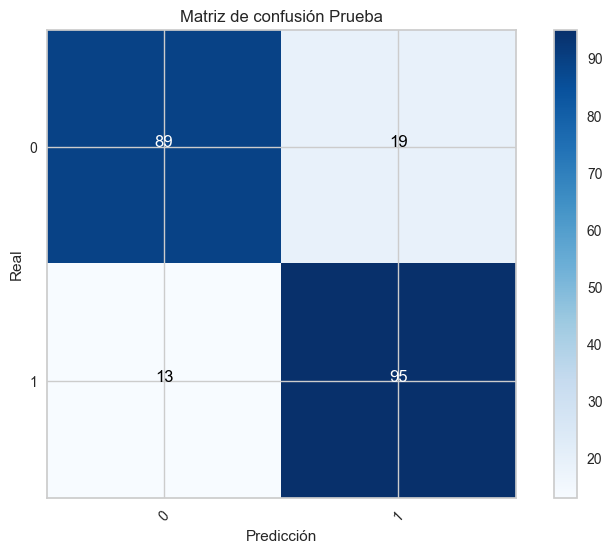

In [229]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            GaussianNB(var_smoothing=0.03511191734215131))
report_and_conf_matrix(pipeline_nb,
                X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

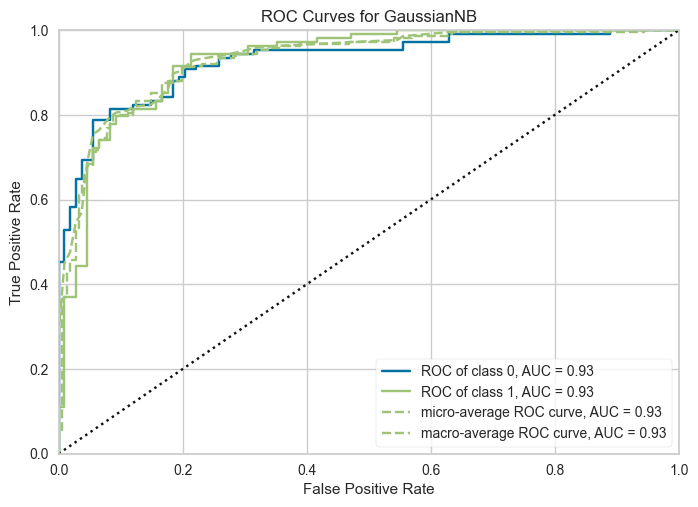

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GaussianNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('gaussiannb',
                                  GaussianNB(var_smoothing=0.03511191734215131))]))

In [230]:
pipeline_nb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            GaussianNB(var_smoothing=0.03511191734215131))
plot_ROC_curve(pipeline_nb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.5. Modelo de Árbol de Clasificación

Conjunto de datos sin PCA

Training Accuracy = 1.0
Test Accuracy = 0.7731481481481481
Training Kappa = 1.0
Test Kappa = 0.5462962962962963
Training Precision = [1. 1.]
Test Precision = [0.79 0.76]
Training recall = [1. 1.]
Test recall = [0.74 0.81]
DecisionTreeClassifier(random_state=1234)


[Text(0.5, 0.9, 'x[12] <= 0.5\ngini = 0.5\nsamples = 504\nvalue = [252, 252]'),
 Text(0.25, 0.7, 'x[6] <= 0.5\ngini = 0.345\nsamples = 257\nvalue = [200, 57]'),
 Text(0.125, 0.5, 'x[30] <= 0.5\ngini = 0.295\nsamples = 239\nvalue = [196, 43]'),
 Text(0.0625, 0.3, 'x[3] <= 1.7\ngini = 0.228\nsamples = 206\nvalue = [179, 27]'),
 Text(0.03125, 0.1, '\n  (...)  \n'),
 Text(0.09375, 0.1, '\n  (...)  \n'),
 Text(0.1875, 0.3, 'x[22] <= 0.5\ngini = 0.5\nsamples = 33\nvalue = [17, 16]'),
 Text(0.15625, 0.1, '\n  (...)  \n'),
 Text(0.21875, 0.1, '\n  (...)  \n'),
 Text(0.375, 0.5, 'x[2] <= 132.5\ngini = 0.346\nsamples = 18\nvalue = [4, 14]'),
 Text(0.3125, 0.3, 'x[27] <= 0.5\ngini = 0.142\nsamples = 13\nvalue = [1, 12]'),
 Text(0.28125, 0.1, '\n  (...)  \n'),
 Text(0.34375, 0.1, '\n  (...)  \n'),
 Text(0.4375, 0.3, 'x[0] <= 57.0\ngini = 0.48\nsamples = 5\nvalue = [3, 2]'),
 Text(0.40625, 0.1, '\n  (...)  \n'),
 Text(0.46875, 0.1, '\n  (...)  \n'),
 Text(0.75, 0.7, 'x[16] <= 0.5\ngini = 0.332\nsam

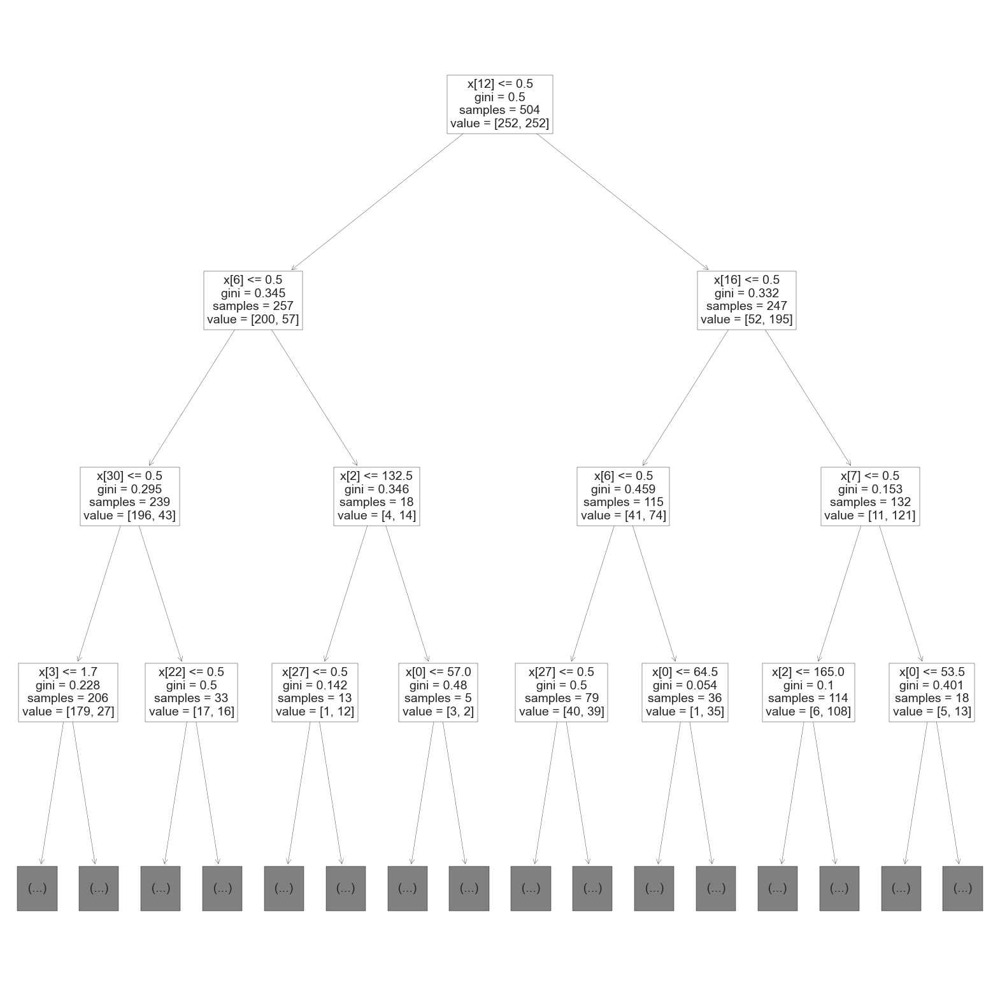

In [231]:
# Utilizamos un árbol de clasificación
# Verificamos sus métricas

from sklearn.tree import DecisionTreeClassifier, plot_tree

classification_metrics(DecisionTreeClassifier(random_state=1234),X_train['rem'],X_test['rem'],y_train['pca_rem'],y_test['pca_rem'])

tree_reg = DecisionTreeClassifier(random_state=1234).fit(X_train['rem'],y_train['rem'])
print(tree_reg)

# Diagramamos los primeros tres niveles del árbol resultante

plt.figure(figsize=(20,20))
plot_tree(tree_reg,filled=False,fontsize=14,max_depth=3)

In [232]:
# Vamos a realizar un ajuste de hiperparámetros para encontrar el mejor modelo de árbol de clasificación
# Establecemos la grilla de parámetros que verificar
# Haciendo uso de estos parámetros y una validación cruzada de 3 doblajes buscamos el mejor modelo
# Tiempo aprox = 2s 

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer

kappa_scorer = make_scorer(cohen_kappa_score)
tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),
                          param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [233]:
# Los híperparámetros del mejor modelo

tuning_model.best_params_

{'max_depth': 5,
 'max_leaf_nodes': 10,
 'min_samples_leaf': 1,
 'splitter': 'random'}

In [234]:
# El mejor modelo de árbol de clasificación sin PCA


tree_clsfr = DecisionTreeClassifier(random_state=1234,max_depth=5,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=1,
                                         splitter='random')

model,metrics = classification_metrics(tree_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.8531746031746031
Test Accuracy = 0.8055555555555556
Training Kappa = 0.7063492063492063
Test Kappa = 0.6111111111111112
Training Precision = [0.82 0.89]
Test Precision = [0.82 0.79]
Training recall = [0.9  0.81]
Test recall = [0.78 0.83]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.82      0.90      0.86       252
           1       0.89      0.81      0.85       252

    accuracy                           0.85       504
   macro avg       0.86      0.85      0.85       504
weighted avg       0.86      0.85      0.85       504



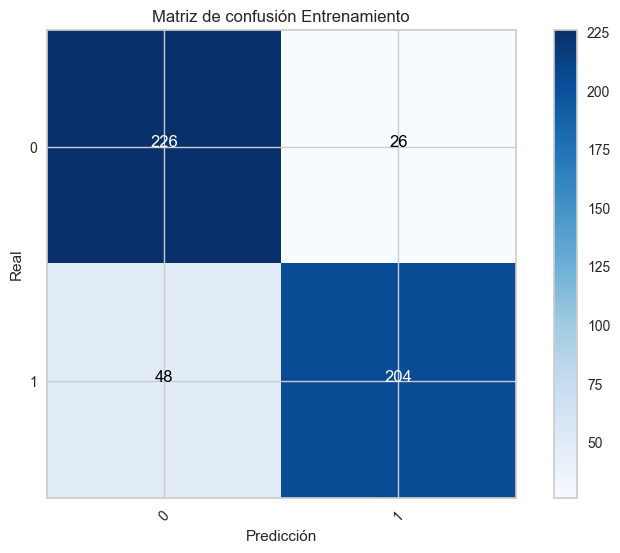

Reporte Prueba
              precision    recall  f1-score   support

           0       0.82      0.78      0.80       108
           1       0.79      0.83      0.81       108

    accuracy                           0.81       216
   macro avg       0.81      0.81      0.81       216
weighted avg       0.81      0.81      0.81       216



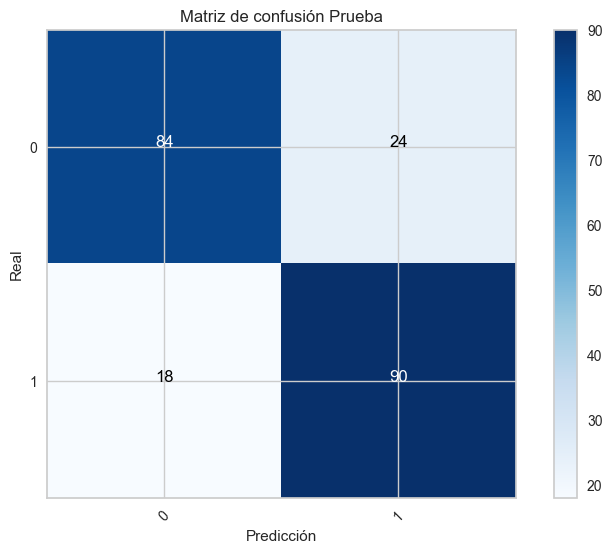

In [235]:
report_and_conf_matrix(DecisionTreeClassifier(random_state=1234,max_depth=5,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=1,
                                         splitter='random'),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

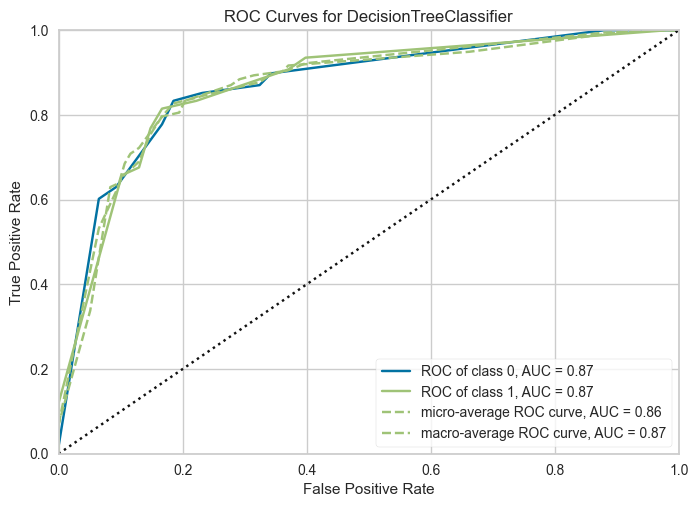

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=DecisionTreeClassifier(max_depth=5, max_leaf_nodes=10,
                                        random_state=1234, splitter='random'))

In [236]:
plot_ROC_curve(DecisionTreeClassifier(random_state=1234,max_depth=5,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=1,
                                         splitter='random'),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y con feature selection

In [237]:
# Tiempo aproximado: 2s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

X_t = SelectKBest(score_func=f_classif,k=22).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_t,y_train['rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [238]:
tuning_model.best_params_

{'max_depth': 7,
 'max_leaf_nodes': 20,
 'min_samples_leaf': 3,
 'splitter': 'random'}

In [239]:
# El mejor modelo de árbol de regresión sin PCA
# Con feature selection

pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                            DecisionTreeClassifier(random_state=1234,
                                                   max_depth=7,
                                                   max_leaf_nodes=20,
                                                   min_samples_leaf=3,
                                                   splitter='random'))

model,metrics = classification_metrics(pipeline_dt,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.871031746031746
Test Accuracy = 0.8009259259259259
Training Kappa = 0.7420634920634921
Test Kappa = 0.6018518518518519
Training Precision = [0.83 0.92]
Test Precision = [0.78 0.82]
Training recall = [0.93 0.81]
Test recall = [0.83 0.77]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.83      0.93      0.88       252
           1       0.92      0.81      0.86       252

    accuracy                           0.87       504
   macro avg       0.88      0.87      0.87       504
weighted avg       0.88      0.87      0.87       504



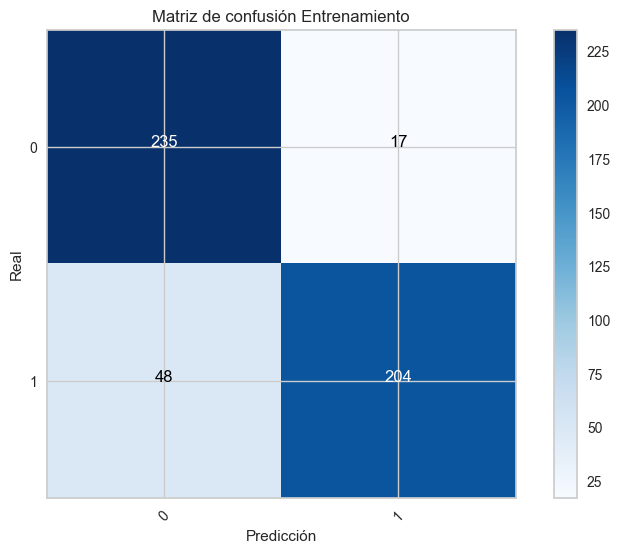

Reporte Prueba
              precision    recall  f1-score   support

           0       0.78      0.83      0.81       108
           1       0.82      0.77      0.79       108

    accuracy                           0.80       216
   macro avg       0.80      0.80      0.80       216
weighted avg       0.80      0.80      0.80       216



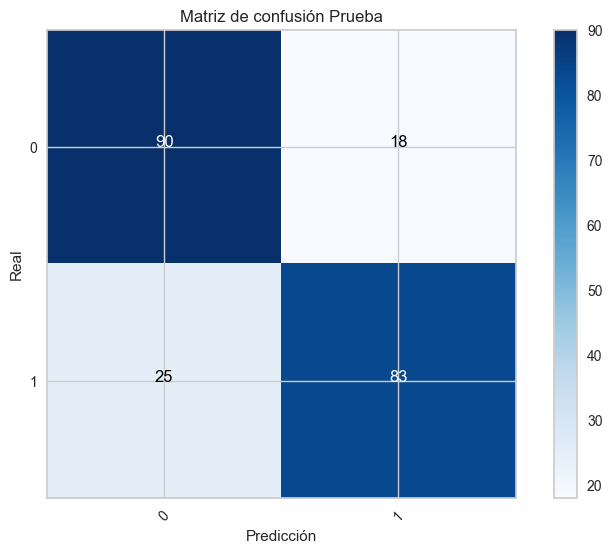

In [240]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=20,
                                         min_samples_leaf=3,
                                         splitter='random'))
report_and_conf_matrix(pipeline_dt,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

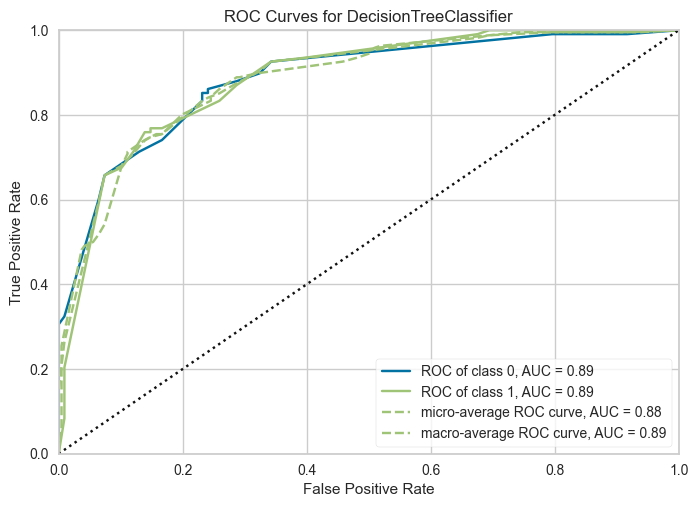

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=22)),
                                 ('decisiontreeclassifier',
                                  DecisionTreeClassifier(max_depth=7,
                                                         max_leaf_nodes=20,
                                                         min_samples_leaf=3,
                                                         random_state=1234,
                                                         splitter='random'))]))

In [241]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=20,
                                         min_samples_leaf=3,
                                         splitter='random'))
plot_ROC_curve(pipeline_dt,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con conjunto de datos con PCA

In [242]:
# Tiempo aproximado: 2s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),
                          param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [243]:
tuning_model.best_params_

{'max_depth': 5,
 'max_leaf_nodes': 10,
 'min_samples_leaf': 3,
 'splitter': 'best'}

In [244]:
# El mejor modelo de árbol de clasificación con PCA


tree_clsfr = DecisionTreeClassifier(random_state=1234,max_depth=5,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=3,
                                         splitter='best')

model,metrics = classification_metrics(tree_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.8591269841269841
Test Accuracy = 0.8287037037037037
Training Kappa = 0.7182539682539683
Test Kappa = 0.6574074074074074
Training Precision = [0.83 0.9 ]
Test Precision = [0.83 0.83]
Training recall = [0.9  0.81]
Test recall = [0.82 0.83]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.83      0.90      0.87       252
           1       0.90      0.81      0.85       252

    accuracy                           0.86       504
   macro avg       0.86      0.86      0.86       504
weighted avg       0.86      0.86      0.86       504



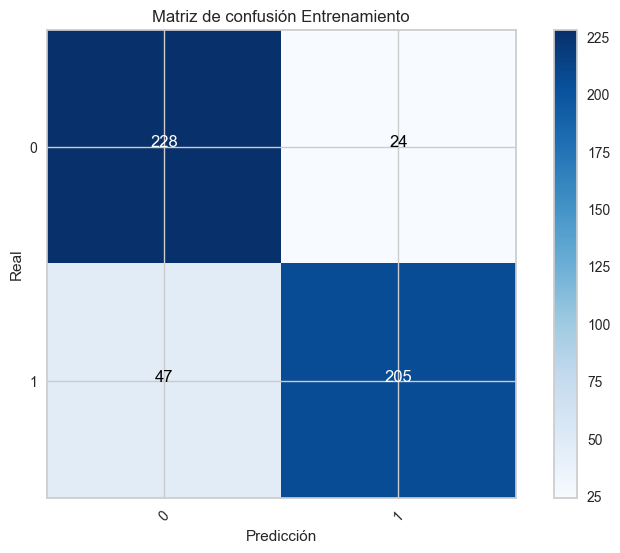

Reporte Prueba
              precision    recall  f1-score   support

           0       0.83      0.82      0.83       108
           1       0.83      0.83      0.83       108

    accuracy                           0.83       216
   macro avg       0.83      0.83      0.83       216
weighted avg       0.83      0.83      0.83       216



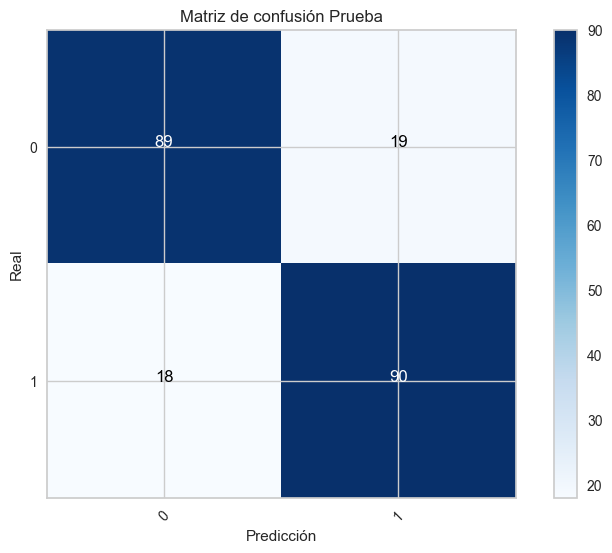

In [245]:
report_and_conf_matrix(DecisionTreeClassifier(random_state=1234,max_depth=5,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=3,
                                         splitter='best'),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

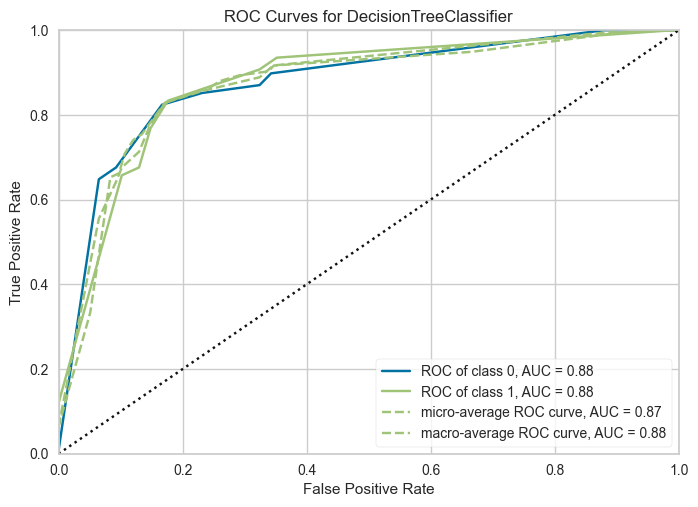

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=DecisionTreeClassifier(max_depth=5, max_leaf_nodes=10,
                                        min_samples_leaf=3, random_state=1234))

In [246]:
plot_ROC_curve(DecisionTreeClassifier(random_state=1234,max_depth=5,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=3,
                                         splitter='best'),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con conjunto de datos con PCA y feature selection

In [247]:
# Tiempo aproximado: 2s

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11],
           "min_samples_leaf":[1,2,3,4,],
           "max_leaf_nodes":[None,10,20,30] }

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(DecisionTreeClassifier(random_state=1234),param_grid=parameters,scoring=kappa_scorer,
                          cv=3,verbose=3)

tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 3 folds for each of 192 candidates, totalling 576 fits
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=best;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.524 total time=   0.0s
[CV 3/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=1, splitter=random;, score=0.571 total time=   0.0s
[CV 1/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.607 total time=   0.0s
[CV 2/3] END max_depth=1, max_leaf_nodes=None, min_samples_leaf=2, splitter=best;, score=0.524 total time=   0.0s
[CV 3/3] END max_de

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=1234),
             param_grid={'max_depth': [1, 3, 5, 7, 9, 11],
                         'max_leaf_nodes': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 3, 4],
                         'splitter': ['best', 'random']},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [248]:
tuning_model.best_params_

{'max_depth': 7,
 'max_leaf_nodes': 10,
 'min_samples_leaf': 4,
 'splitter': 'best'}

In [250]:
# El mejor modelo de árbol de regresión con PCA
# Con feature selection

pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=4,
                                         splitter='best'))

model,metrics = classification_metrics(pipeline_dt,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/DecissionTreeClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.8591269841269841
Test Accuracy = 0.8287037037037037
Training Kappa = 0.7182539682539683
Test Kappa = 0.6574074074074074
Training Precision = [0.83 0.9 ]
Test Precision = [0.83 0.83]
Training recall = [0.9  0.81]
Test recall = [0.82 0.83]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.83      0.90      0.87       252
           1       0.90      0.81      0.85       252

    accuracy                           0.86       504
   macro avg       0.86      0.86      0.86       504
weighted avg       0.86      0.86      0.86       504



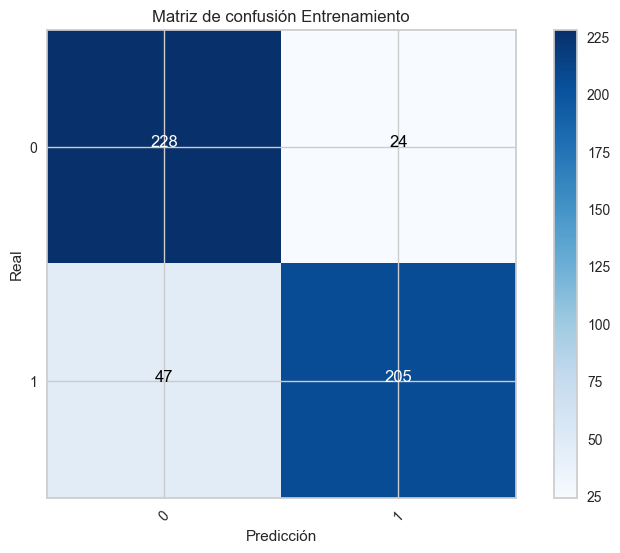

Reporte Prueba
              precision    recall  f1-score   support

           0       0.83      0.82      0.83       108
           1       0.83      0.83      0.83       108

    accuracy                           0.83       216
   macro avg       0.83      0.83      0.83       216
weighted avg       0.83      0.83      0.83       216



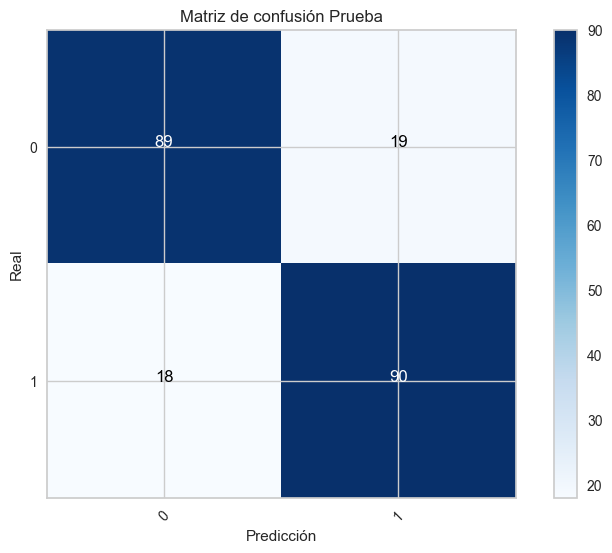

In [251]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=4,
                                         splitter='best'))
report_and_conf_matrix(pipeline_dt,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

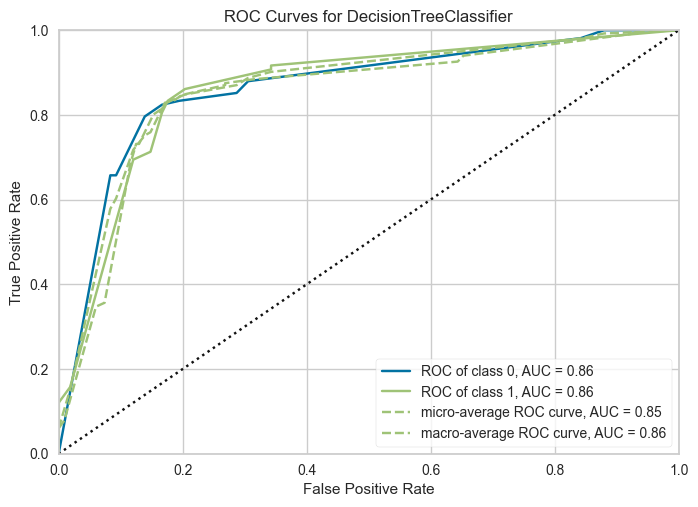

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for DecisionTreeClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('decisiontreeclassifier',
                                  DecisionTreeClassifier(max_depth=7,
                                                         max_leaf_nodes=10,
                                                         min_samples_leaf=4,
                                                         random_state=1234))]))

In [252]:
pipeline_dt = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                            DecisionTreeClassifier(random_state=1234,max_depth=7,
                                         max_leaf_nodes=10,
                                         min_samples_leaf=4,
                                         splitter='best'))
plot_ROC_curve(pipeline_dt,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.6. Modelo de Random Forest

Conjunto de datos sin PCA

In [253]:

from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=1234)

classification_metrics(rf,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

rf.fit(X_train['rem'],y_train['rem'])
print(rf.get_params())

Training Accuracy = 1.0
Test Accuracy = 0.8333333333333334
Training Kappa = 1.0
Test Kappa = 0.6666666666666667
Training Precision = [1. 1.]
Test Precision = [0.85 0.82]
Training recall = [1. 1.]
Test recall = [0.81 0.85]
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'monotonic_cst': None, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 1234, 'verbose': 0, 'warm_start': False}


In [254]:
# Tiempo aproximado: 44s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.664 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.703 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.723 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.603 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.800 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.644 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.683 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.7

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [255]:
tuning_model.best_params_

{'max_depth': 10,
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 100}

In [256]:
# El mejor modelo de Random Forest
# Sin PCA


rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=2,
                                         min_samples_split=5,
                                         n_estimators=100)

model,metrics = classification_metrics(rf_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.9265873015873016
Test Accuracy = 0.8333333333333334
Training Kappa = 0.8531746031746031
Test Kappa = 0.6666666666666667
Training Precision = [0.9  0.95]
Test Precision = [0.87 0.81]
Training recall = [0.96 0.9 ]
Test recall = [0.79 0.88]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       252
           1       0.95      0.90      0.92       252

    accuracy                           0.93       504
   macro avg       0.93      0.93      0.93       504
weighted avg       0.93      0.93      0.93       504



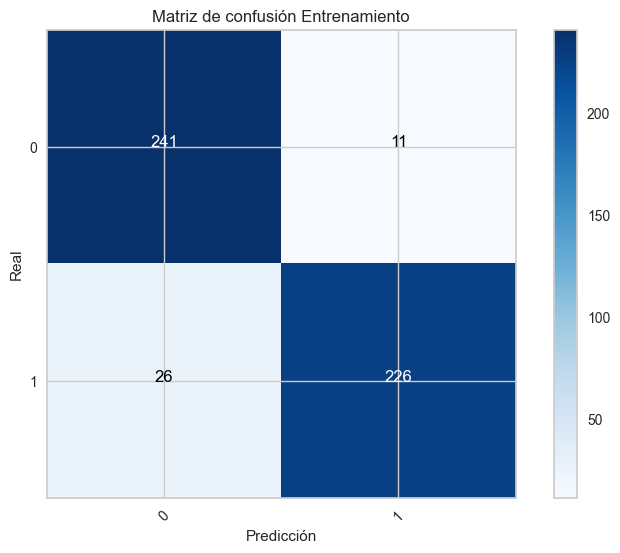

Reporte Prueba
              precision    recall  f1-score   support

           0       0.87      0.79      0.83       108
           1       0.81      0.88      0.84       108

    accuracy                           0.83       216
   macro avg       0.84      0.83      0.83       216
weighted avg       0.84      0.83      0.83       216



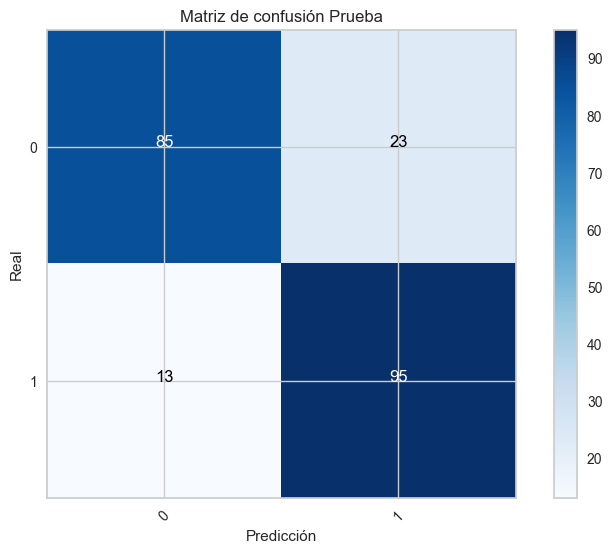

In [257]:
report_and_conf_matrix(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=2,
                                         min_samples_split=5,
                                         n_estimators=100),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

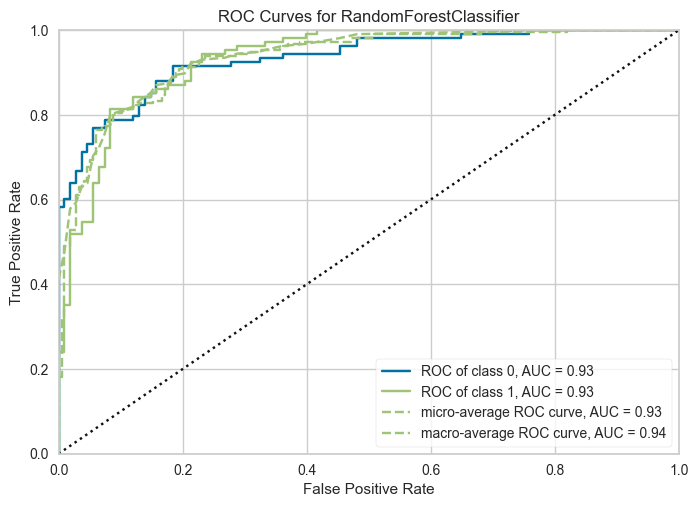

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=RandomForestClassifier(max_depth=10, min_samples_leaf=2,
                                        min_samples_split=5,
                                        random_state=1234))

In [258]:
plot_ROC_curve(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=2,
                                         min_samples_split=5,
                                         n_estimators=100),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Modelo sin PCA pero con feature selection

In [259]:
# Tiempo aproximado: 39s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

X_t = SelectKBest(score_func=f_classif,k=22).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.684 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.664 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.723 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.623 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.760 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.664 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.664 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.7

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [260]:
tuning_model.best_params_

{'max_depth': 10,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [261]:
# El mejor modelo de random forest sin PCA
# Con feature selection

rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=100)

X_t = SelectKBest(score_func=f_classif,k=22).fit_transform(X_train['rem'],y_train['rem'])

model,metrics = classification_metrics(rf_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.9781746031746031
Test Accuracy = 0.8425925925925926
Training Kappa = 0.9563492063492064
Test Kappa = 0.6851851851851851
Training Precision = [0.97 0.99]
Test Precision = [0.86 0.82]
Training recall = [0.99 0.96]
Test recall = [0.81 0.87]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       252
           1       1.00      0.96      0.98       252

    accuracy                           0.98       504
   macro avg       0.98      0.98      0.98       504
weighted avg       0.98      0.98      0.98       504



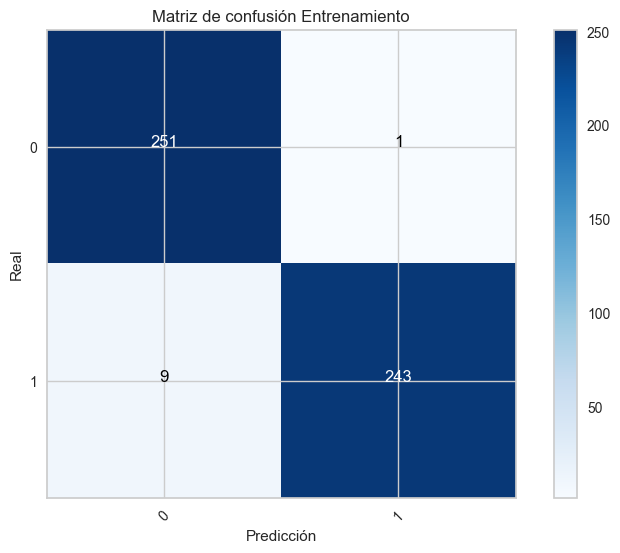

Reporte Prueba
              precision    recall  f1-score   support

           0       0.87      0.82      0.85       108
           1       0.83      0.88      0.86       108

    accuracy                           0.85       216
   macro avg       0.85      0.85      0.85       216
weighted avg       0.85      0.85      0.85       216



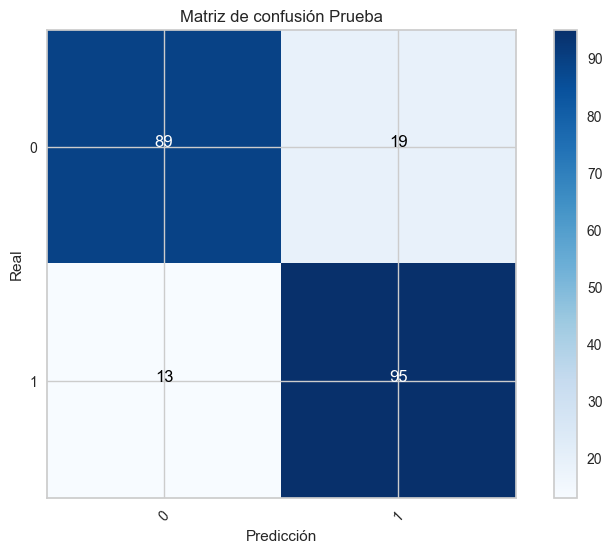

In [262]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                          RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=100))
report_and_conf_matrix(pipeline_rf,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

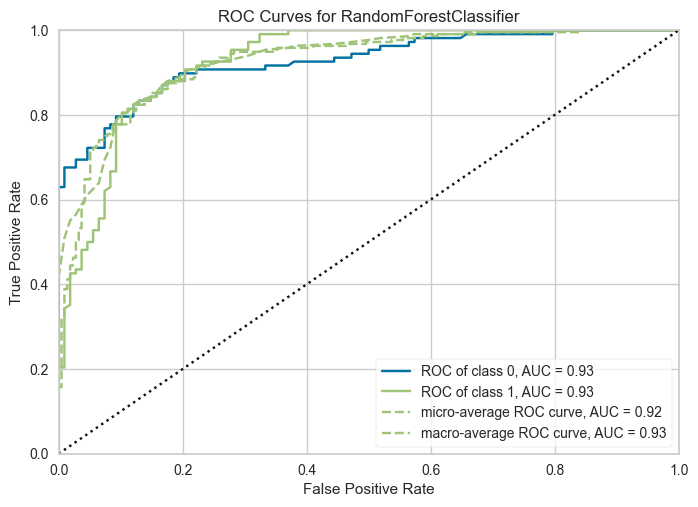

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=22)),
                                 ('randomforestclassifier',
                                  RandomForestClassifier(max_depth=10,
                                                         random_state=1234))]))

In [263]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                          RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=1,
                                         min_samples_split=2,
                                         n_estimators=100))
plot_ROC_curve(pipeline_rf,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con conjunto de datos con PCA

In [264]:
# Tiempo aproximado: 45s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.644 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.644 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.703 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.623 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.740 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.644 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.683 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.7

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [265]:
tuning_model.best_params_

{'max_depth': 10,
 'min_samples_leaf': 3,
 'min_samples_split': 2,
 'n_estimators': 400}

In [266]:
# El mejor modelo de Random Forest
# Con PCA


rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=3,
                                         min_samples_split=2,
                                         n_estimators=400)

model,metrics = classification_metrics(rf_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.9226190476190477
Test Accuracy = 0.8518518518518519
Training Kappa = 0.8452380952380952
Test Kappa = 0.7037037037037037
Training Precision = [0.9  0.94]
Test Precision = [0.88 0.83]
Training recall = [0.94 0.9 ]
Test recall = [0.81 0.89]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       252
           1       0.94      0.90      0.92       252

    accuracy                           0.92       504
   macro avg       0.92      0.92      0.92       504
weighted avg       0.92      0.92      0.92       504



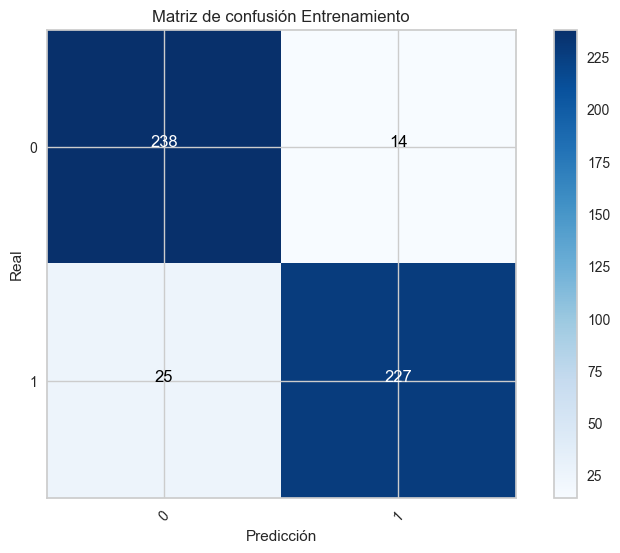

Reporte Prueba
              precision    recall  f1-score   support

           0       0.88      0.81      0.85       108
           1       0.83      0.89      0.86       108

    accuracy                           0.85       216
   macro avg       0.85      0.85      0.85       216
weighted avg       0.85      0.85      0.85       216



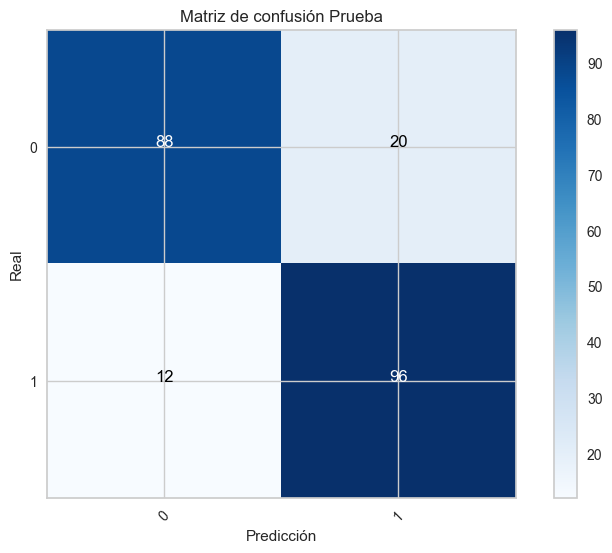

In [267]:
report_and_conf_matrix(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=3,
                                         min_samples_split=2,
                                         n_estimators=400),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

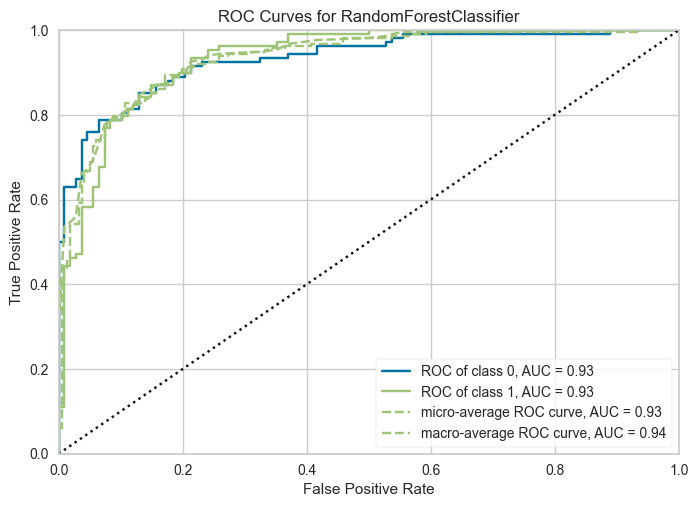

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=RandomForestClassifier(max_depth=10, min_samples_leaf=3,
                                        n_estimators=400, random_state=1234))

In [268]:
plot_ROC_curve(RandomForestClassifier(random_state=1234,max_depth=10,
                                         min_samples_leaf=3,
                                         min_samples_split=2,
                                         n_estimators=400),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con PCA y feature selection

In [269]:
# Tiempo aproximado: 52s

params = {'max_depth': [None, 10, 20],
          'min_samples_leaf': [1, 2, 3],
          'min_samples_split': [2, 5],
          'n_estimators': [100, 200, 400]}

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(RandomForestClassifier(random_state=1234),param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)

tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.664 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.684 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.723 total time=   0.0s
[CV 4/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.643 total time=   0.0s
[CV 5/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100;, score=0.740 total time=   0.0s
[CV 1/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.644 total time=   0.0s
[CV 2/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.703 total time=   0.0s
[CV 3/5] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200;, score=0.7

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200, 400]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [270]:
tuning_model.best_params_

{'max_depth': None,
 'min_samples_leaf': 3,
 'min_samples_split': 2,
 'n_estimators': 100}

In [274]:
# El mejor modelo de random forest con PCA
# Con feature selection

rf_clsfr = RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=3,
                                         min_samples_split=2,
                                         n_estimators=100)

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

model,metrics = classification_metrics(rf_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/RandomForestClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.9206349206349206
Test Accuracy = 0.8472222222222222
Training Kappa = 0.8412698412698413
Test Kappa = 0.6944444444444444
Training Precision = [0.9  0.94]
Test Precision = [0.87 0.83]
Training recall = [0.94 0.9 ]
Test recall = [0.81 0.88]


Profe pregunta aquí por error cuando guardabamos el modelo.. en min_samples_leaf= escogimos 2 y no 3 por dedazo y nos daba mejor accuracy para el test... al final lo dejamos tal cual lo dice best_params_ no entendemos porque???

Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       252
           1       0.93      0.89      0.91       252

    accuracy                           0.91       504
   macro avg       0.92      0.91      0.91       504
weighted avg       0.92      0.91      0.91       504



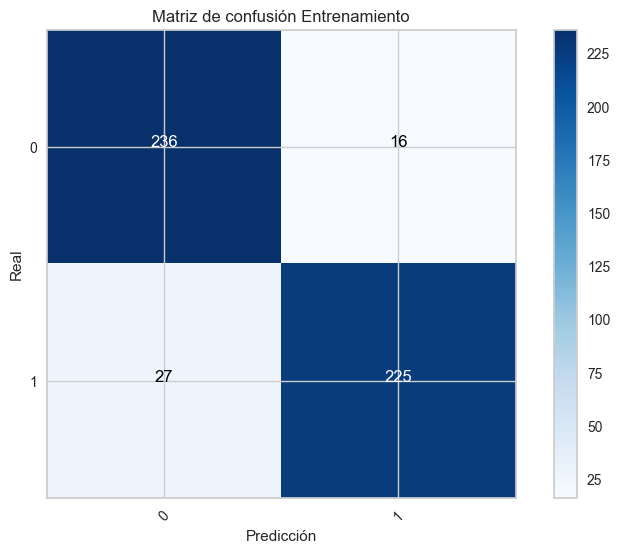

Reporte Prueba
              precision    recall  f1-score   support

           0       0.90      0.81      0.85       108
           1       0.82      0.91      0.86       108

    accuracy                           0.86       216
   macro avg       0.86      0.86      0.86       216
weighted avg       0.86      0.86      0.86       216



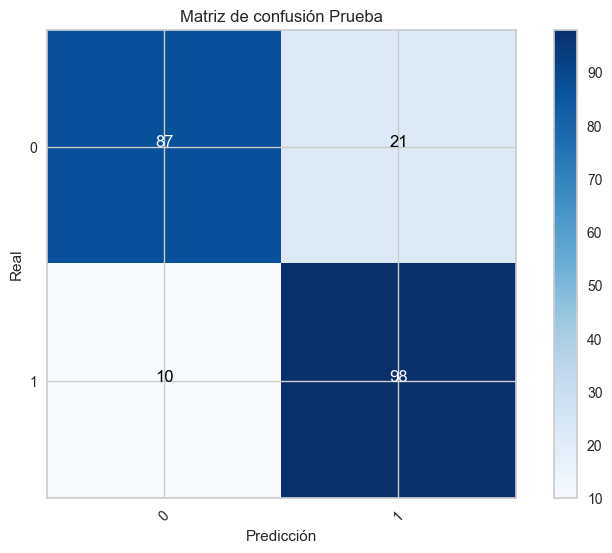

In [275]:
pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                          RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=3,
                                         min_samples_split=2,
                                         n_estimators=100))
report_and_conf_matrix(pipeline_rf,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

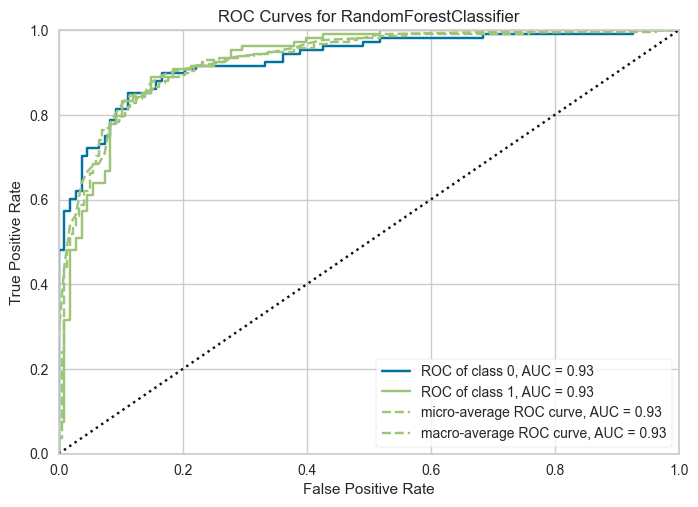

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for RandomForestClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('randomforestclassifier',
                                  RandomForestClassifier(min_samples_leaf=3,
                                                         random_state=1234))]))

In [276]:

pipeline_rf = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                          RandomForestClassifier(random_state=1234,max_depth=None,
                                         min_samples_leaf=3,
                                         min_samples_split=2,
                                         n_estimators=100))
plot_ROC_curve(pipeline_rf,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'], X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.7. Modelo de Gradient Boosting

Modelo con datos sin PCA

In [277]:

from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=1234)

classification_metrics(gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

gb.fit(X_train['rem'],y_train['rem'])
print(gb.get_params())

Training Accuracy = 0.9503968253968254
Test Accuracy = 0.8611111111111112
Training Kappa = 0.9007936507936508
Test Kappa = 0.7222222222222222
Training Precision = [0.94 0.96]
Test Precision = [0.88 0.84]
Training recall = [0.96 0.94]
Test recall = [0.83 0.89]
{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1234, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [278]:
#Tiempo aproximado: 2.88m
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, cohen_kappa_score

kappa_scorer = make_scorer(cohen_kappa_score)



params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.604 total time=   0.3s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.703 total time=   0.3s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.703 total time=   0.3s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.603 total time=   0.3s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.780 total time=   0.3s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.604 total time=   0.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.644 total time=   0.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.743 total time=   0.2s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [280]:
tuning_model.best_params_

{'learning_rate': 0.01, 'max_depth': 8, 'n_estimators': 500, 'subsample': 0.2}

In [281]:
# El mejor modelo de Gradient Boosting
# Sin PCA
import pickle 

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=8, n_estimators=500,subsample=0.2)

model,metrics = classification_metrics(gb_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.9523809523809523
Test Accuracy = 0.8564814814814815
Training Kappa = 0.9047619047619048
Test Kappa = 0.712962962962963
Training Precision = [0.94 0.97]
Test Precision = [0.91 0.81]
Training recall = [0.97 0.94]
Test recall = [0.79 0.93]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.94      0.97      0.95       252
           1       0.97      0.94      0.95       252

    accuracy                           0.95       504
   macro avg       0.95      0.95      0.95       504
weighted avg       0.95      0.95      0.95       504



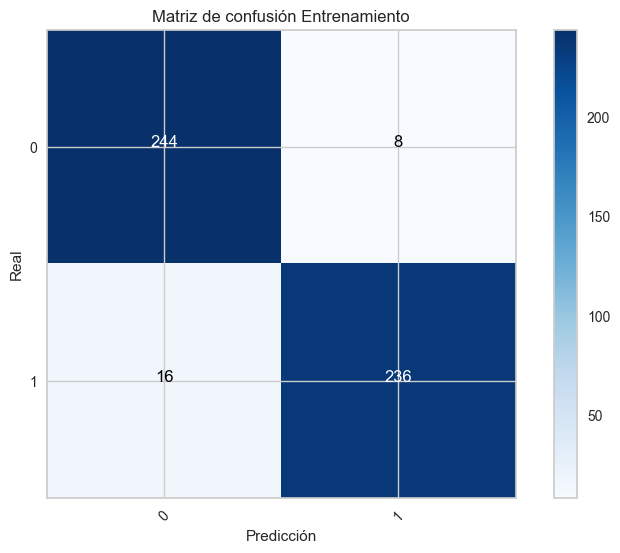

Reporte Prueba
              precision    recall  f1-score   support

           0       0.91      0.79      0.85       108
           1       0.81      0.93      0.87       108

    accuracy                           0.86       216
   macro avg       0.86      0.86      0.86       216
weighted avg       0.86      0.86      0.86       216



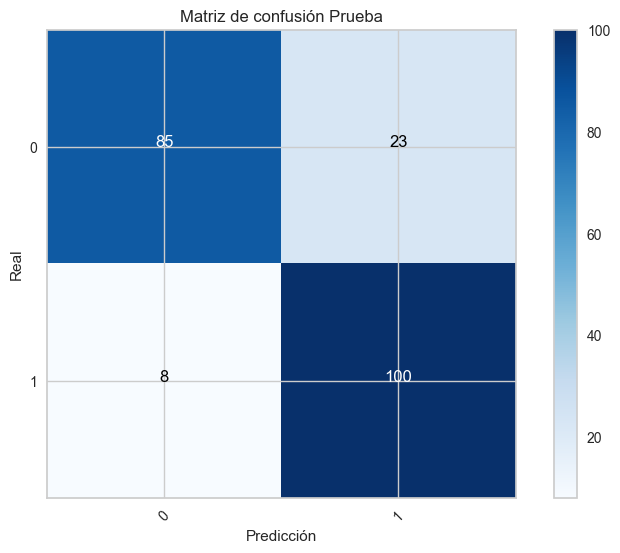

In [282]:
report_and_conf_matrix(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=8, n_estimators=500,subsample=0.2),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

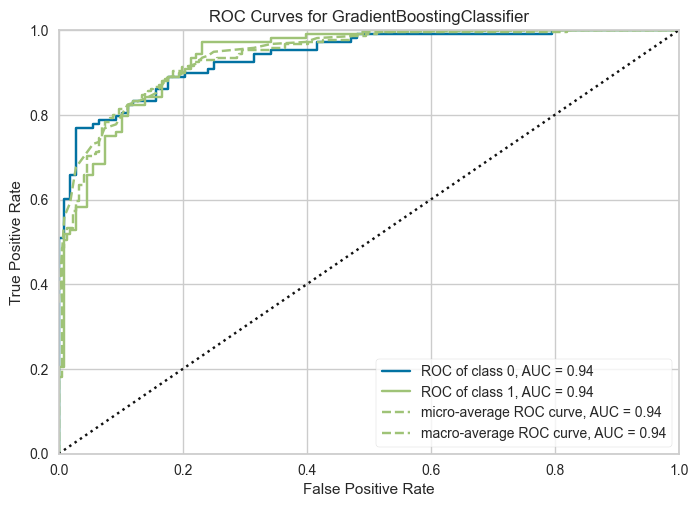

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=8,
                                            n_estimators=500, random_state=1234,
                                            subsample=0.2))

In [283]:
plot_ROC_curve(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=8, n_estimators=500,subsample=0.2),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y con feature selection

In [284]:
#Tiempo aproximado: 2.11m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

X_t = SelectKBest(score_func=f_classif,k=22).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.644 total time=   0.3s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.703 total time=   0.3s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.703 total time=   0.3s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.623 total time=   0.3s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.800 total time=   0.3s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.664 total time=   0.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.644 total time=   0.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.723 total time=   0.2s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [285]:
tuning_model.best_params_

{'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 500, 'subsample': 0.2}

In [286]:
# El mejor modelo de Gradient Boosting sin PCA
# Con feature selection


pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=500,subsample=0.2))

model,metrics = classification_metrics(pipeline_gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.9424603174603174
Test Accuracy = 0.8564814814814815
Training Kappa = 0.8849206349206349
Test Kappa = 0.712962962962963
Training Precision = [0.92 0.97]
Test Precision = [0.9  0.82]
Training recall = [0.97 0.92]
Test recall = [0.81 0.91]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.92      0.97      0.94       252
           1       0.97      0.92      0.94       252

    accuracy                           0.94       504
   macro avg       0.94      0.94      0.94       504
weighted avg       0.94      0.94      0.94       504



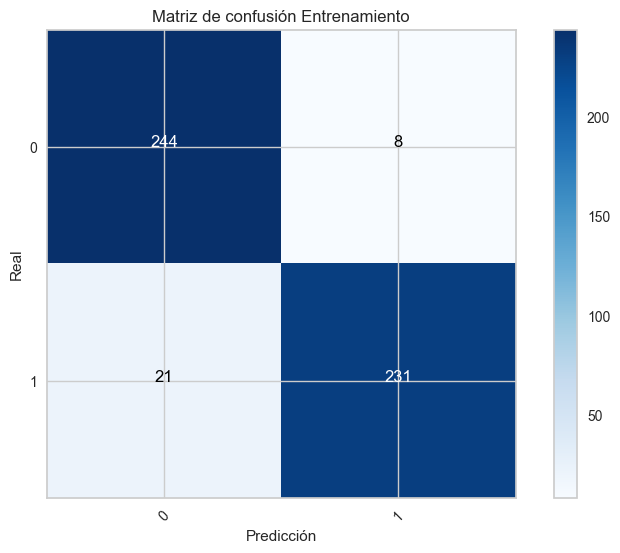

Reporte Prueba
              precision    recall  f1-score   support

           0       0.90      0.81      0.85       108
           1       0.82      0.91      0.86       108

    accuracy                           0.86       216
   macro avg       0.86      0.86      0.86       216
weighted avg       0.86      0.86      0.86       216



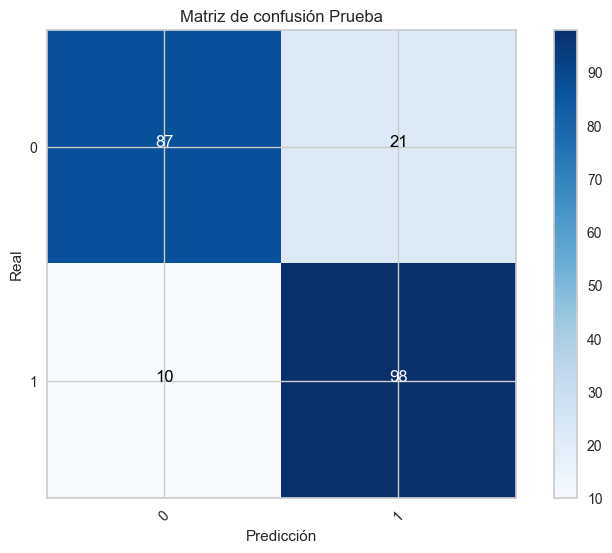

In [287]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=500,subsample=0.2))
report_and_conf_matrix(pipeline_gb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

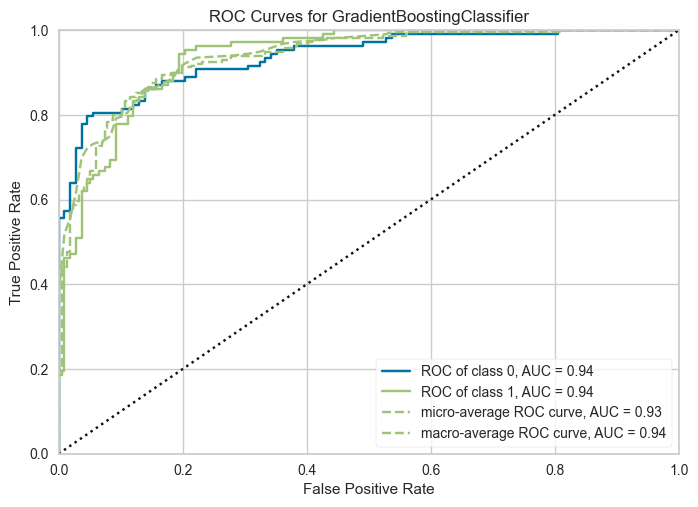

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=22)),
                                 ('gradientboostingclassifier',
                                  GradientBoostingClassifier(learning_rate=0.01,
                                                             max_depth=6,
                                                             n_estimators=500,
                                                             random_state=1234,
                                                             subsample=0.2))]))

In [288]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=500,subsample=0.2))
plot_ROC_curve(pipeline_gb,X_train=X_train['rem'], y_train=y_train['rem'], X_test=X_test['rem'], y_test=y_test['rem'])

Modelo con PCA

In [289]:
#Tiempo aproximado: 1.49m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.703 total time=   0.3s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.624 total time=   0.3s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.664 total time=   0.3s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.643 total time=   0.3s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.720 total time=   0.3s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.624 total time=   0.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.604 total time=   0.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.684 total time=   0.2s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [290]:
tuning_model.best_params_

{'learning_rate': 0.01, 'max_depth': 4, 'n_estimators': 1000, 'subsample': 0.2}

In [291]:
# El mejor modelo de Gradient Boosting
# Con PCA
 

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=4, n_estimators=1000,subsample=0.2)

model,metrics = classification_metrics(gb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.9642857142857143
Test Accuracy = 0.8611111111111112
Training Kappa = 0.9285714285714286
Test Kappa = 0.7222222222222222
Training Precision = [0.95 0.98]
Test Precision = [0.89 0.84]
Training recall = [0.98 0.95]
Test recall = [0.82 0.9 ]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       252
           1       0.98      0.95      0.96       252

    accuracy                           0.96       504
   macro avg       0.96      0.96      0.96       504
weighted avg       0.96      0.96      0.96       504



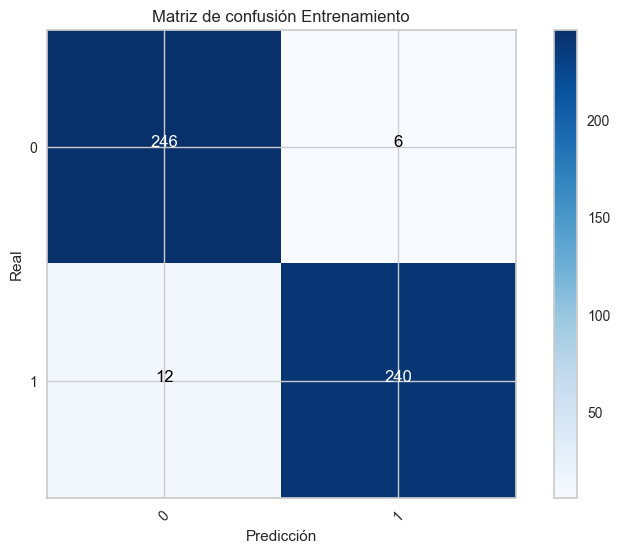

Reporte Prueba
              precision    recall  f1-score   support

           0       0.89      0.82      0.86       108
           1       0.84      0.90      0.87       108

    accuracy                           0.86       216
   macro avg       0.86      0.86      0.86       216
weighted avg       0.86      0.86      0.86       216



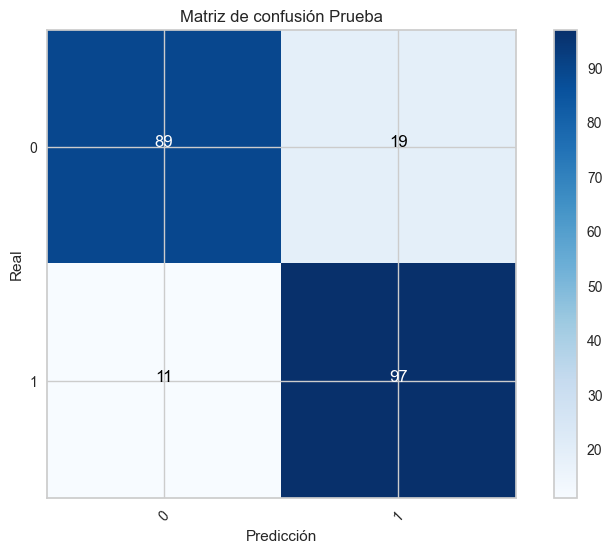

In [292]:
report_and_conf_matrix(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=4, n_estimators=1000,subsample=0.2),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

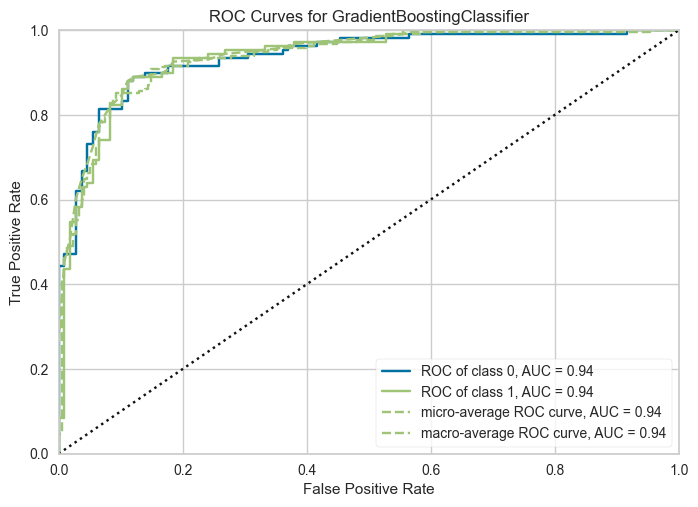

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=4,
                                            n_estimators=1000,
                                            random_state=1234, subsample=0.2))

In [293]:
plot_ROC_curve(GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=4, n_estimators=1000,subsample=0.2),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Modelo con PCA y feature selection

In [294]:
#Tiempo aproximado: 1.4m

params = {'learning_rate': [0.01,0.03],
                  'subsample'    : [0.5, 0.2],
                  'n_estimators' : [500,1000],
                  'max_depth'    : [4,6,8]    
            }

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(GradientBoostingClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.664 total time=   0.4s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.604 total time=   0.3s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.644 total time=   0.3s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.723 total time=   0.4s
[CV 5/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.5;, score=0.720 total time=   0.3s
[CV 1/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.644 total time=   0.2s
[CV 2/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.624 total time=   0.2s
[CV 3/5] END learning_rate=0.01, max_depth=4, n_estimators=500, subsample=0.2;, score=0.723 total time=   0.2s
[CV 4/5] END learning_rate=0.01, max_depth=4, n_es

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=1234),
             param_grid={'learning_rate': [0.01, 0.03], 'max_depth': [4, 6, 8],
                         'n_estimators': [500, 1000], 'subsample': [0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [295]:
tuning_model.best_params_

{'learning_rate': 0.01, 'max_depth': 6, 'n_estimators': 500, 'subsample': 0.2}

In [296]:
# El mejor modelo de Gradient Boosting
# Con PCA y feature selection
 
X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

gb_clsfr = GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=500,subsample=0.2)

model,metrics = classification_metrics(gb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/GradientBoostingClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.9464285714285714
Test Accuracy = 0.8611111111111112
Training Kappa = 0.8928571428571429
Test Kappa = 0.7222222222222222
Training Precision = [0.93 0.96]
Test Precision = [0.88 0.84]
Training recall = [0.96 0.93]
Test recall = [0.83 0.89]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       252
           1       0.96      0.92      0.94       252

    accuracy                           0.94       504
   macro avg       0.94      0.94      0.94       504
weighted avg       0.94      0.94      0.94       504



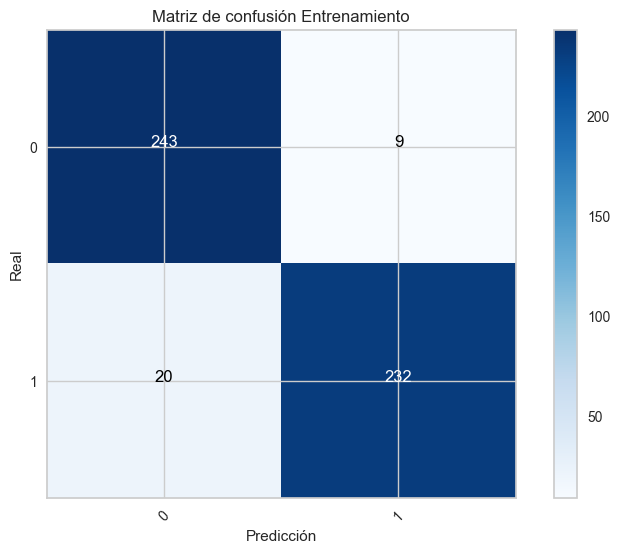

Reporte Prueba
              precision    recall  f1-score   support

           0       0.88      0.84      0.86       108
           1       0.85      0.89      0.87       108

    accuracy                           0.87       216
   macro avg       0.87      0.87      0.87       216
weighted avg       0.87      0.87      0.87       216



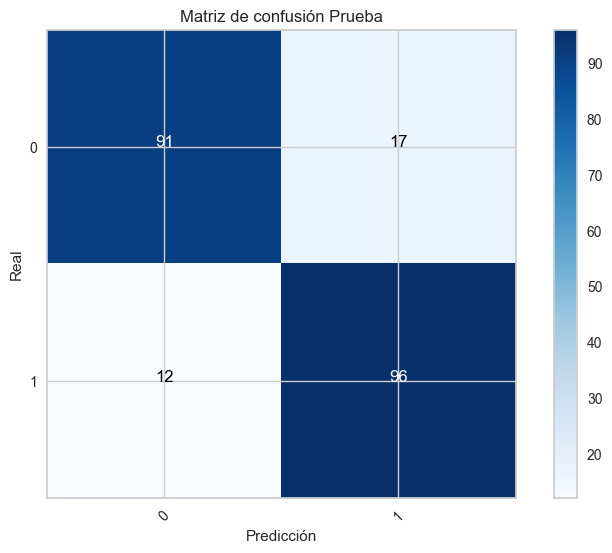

In [297]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=500,subsample=0.2))
report_and_conf_matrix(pipeline_gb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

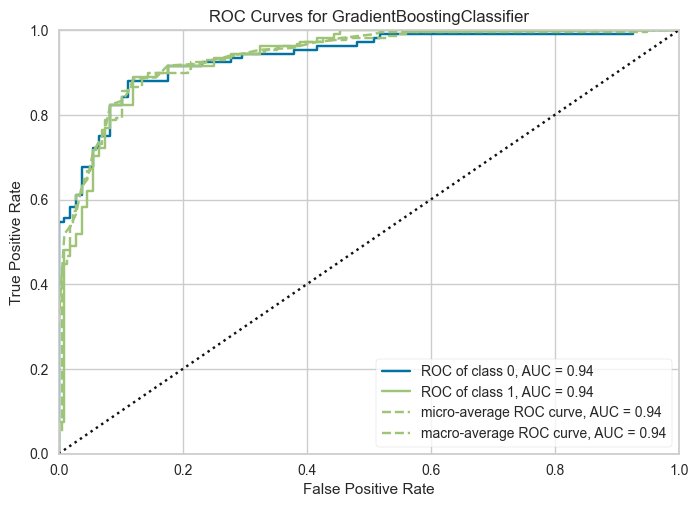

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for GradientBoostingClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       classes=[0, 1],
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('gradientboostingclassifier',
                                  GradientBoostingClassifier(learning_rate=0.01,
                                                             max_depth=6,
                                                             n_estimators=500,
                                                             random_state=1234,
                                                             subsample=0.2))]))

In [298]:
pipeline_gb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                           GradientBoostingClassifier(random_state=1234,learning_rate=0.01, 
                                      max_depth=6, n_estimators=500,subsample=0.2))
plot_ROC_curve(pipeline_gb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 7.8. Modelo de XGBoost

In [299]:
y_train['rem']['target'].unique()

array(['1', '0'], dtype=object)

Conjunto de datos sin PCA

In [300]:
# Tiempo aproximado: 1.39m

import xgboost as xgb

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train['rem'] = le.fit_transform(y_train['rem'])
y_test['rem'] = le.transform(y_test['rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['rem'],y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.545 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.664 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.703 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.663 total time=   0.0s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.800 total time=   0.0s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.624 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.624 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.683 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [301]:
tuning_model.best_params_

{'learning_rate': 0.03,
 'max_depth': None,
 'n_estimators': 500,
 'subsample': 0.2}

In [302]:
xgb_clsfr = xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.2)

model,metrics = classification_metrics(xgb_clsfr,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierRem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemMetrics.pkl','wb'))

Training Accuracy = 0.9166666666666666
Test Accuracy = 0.8564814814814815
Training Kappa = 0.8333333333333334
Test Kappa = 0.712962962962963
Training Precision = [0.91 0.92]
Test Precision = [0.91 0.82]
Training recall = [0.92 0.91]
Test recall = [0.8  0.92]


In [303]:
def plot_ROC_curve_xgb(model, X_train, y_train, X_test, y_test):
    visualizer = ROCAUC(model, encoder={0: 'neutral riesgo 0',
                                        1: 'riesgo 1'})                                    
    visualizer.fit(X_train, y_train)
    visualizer.score(X_test, y_test)
    visualizer.show()
    
    return visualizer

In [304]:
tuning_model.best_params_

{'learning_rate': 0.03,
 'max_depth': None,
 'n_estimators': 500,
 'subsample': 0.2}

Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.91      0.92      0.92       252
           1       0.92      0.91      0.92       252

    accuracy                           0.92       504
   macro avg       0.92      0.92      0.92       504
weighted avg       0.92      0.92      0.92       504



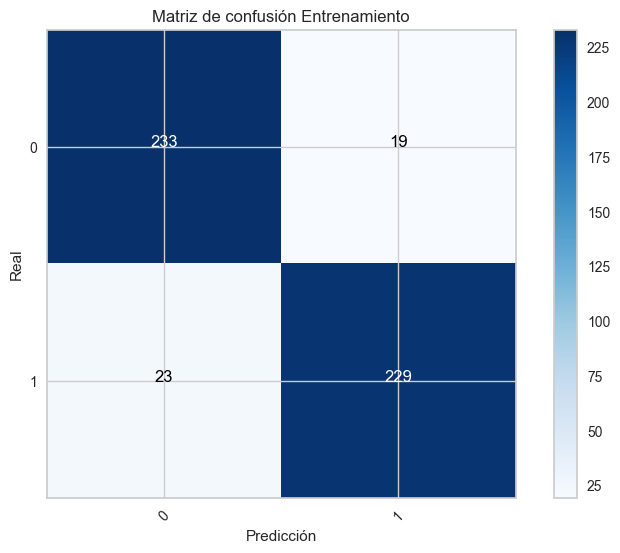

Reporte Prueba
              precision    recall  f1-score   support

           0       0.91      0.80      0.85       108
           1       0.82      0.92      0.86       108

    accuracy                           0.86       216
   macro avg       0.86      0.86      0.86       216
weighted avg       0.86      0.86      0.86       216



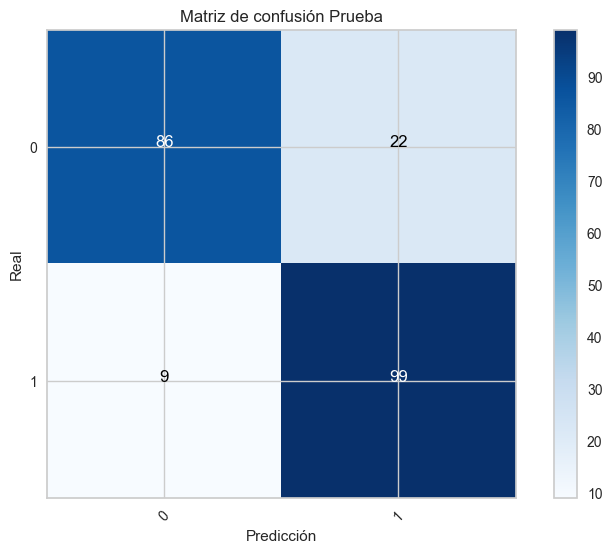

In [305]:
report_and_conf_matrix(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.2),
                       X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

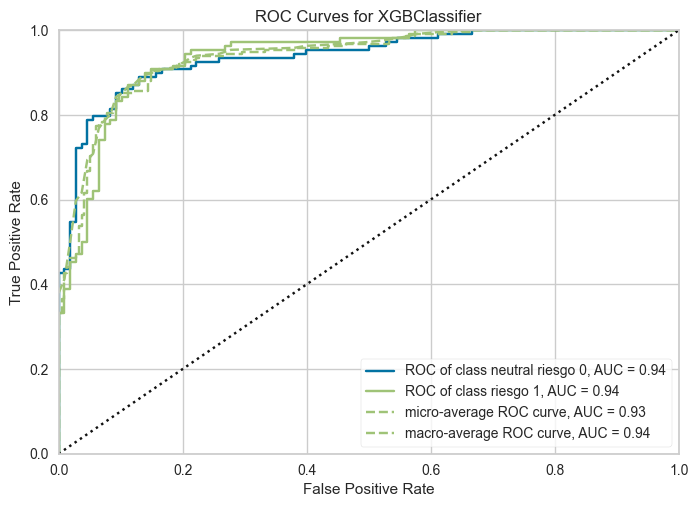

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1'},
       estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=F...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.03,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=500, n_jobs=None,
                               num_parallel_tree=None, random_state=1234, ...))

In [306]:
plot_ROC_curve_xgb(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.2),
                X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos sin PCA y feature selection

In [307]:
# Tiempo aproximado: 57s
le = LabelEncoder()
y_train['rem'] = le.fit_transform(y_train['rem'])
y_test['rem'] = le.transform(y_test['rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

X_t = SelectKBest(score_func=f_classif,k=22).fit_transform(X_train['rem'],y_train['rem'])

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.585 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.703 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.703 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.663 total time=   0.0s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.740 total time=   0.0s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.664 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.644 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.683 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [309]:
tuning_model.best_params_

{'learning_rate': 0.03,
 'max_depth': None,
 'n_estimators': 500,
 'subsample': 0.5}

In [310]:

pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.5))

model,metrics = classification_metrics(pipeline_xgb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierRemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemFSMetrics.pkl','wb'))

Training Accuracy = 0.9781746031746031
Test Accuracy = 0.8472222222222222
Training Kappa = 0.9563492063492064
Test Kappa = 0.6944444444444444
Training Precision = [0.98 0.98]
Test Precision = [0.89 0.81]
Training recall = [0.98 0.98]
Test recall = [0.79 0.91]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       252
           1       0.98      0.98      0.98       252

    accuracy                           0.98       504
   macro avg       0.98      0.98      0.98       504
weighted avg       0.98      0.98      0.98       504



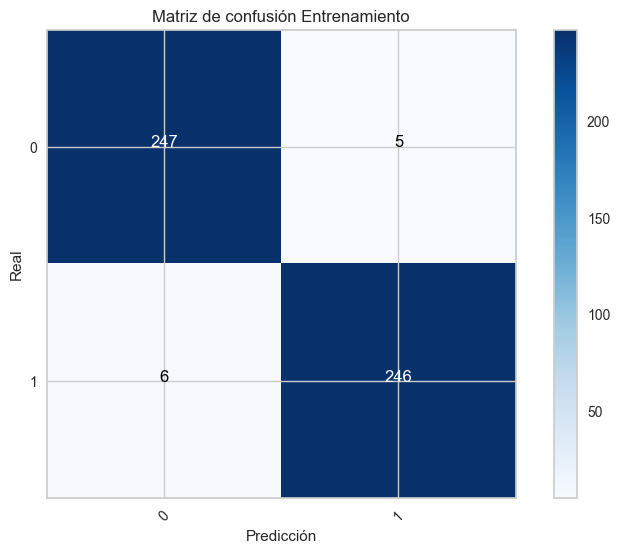

Reporte Prueba
              precision    recall  f1-score   support

           0       0.89      0.79      0.84       108
           1       0.81      0.91      0.86       108

    accuracy                           0.85       216
   macro avg       0.85      0.85      0.85       216
weighted avg       0.85      0.85      0.85       216



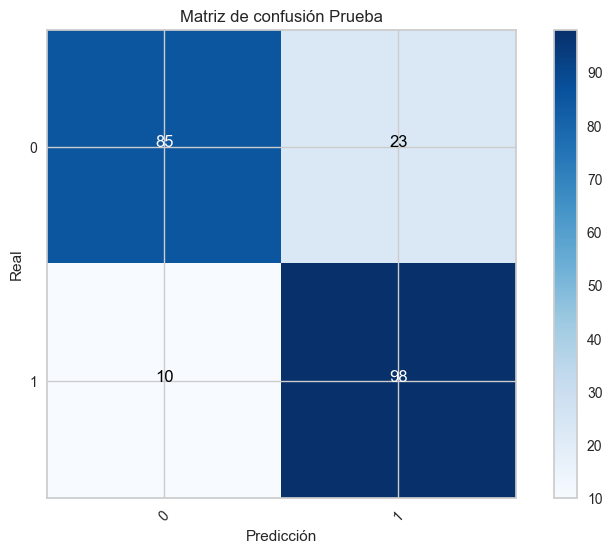

In [311]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.5))

report_and_conf_matrix(pipeline_xgb,X_train['rem'],X_test['rem'],y_train['rem'],y_test['rem'])

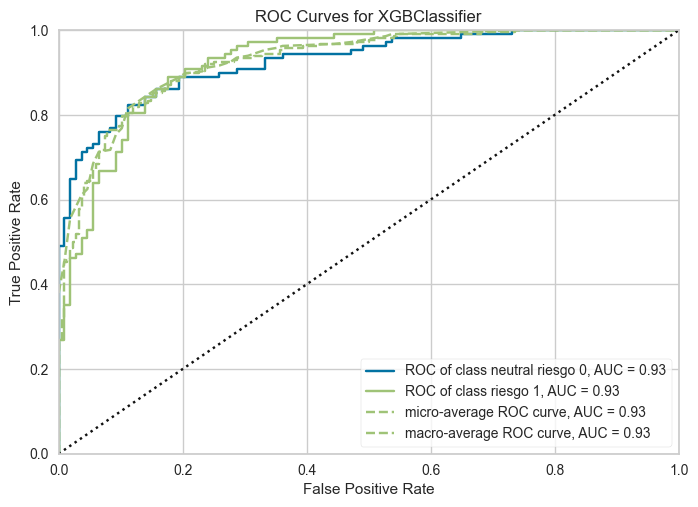

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=22)),
                                 ('xgbclassifier',
                                  XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytr...
                                                grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.03,
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=None, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=500, n_jobs=None,
                                                num_parallel_tree=None,
                                                random_state=1234, ...))]))

In [312]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=22),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=None,
                               n_estimators=500,
                               subsample=0.5))

plot_ROC_curve_xgb(pipeline_xgb,X_train=X_train['rem'], y_train=y_train['rem'],X_test=X_test['rem'], y_test=y_test['rem'])

Conjunto de datos con PCA

In [313]:
# Tiempo aproximado: 1.10m

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_train['pca_rem'] = le.fit_transform(y_train['pca_rem'])
y_test['pca_rem'] = le.transform(y_test['pca_rem'])

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_train['pca_rem'],y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.782 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.644 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.683 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.603 total time=   0.0s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.680 total time=   0.0s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.644 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.624 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.644 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [314]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 100, 'subsample': 1}

In [315]:
xgb_clsfr = xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=100,
                               subsample=1)

model,metrics = classification_metrics(xgb_clsfr,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierPCARem.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemMetrics.pkl','wb'))

Training Accuracy = 0.9563492063492064
Test Accuracy = 0.8379629629629629
Training Kappa = 0.9126984126984127
Test Kappa = 0.6759259259259259
Training Precision = [0.94 0.98]
Test Precision = [0.88 0.81]
Training recall = [0.98 0.94]
Test recall = [0.79 0.89]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       252
           1       0.98      0.94      0.96       252

    accuracy                           0.96       504
   macro avg       0.96      0.96      0.96       504
weighted avg       0.96      0.96      0.96       504



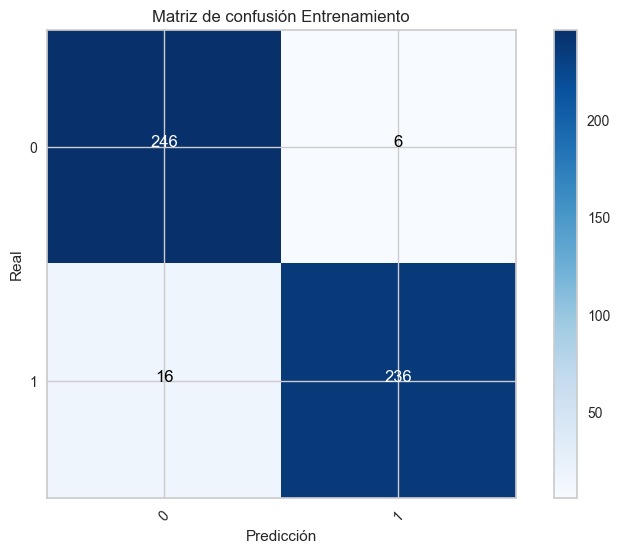

Reporte Prueba
              precision    recall  f1-score   support

           0       0.88      0.79      0.83       108
           1       0.81      0.89      0.85       108

    accuracy                           0.84       216
   macro avg       0.84      0.84      0.84       216
weighted avg       0.84      0.84      0.84       216



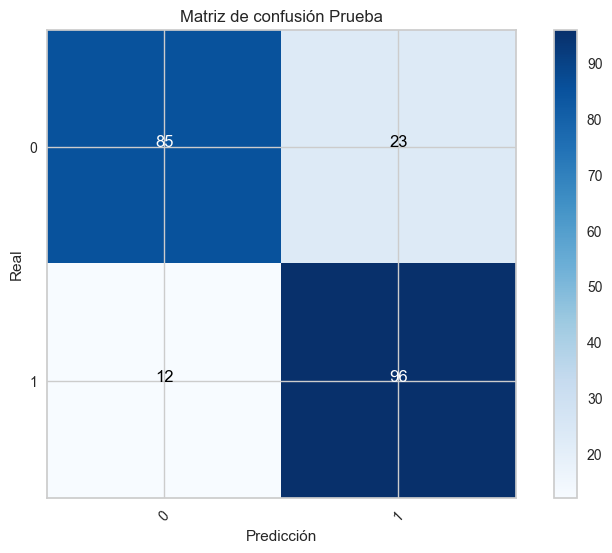

In [316]:
report_and_conf_matrix(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=100,
                               subsample=1),
                       X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

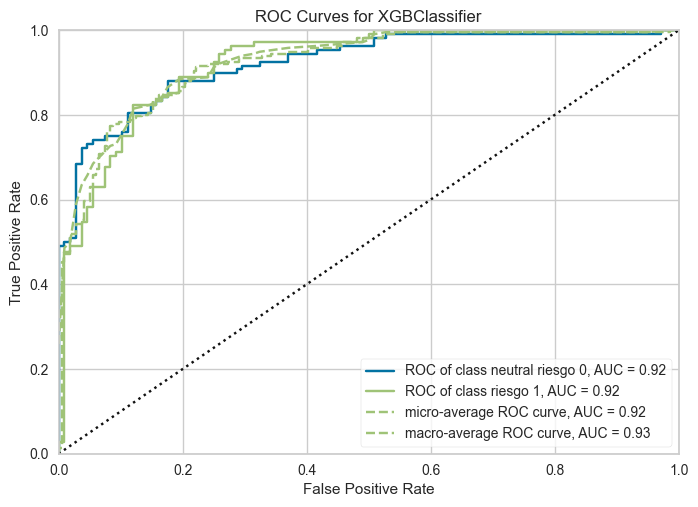

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1'},
       estimator=XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=F...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.03,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=7, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=None,
                               num_parallel_tree=None, random_state=1234, ...))

In [317]:
plot_ROC_curve_xgb(xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=100,
                               subsample=1),
                X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

Conjunto de datos con PCA y feature selection

In [318]:
# Tiempo aproximado: 1.12m

params = {'learning_rate': [0.03,0.3],
                  'subsample'    : [1, 0.5, 0.2],
                  'n_estimators' : [100,500,1000],
                  'max_depth'    : [None,5,7]    
            }

X_t = SelectKBest(score_func=f_classif,k=31).fit_transform(X_train['pca_rem'],y_train['pca_rem'])

tuning_model=GridSearchCV(xgb.XGBClassifier(random_state=1234),
                          param_grid=params,scoring=kappa_scorer,cv=5,verbose=3)
tuning_model.fit(X_t,y_train['pca_rem'])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.664 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.624 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.664 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.703 total time=   0.0s
[CV 5/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=1;, score=0.720 total time=   0.0s
[CV 1/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.664 total time=   0.0s
[CV 2/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.624 total time=   0.0s
[CV 3/5] END learning_rate=0.03, max_depth=None, n_estimators=100, subsample=0.5;, score=0.683 total time=   0.0s
[CV 4/5] END learning_rate=0.03, max

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1234, ...),
             param_grid={'learning_rate': [0.03, 0.3],
                         'max_depth': [None, 5, 7],
                         'n_estimators': [100, 500, 1000],
                         'subsample': [1, 0.5, 0.2]},
             scoring=make_scorer(cohen_kappa_score, response_method='predict'),
             verbose=3)

In [319]:
tuning_model.best_params_

{'learning_rate': 0.03, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.2}

In [320]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=100,
                               subsample=0.2))

model,metrics = classification_metrics(pipeline_xgb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])
pickle.dump(model, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\models_corazon_V2/XGBoostClassifierPCARemFS.pkl','wb'))
pickle.dump(metrics, open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemFSMetrics.pkl','wb'))

Training Accuracy = 0.8849206349206349
Test Accuracy = 0.8472222222222222
Training Kappa = 0.7698412698412699
Test Kappa = 0.6944444444444444
Training Precision = [0.87 0.9 ]
Test Precision = [0.89 0.82]
Training recall = [0.9  0.87]
Test recall = [0.8 0.9]


Reporte Entrenamiento
              precision    recall  f1-score   support

           0       0.87      0.90      0.89       252
           1       0.90      0.87      0.88       252

    accuracy                           0.88       504
   macro avg       0.89      0.88      0.88       504
weighted avg       0.89      0.88      0.88       504



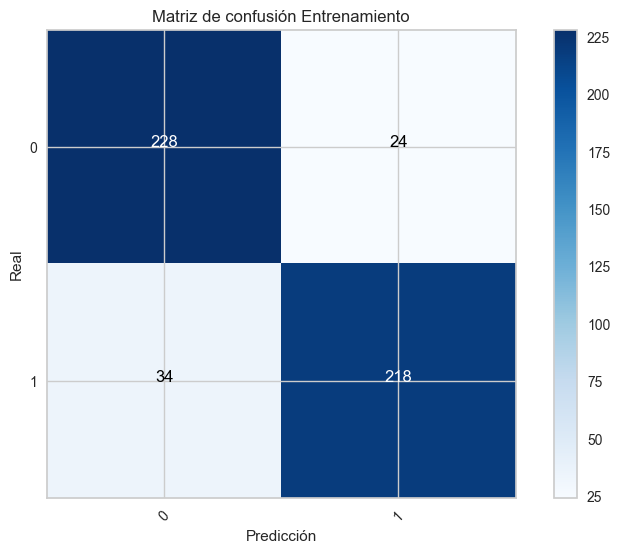

Reporte Prueba
              precision    recall  f1-score   support

           0       0.89      0.80      0.84       108
           1       0.82      0.90      0.85       108

    accuracy                           0.85       216
   macro avg       0.85      0.85      0.85       216
weighted avg       0.85      0.85      0.85       216



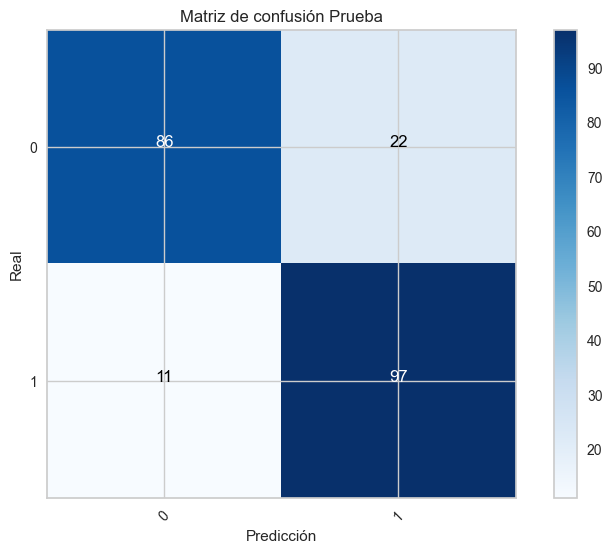

In [321]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=100,
                               subsample=0.2))

report_and_conf_matrix(pipeline_xgb,X_train['pca_rem'],X_test['pca_rem'],y_train['pca_rem'],y_test['pca_rem'])

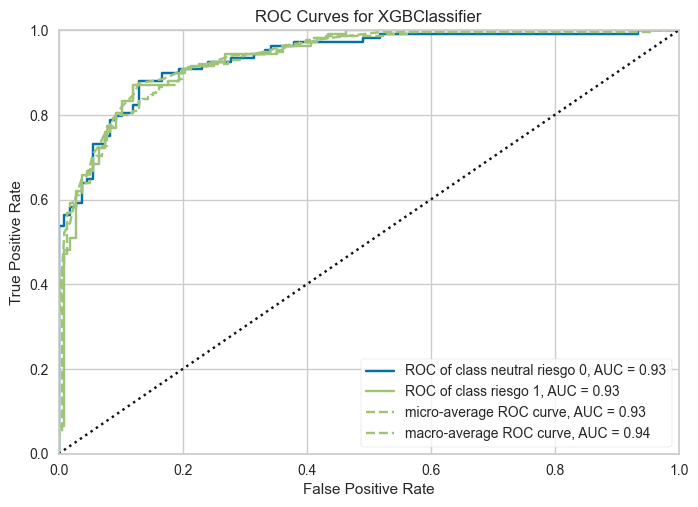

ROCAUC(ax=<Axes: title={'center': 'ROC Curves for XGBClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>,
       encoder={0: 'neutral riesgo 0', 1: 'riesgo 1'},
       estimator=Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                                 ('xgbclassifier',
                                  XGBClassifier(base_score=None, booster=None,
                                                callbacks=None,
                                                colsample_bylevel=None,
                                                colsample_bynode=None,
                                                colsample_bytr...
                                                grow_policy=None,
                                                importance_type=None,
                                                interaction_constraints=None,
                                                learning_rate=0.03,
                                                max_bin=None,
                                                max_cat_threshold=None,
                                                max_cat_to_onehot=None,
                                                max_delta_step=None,
                                                max_depth=7, max_leaves=None,
                                                min_child_weight=None,
                                                missing=nan,
                                                monotone_constraints=None,
                                                multi_strategy=None,
                                                n_estimators=100, n_jobs=None,
                                                num_parallel_tree=None,
                                                random_state=1234, ...))]))

In [322]:
pipeline_xgb = make_pipeline(SelectKBest(score_func=f_classif,k=31),
                             xgb.XGBClassifier(random_state=1234,
                               learning_rate=0.03,
                               max_depth=7,
                               n_estimators=100,
                               subsample=0.2))

plot_ROC_curve_xgb(pipeline_xgb,X_train=X_train['pca_rem'], y_train=y_train['pca_rem'],X_test=X_test['pca_rem'], y_test=y_test['pca_rem'])

### 8. Comparación de los distintos modelos

Cargamos las métricas de los modelos previamente guardados 

In [323]:
metrics = list()
names = list()
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemMetrics.pkl','rb')))
names.append('logisticRegressionRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionRemFSMetrics.pkl','rb')))
names.append('logisticRegressionRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemMetrics.pkl','rb')))
names.append('logisticRegressionPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/logisticRegressionPCARemFSMetrics.pkl','rb')))
names.append('logisticRegressionPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierRemMetrics.pkl','rb')))
names.append('KnnClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/KnnClassifierPCARemMetrics.pkl','rb')))
names.append('KnnClassifiePCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemMetrics.pkl','rb')))
names.append('NBClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierRemFSMetrics.pkl','rb')))
names.append('NBClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemMetrics.pkl','rb')))
names.append('NBClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/NBClassifierPCARemFSMetrics.pkl','rb')))
names.append('NBClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemMetrics.pkl','rb')))
names.append('DecisionTreeClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierRemFSMetrics.pkl','rb')))
names.append('DecisionTreeClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemMetrics.pkl','rb')))
names.append('DecisionTreeClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/DecisionTreeClassifierPCARemFSMetrics.pkl','rb')))
names.append('DecisionTreeClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemMetrics.pkl','rb')))
names.append('RandomForestClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierRemFSMetrics.pkl','rb')))
names.append('RandomForestClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemMetrics.pkl','rb')))
names.append('RandomForestClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/RandomForestClassifierPCARemFSMetrics.pkl','rb')))
names.append('RandomForestClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemMetrics.pkl','rb')))
names.append('GradientBoostingClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierRemFSMetrics.pkl','rb')))
names.append('GradientBoostingClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemMetrics.pkl','rb')))
names.append('GradientBoostingClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/GradientBoostingClassifierPCARemFSMetrics.pkl','rb')))
names.append('GradientBoostingClassifierPCARemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemMetrics.pkl','rb')))
names.append('XGBoostClassifierRemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierRemFSMetrics.pkl','rb')))
names.append('XGBoostClassifierRemFSMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemMetrics.pkl','rb')))
names.append('XGBoostClassifierPCARemMetrics')
metrics.append(pickle.load(open(r'C:\Users\alfa7\OneDrive\Documentos\ICESI\MAESTRIA CIENCIA DE DATOS\1er semestre\Gestion Estrategica I\Proyecto aplicado\2. tareas clasificacion\metrics_corazon_V2/XGBoostClassifierPCARemFSMetrics.pkl','rb')))
names.append('XGBoostClassifierPCARemFSMetrics')

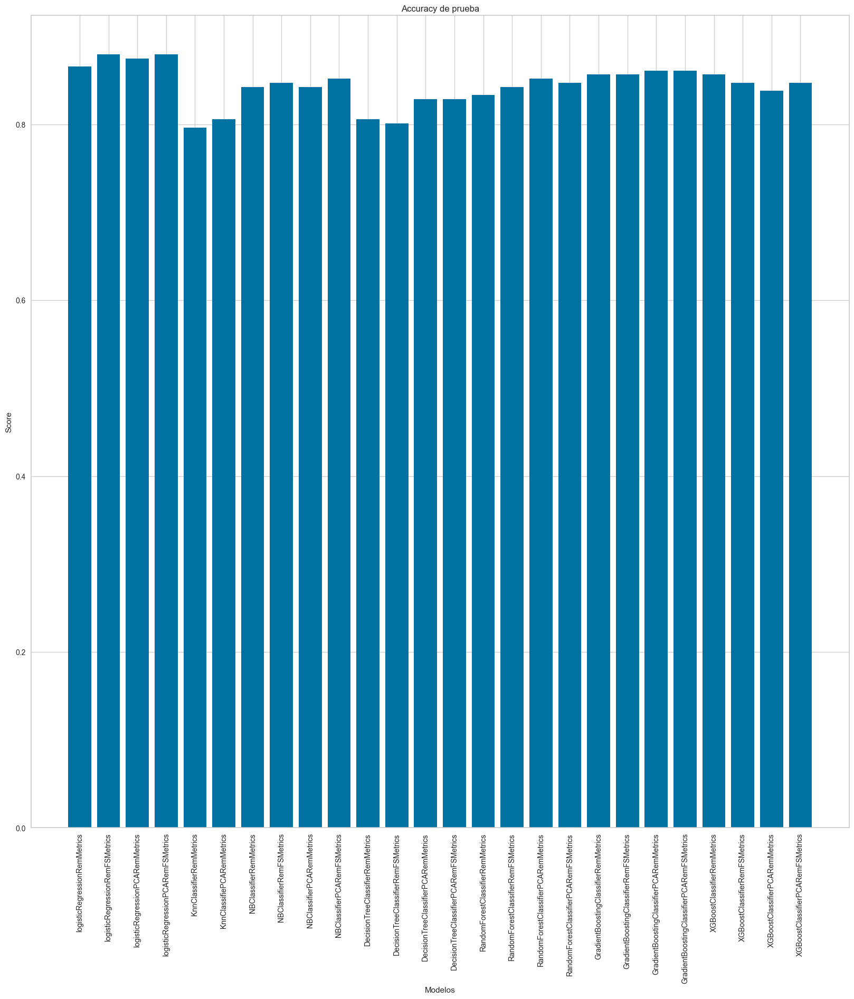

In [324]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Accuracy de prueba

fig, ax = plt.subplots()
fig.set_size_inches((20,20))
ax.bar(names, [i['Test Accuracy'] for i in metrics])
ax.set(title='Accuracy de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

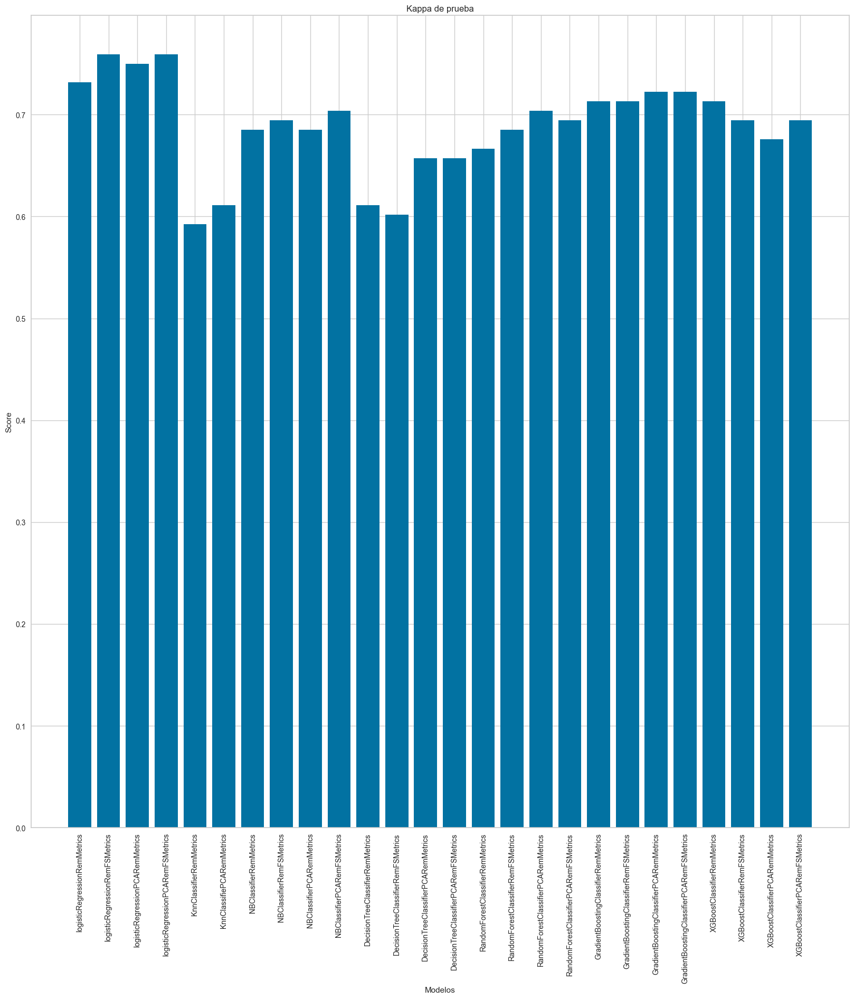

In [325]:
# Diagrama de barras para observar el modelo más importante de acuerdo al Kappa de prueba

fig, ax = plt.subplots()
fig.set_size_inches((20,20))
ax.bar(names, [i['Test Kappa'] for i in metrics])
ax.set(title='Kappa de prueba',xlabel='Modelos',ylabel='Score')
plt.xticks(rotation='vertical')
plt.show()

In [326]:
# Se organizan los modelos de acuerdo a su Accuracy de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Accuracy'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Accuracy'])
for model in models:
    ranking = pd.concat([ranking, pd.DataFrame([{'Model':model[0],'Test Accuracy':model[1]['Test Accuracy']}])],ignore_index=True)
ranking

,Model,Test Accuracy
0,logisticRegressionRemFSMetrics,0.879630
1,logisticRegressionPCARemFSMetrics,0.879630
2,logisticRegressionPCARemMetrics,0.875000
3,logisticRegressionRemMetrics,0.865741
4,GradientBoostingClassifierPCARemMetrics,0.861111
5,GradientBoostingClassifierPCARemFSMetrics,0.861111
6,GradientBoostingClassifierRemMetrics,0.856481
7,GradientBoostingClassifierRemFSMetrics,0.856481
8,XGBoostClassifierRemMetrics,0.856481
9,NBClassifierPCARemFSMetrics,0.851852


In [327]:
# Se organizan los modelos de acuerdo a su Kappa de prueba

models = [(names[i],metrics[i]) for i in range(len(names))]
models = sorted(models,key=lambda x:x[1]['Test Kappa'],reverse=True)
ranking = pd.DataFrame(columns=['Model','Test Kappa'])
for model in models:
    ranking = pd.concat([ranking, pd.DataFrame([{'Model':model[0],'Test Kappa':model[1]['Test Kappa']}])],ignore_index=True)
ranking

,Model,Test Kappa
0,logisticRegressionRemFSMetrics,0.759259
1,logisticRegressionPCARemFSMetrics,0.759259
2,logisticRegressionPCARemMetrics,0.750000
3,logisticRegressionRemMetrics,0.731481
4,GradientBoostingClassifierPCARemMetrics,0.722222
5,GradientBoostingClassifierPCARemFSMetrics,0.722222
6,GradientBoostingClassifierRemMetrics,0.712963
7,GradientBoostingClassifierRemFSMetrics,0.712963
8,XGBoostClassifierRemMetrics,0.712963
9,NBClassifierPCARemFSMetrics,0.703704
